# Project for the Data Analysis and Representation Course

### Topic: Classification whether patient had a stroke based on their health data
#### Authors: Marta Kacperska and Kacper Chabros

link to the dataset: https://www.kaggle.com/datasets/jillanisofttech/brain-stroke-dataset/data  

Necessery imports:

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import math

import matplotlib.cm as cm

from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score, f1_score

pd.options.display.float_format = "{:.2f}".format 

from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import NearestCentroid
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import confusion_matrix
from sklearn import tree

from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTE

# 1. Read the dataset from the file

In [3]:
df = pd.read_csv("brain_stroke.csv")
df.head()

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,Male,67.00,0,1,Yes,Private,Urban,228.69,36.60,formerly smoked,1
1,Male,80.00,0,1,Yes,Private,Rural,105.92,32.50,never smoked,1
2,Female,49.00,0,0,Yes,Private,Urban,171.23,34.40,smokes,1
3,Female,79.00,1,0,Yes,Self-employed,Rural,174.12,24.00,never smoked,1
4,Male,81.00,0,0,Yes,Private,Urban,186.21,29.00,formerly smoked,1


# 2. Familiarizing with the dataset

We perform the necessary operations to familiarize ourselves with the data frame. We check its dimensions, the number of classes, missing data, and possible values of categorical attributes.

In [4]:
def describeDataSet(frame, classAtr):
    numOfObjects, numOfAttributes = frame.shape
    print("Number of objects in dataset: {0}".format(numOfObjects))
    print("Number of attributes in dataset: {0}".format(numOfAttributes))

    classes = frame[classAtr].unique()
    print("Number of classes: {0}".format(len(classes)))

    obsPerClass = frame[classAtr].value_counts()
    obsPerClass = obsPerClass.sort_index()
    print("Number of observations per class: \n{0}".format(obsPerClass))

    print("Number of fields with missing data: {0}".format(pd.isnull(frame).sum().sum()))

In [5]:
def showValuesForCategoricalAttributes(frame, attributes):
    for attribute in attributes:
        print("Values for {0}".format(attribute))
        print(frame[attribute].unique(),"\n")

In [6]:
describeDataSet(df, "stroke")

Number of objects in dataset: 4981
Number of attributes in dataset: 11
Number of classes: 2
Number of observations per class: 
stroke
0    4733
1     248
Name: count, dtype: int64
Number of fields with missing data: 0


In [7]:
showValuesForCategoricalAttributes(df, ["gender", "hypertension", "heart_disease", "ever_married", "work_type", "Residence_type", "smoking_status"])

Values for gender
['Male' 'Female'] 

Values for hypertension
[0 1] 

Values for heart_disease
[1 0] 

Values for ever_married
['Yes' 'No'] 

Values for work_type
['Private' 'Self-employed' 'Govt_job' 'children'] 

Values for Residence_type
['Urban' 'Rural'] 

Values for smoking_status
['formerly smoked' 'never smoked' 'smokes' 'Unknown'] 



## Description of the dataset
* The dataset consists of_ 4981 observations characterized by 11 attributes (including the decisive attribute).
* The decisive attribute is the stroke attribute, indicating whether a person had a stroke or not. It takes the following values:
    * _**0**_ - the patient didn't have a stroke
    * _**1**_ - the patient had a stroke
* There is a significant imbalance in the dataset, with a majority of individuals (4733) not having had a stroke, while 248 individuals had a stroke.
* There are no missing observations in the dataset, so we do not need to consider removing them.
* The dataset includes 3 numerical attributes:
    * _**age**_ - describes the age of the patient *
    * _**bmi**_ - the Body Mass Index (BMI) of the patient **
    * _**avg_glucose_level**_ - the average glucose level of the patient
* There are 7 categorical attributes in the dataset:
    * _**gender**_ -  describes the gender of the patient. Possible values:
        * _**Female**_ - the patient is female
        * _**Male**_ - the patient is male
    * _**hypertension**_ - indicates whether the patient has hypertension. Possible values:
        * _**0**_ - the patient does not have hypertension
        * _**1**_ - the patient has hypertension
    * _**heart_disease**_ - indicates whether the patient has heart disease. Possible values:
        * _**0**_ - the patient does not have heart disease
        * _**1**_ - the patient has heart disease
    * _**ever_married**_ -  indicates whether the patient has ever been married. Possible values:
        * _**No**_ - the patient has never been married
        * _**Yes**_ - the patient has been or is married
    * _**work_type**_ - indicates the sector in which the patient is employed. Possible values:
        * _**children**_ - the patient is a child
        * _**Self_employed**_ - the patient is self-employed
        * _**Private**_ -  the patient works in the private sector
        * _**Govt_job**_ - the patient works in the public sector
    * _**Residence_type**_ - indicates the patient's area of residence. Possible values:
        * _**Urban**_ - the patient lives in an urban area
        * _**Rural**_ - the patient lives in a rural area
    * _**smoking_status**_ - indicates the patient's smoking status. Possible values:
        * _**smokes**_ - the patient smokes
        * _**formerly smoked**_ - the patient formerly smoked
        * _**never smoked**_ - the patient has never smoked
        * _**Unknown**_ - smoking status is unknown for this patient.

\* BMI values according to WHO:
|       BMI     |     DESCRIPTION    |
| --------------| ------------|
| Below 18.5    | Underweight |
| 18.5 - 24.9   | Normal weight|
| 25.0 - 29.9   | Overweight |
| 30.0 - 34.9   | Obesity Class 1 |
| 35.0 - 39.9   | Obesity Class 2 |
| Above 40.0    | Obesity Class 3 |

\*\*  Average glucose level values according to WHO:
|Average Glucose Level [mg/dL]|     DESCRIPTION    |
| --------------| ------------|
| Below 70      | Low        |
| 70-100        | Expected |
| 100-125       | Elevated |
| Above 126   | Diabetes Diagnosis  |
 

### Mapping Attribute Values for a More Human-Friendly Exploratory Analysis
In this step, we perform the following transformations:
* Change the data types of attributes _**hypertension, heart_disease, stroke**_ to boolean.
* Convert values in the _**ever_married**_ column from _**Yes, No**_ to _**True, False**_. This involves converting the attribute to a boolean type.

In [8]:
df["hypertension"] = df["hypertension"].astype("bool")
df["heart_disease"] = df["heart_disease"].astype("bool")
df["stroke"] = df["stroke"].astype("bool")
df["ever_married"] = df["ever_married"].map({"Yes": True, "No": False})
df.head()

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,Male,67.00,False,True,True,Private,Urban,228.69,36.60,formerly smoked,True
1,Male,80.00,False,True,True,Private,Rural,105.92,32.50,never smoked,True
2,Female,49.00,False,False,True,Private,Urban,171.23,34.40,smokes,True
3,Female,79.00,True,False,True,Self-employed,Rural,174.12,24.00,never smoked,True
4,Male,81.00,False,False,True,Private,Urban,186.21,29.00,formerly smoked,True


# 3. Exploratory Analysis
Below, we create variables containing the names of numerical attributes, categorical attributes, and the decisve attribute for later reference.

In [9]:
numericalAttributes = ["age", "avg_glucose_level", "bmi"]
categoricalAttributes = ["gender", "hypertension", "heart_disease", "ever_married", "work_type", "Residence_type", "smoking_status"]
decisiveAttr = "stroke"

## 3.1 Analysis of Histograms
The first step we take in exploratory analysis is the analysis of histograms for attributes.

In [10]:
def displayHistograms(frame):
    numberOfPlots = frame.shape[1]
    numberOfRows = np.ceil(numberOfPlots / 3).astype("int64")
    plt.figure(figsize=(20,15))
    
    for id, column in enumerate(frame.columns):
        plt.subplot(numberOfRows, 3, id+1)
        plt.tight_layout()
        plt.plot
        sns.histplot(data=frame, x=column)
        plt.title("Histogram for {0}".format(column))
        plt.xlabel(column)
        plt.ylabel("Number of observations")

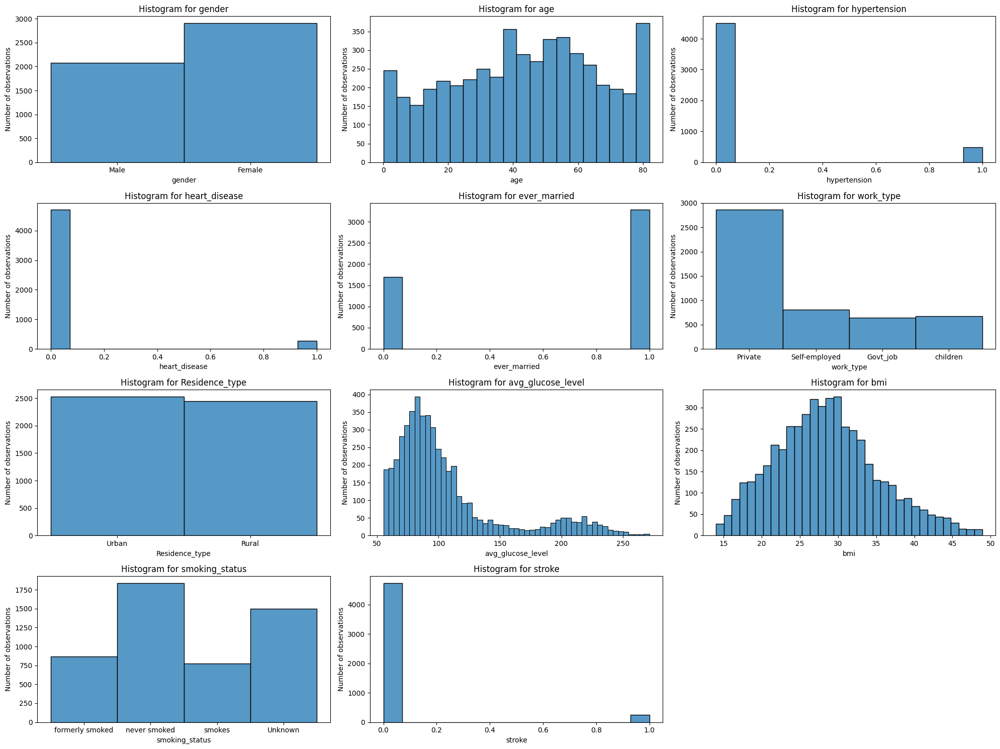

In [11]:
displayHistograms(df)

### Based on the analysis of histograms, the following conclusions can be drawn:
* The dataset shows good diversity in observations regarding smoking status, residence type, gender, and whether the patient has ever been married.
* There is also a large number of observations for each age group.
* Most patients were employed in the private sector.
* The average glucose level in the blood for the majority of subjects falls within the normal range.
* According to the glucose range suggested by the WHO, many patients in the dataset have slightly elevated glucose levels, and many experience low blood sugar levels.
* The distribution of BMI resembles a Gaussian distribution, which is an expected phenomenon.
* An interesting observation is that the number of patients suffering from heart disease and/or hypertension is similar to the number of individuals who have had a stroke. This may suggest a certain correlation.

## 3.2 Analysis of the Variability of Numerical Attributes for the Entire Dataset and Stratified by the Decisive Attribute

In this step, utilizing box plots and violin plots, we will analyze the variability of numerical attributes. First, we will conduct the analysis without dividing the dataset based on the categorical attribute, and then we will perform the analysis with such division.

In [12]:
def displayVariabilityPlotsWithoutClasses(frame, attributes):
    plt.figure(figsize=(15,5), dpi=100)
    plt.subplot(1,2,1)
    sns.boxplot(data=frame.loc[:,attributes])
    plt.subplot(1,2,2)
    sns.violinplot(data=frame.loc[:,attributes])

In [13]:
def displayVariabilityPlotsWithClasses(frame, attributes, classAtr):
    plt.figure(figsize=(15,5), dpi=100)
    classes = frame[classAtr].sort_values().unique()
    numberOfClasses = classes.size
    
    for id, currClass in enumerate(classes):
        plt.subplot(1, 2*numberOfClasses, id+1)
        plt.tight_layout()
        sns.boxplot(data=frame[frame[classAtr] == currClass].loc[:,attributes],palette="bright")
        plt.title("{0}: {1}".format(classAtr, currClass)) 
        plt.subplot(1, 2*numberOfClasses, id + 3)
        sns.violinplot(data=frame[frame[classAtr] == currClass].loc[:,attributes], palette="bright")
        plt.title("{0}: {1}".format(classAtr, currClass)) 

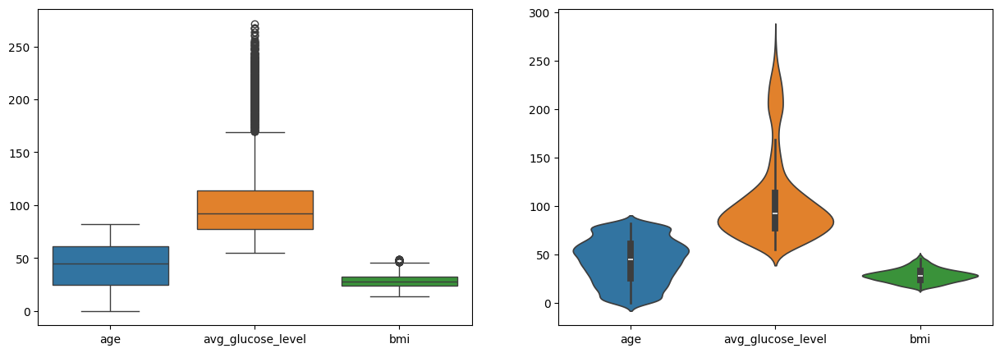

In [14]:
displayVariabilityPlotsWithoutClasses(df, numericalAttributes)

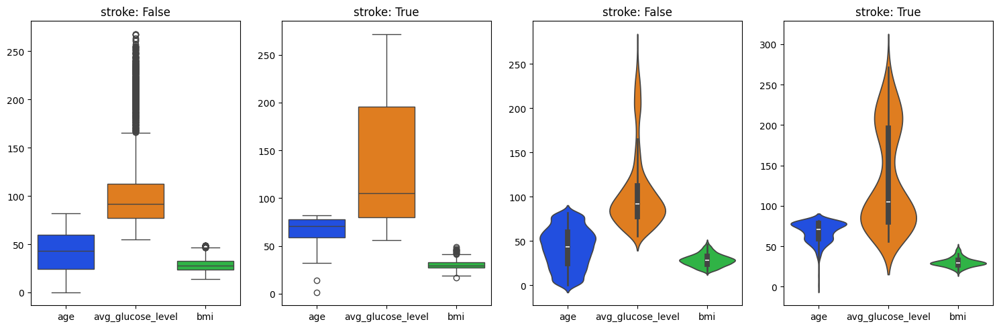

In [15]:
displayVariabilityPlotsWithClasses(df, numericalAttributes, decisiveAttr)

### Conclusions from the Analysis of Variability:
* The average glucose level has the highest variability (range approximately (50-250)), while BMI has the lowest (range approximately (15-50)).
* The most noticeable conclusion comes from the analysis of the average glucose level. The dataset of patients who did not have a stroke has many outliers - individuals with high glucose levels who did not experience a stroke. On the other hand, the distribution of the average glucose level for individuals who had a stroke is bimodal. In this subset, there is a significantly larger number of individuals with high average glucose levels, and they are not classified as outliers. This may suggest that there is a relationship between high glucose levels and stroke, but a high glucose level does not unequivocally determine a stroke.
* Analyzing the variability in age, we observe that individuals who did not have a stroke can be found at any age. The majority of individuals who had a stroke are above the age of 50.
* Despite the above conclusion, it is not a rule; we see two outliers, a child, and a teenager who had a stroke.
* Analyzing the variability in BMI, we see that individuals with a low BMI are less likely to experience a stroke.

## 3.3 Analysis of Histograms for Numerical Attributes Stratified by Categorical Attributes and the Decisive Attribute
In this step, we will conduct an analysis of histograms for quantitative attributes, divided by categorical attributes, to check for potential dependencies between individual categories and decisive attributes. Additionally, each histogram will distinguish between individuals who have not had a stroke and those who have.  
Furthermore, within the histogram area, the mean, standard deviation, and median values of the quantitative attribute will be displayed for the group where the decision attribute is positive. The number of observations for a given category and the ratio of patients with stroke to the total number of observations will also be shown.  
On the Y-axis of the histogram, instead of frequency, probability is displayed. This adjustment has been made to increase the clarity of the chart and facilitate comparisons, as the frequency of the "stroke" group was often too low to be clearly visible on the graph.

In [16]:
def displayHistogramsWithClassesAndCategory(frame, numericalAttributes, classAttr, categoricalAttr):
    classes = frame[classAttr].sort_values().unique()
    categories = frame[categoricalAttr].sort_values().unique()
    

    for currentCategory in categories:
        categoryFrame = frame[frame[categoricalAttr] == currentCategory]
        strokeFrame = categoryFrame[categoryFrame[classAttr] == classes[1]]
        plt.figure(figsize=(15,5), dpi=100)
        for id, numericalAtr in enumerate(numericalAttributes):   
            numberOfBins = (np.ceil(np.sqrt(frame.shape[0]))/ 2.5).astype("int64")
            plt.subplot(1, 3, id+1)
            plt.tight_layout()
            sns.histplot(categoryFrame, x=numericalAtr, hue=classAttr, bins=numberOfBins, stat="probability", alpha=0.5, palette=["#add8e6", "#EF0307"])

            plt.title("{0} for: {1}".format(numericalAtr, currentCategory))
            plt.suptitle("Analysis for {0}: {1}\nNumber of observations: {2}, Stroke ratio: {3}"
                         .format(categoricalAttr, currentCategory, categoryFrame.shape[0], np.round((strokeFrame.shape[0]/categoryFrame.shape[0]), 4)), size = 17)
            
            frameForStats = categoryFrame[categoryFrame[classAttr] == classes[1]].loc[:,numericalAtr]
            plt.figtext(id*0.33, 0, "Stats after stroke: average: {0}, median: {1}, std: {2}"
                        .format(frameForStats.mean().round(2), frameForStats.median(), frameForStats.std().round(2)))
        plt.show()

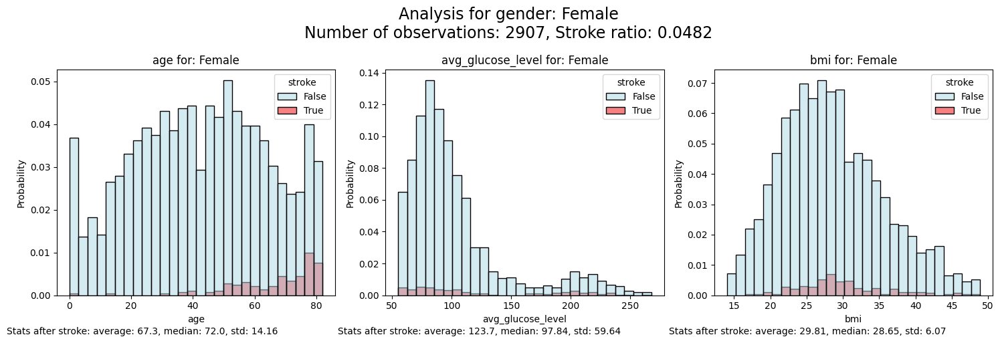

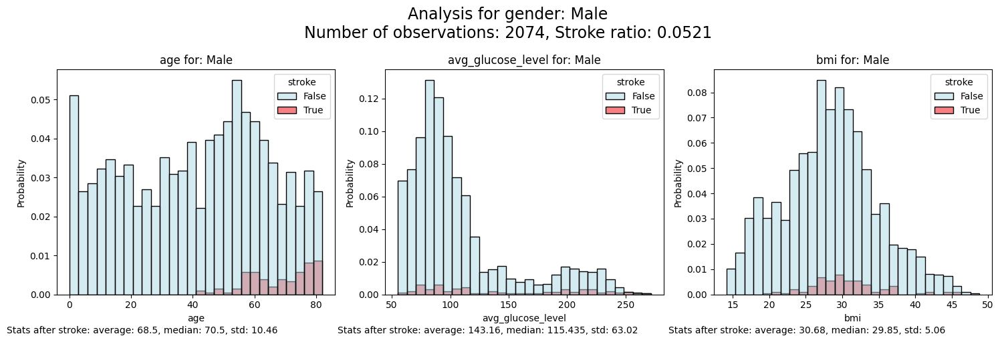

In [17]:
displayHistogramsWithClassesAndCategory(df, numericalAttributes, decisiveAttr, categoricalAttributes[0])

### Conclusions from the Analysis of Histograms Stratified by Gender and Decisive Attribute:
* Statistically, based on the examined group, men slightly more often experience a stroke.
* Strokes typically occur in older individuals, although there are patients who experience a stroke below the age of 40. These are women.
* Surprisingly, a significant number of individuals experience a stroke despite having an average glucose level within the normal range. For men experiencing a stroke, the median average glucose level is indeed above the normal level, but for women, it falls within the normal range.
* Women with a low blood glucose level more frequently fall victim to a stroke than men with a low level.
* Women generally have a smaller BMI than men; however, extremely high BMI is more frequently achieved by women.
* The highest number of strokes occurs in individuals with BMI indicating overweight and obesity, regardless of gender.

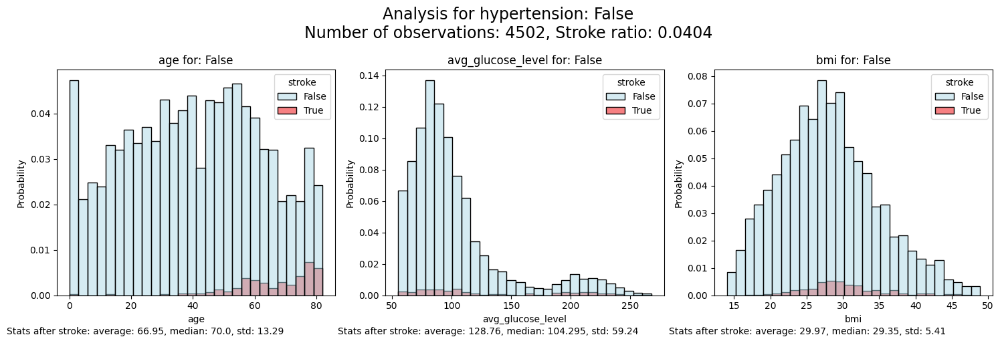

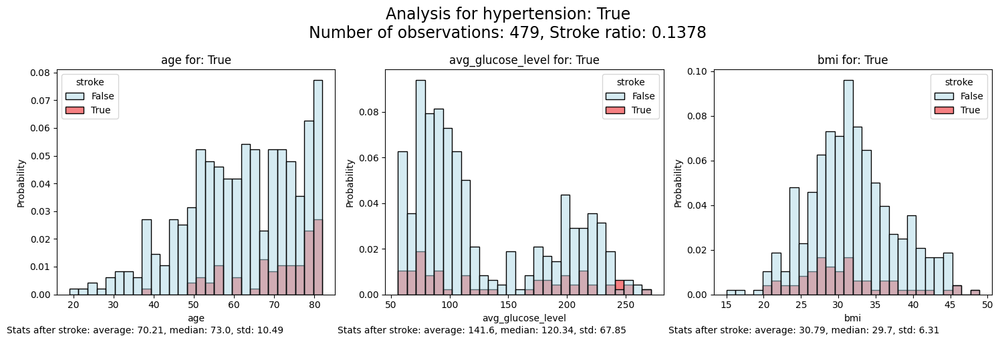

In [18]:
displayHistogramsWithClassesAndCategory(df, numericalAttributes, decisiveAttr, categoricalAttributes[1])

### Conclusions from the Analysis of Histograms Stratified by Hypertension and Decisive Attribute:
* The probability of having a stroke drastically increases if a patient has hypertension.
* The probability of suffering from hypertension increases around the age of 40.
* There is a higher probability that if a person has an elevated blood glucose level, they also have hypertension, but it is not a rule. Still, there are more individuals with low glucose levels even among those suffering from hypertension.
* The dominant BMI among individuals with hypertension is shifted above 30.
* Interestingly, when considering hypertension, we see that a large proportion of individuals who had a stroke had low and normal glucose levels.
* BMI among individuals with hypertension who had a stroke is quite often within the normal range.

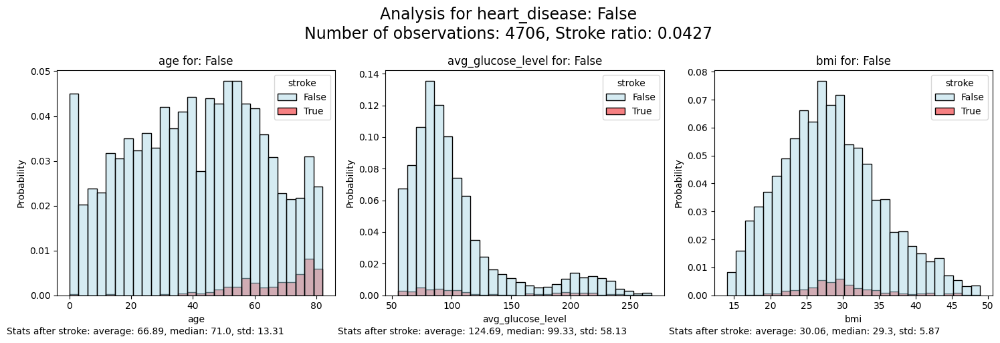

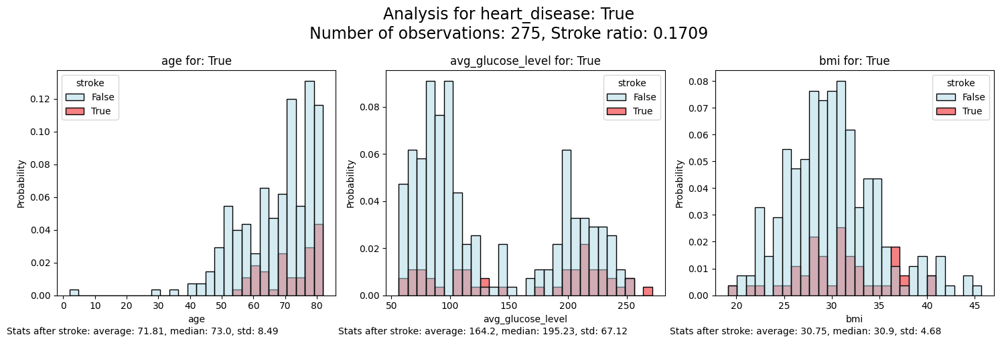

In [19]:
displayHistogramsWithClassesAndCategory(df, numericalAttributes, decisiveAttr, categoricalAttributes[2])

### Conclusions from the Analysis of Histograms Stratified by Heart Disease and Decisive Attribute:
* The probability of having a stroke drastically increases when a patient has heart disease. Almost one in five individuals with heart disease experiences a stroke.
* Heart diseases typically begin to occur after the age of 40.
* Individuals with heart diseases have a distinctly bimodal distribution of average glucose levels. Among those who had a stroke, critically elevated glucose levels around 220 predominate.
* The majority of individuals with heart diseases have a BMI around 30.
* Measures of central tendency are also higher for individuals with heart disease who had a stroke.

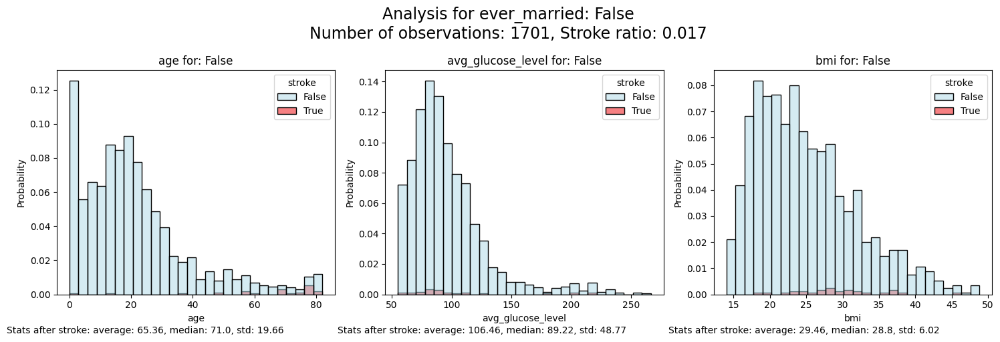

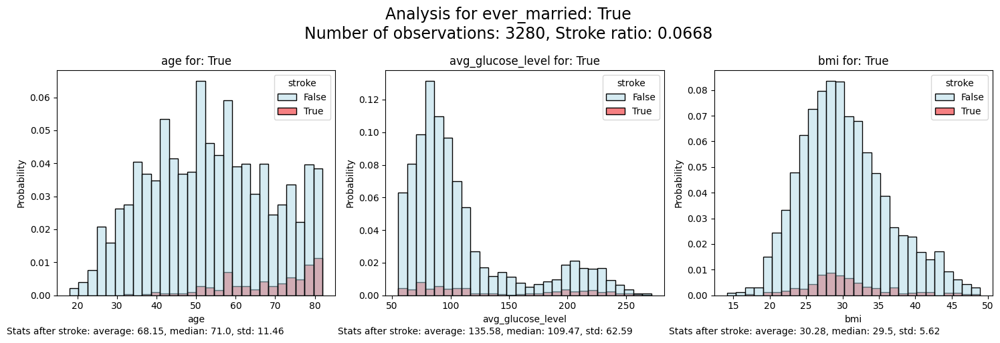

In [20]:
displayHistogramsWithClassesAndCategory(df, numericalAttributes, decisiveAttr, categoricalAttributes[3])

### Conclusions from the Analysis of Histograms Stratified by Ever-Married Status and Decisive Attribute:
* Statistically, individuals who have ever been married more often experience a stroke. However, this may be related to age, as the vast majority of observations for individuals who have never been married are young people, who have a lower chance of hypertension and heart diseases.
* The histogram for average glucose level is similar, with the difference that individuals who have ever been married more often have values above 200.
* Individuals who are not married have significantly lower BMI. This may also be related to age.
* Measures of central tendency are also higher for the positive attribute values in this case.

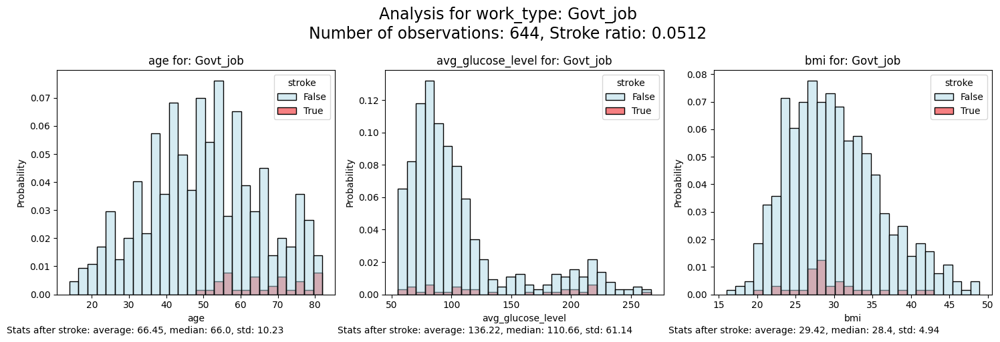

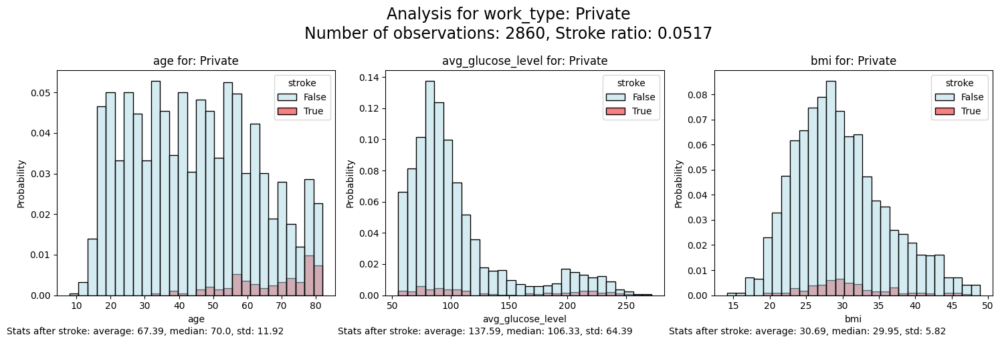

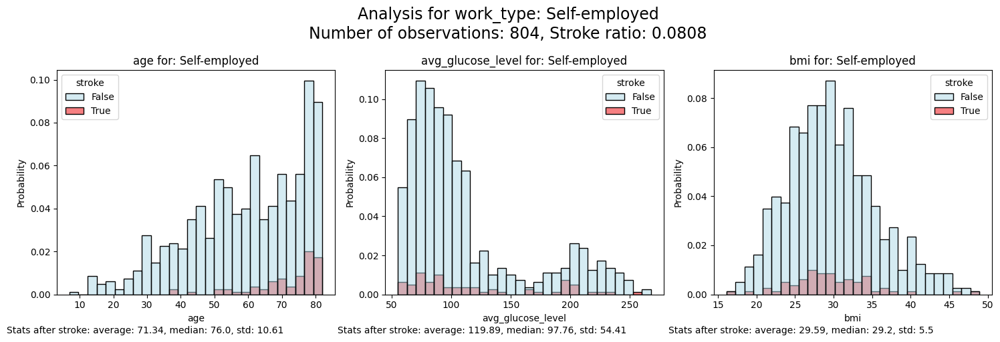

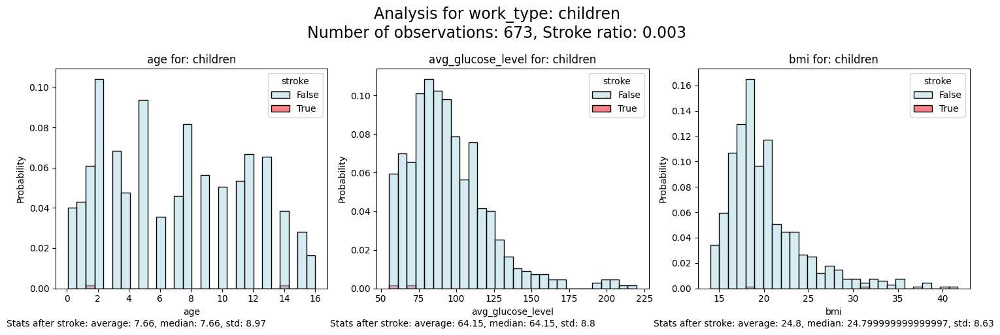

In [21]:
displayHistogramsWithClassesAndCategory(df, numericalAttributes, decisiveAttr, categoricalAttributes[4])

### Conclusions from the Analysis of Histograms Stratified by Employment Type and Decisive Attribute:
* Children are significantly less prone to stroke. Such cases occur sporadically.
* Individuals employed in the private and public sectors have a similar frequency of strokes.
* Self-employed individuals have the highest probability of stroke. This may be related to the stress associated with running their own business.
* A concerning observation is the presence of individuals below the age of 16 with employment status other than "children". Assuming that a person below the age of 16 cannot be an employee, let alone run their own business, we decided to remove these records.

In [22]:
objects = df[((df["work_type"] != "children") & (df["age"] < 16))].shape[0]
print("Number of employed children: {0}".format(objects))

Number of employed children: 60


In [23]:
df2 = df.drop(df[((df["work_type"] != "children") & (df["age"] < 16))].index)
describeDataSet(df2, "stroke")

Number of objects in dataset: 4921
Number of attributes in dataset: 11
Number of classes: 2
Number of observations per class: 
stroke
False    4673
True      248
Name: count, dtype: int64
Number of fields with missing data: 0


We removed 60 records that we considered erroneous. We will perform the analysis of histograms again, divided by the type of employment.

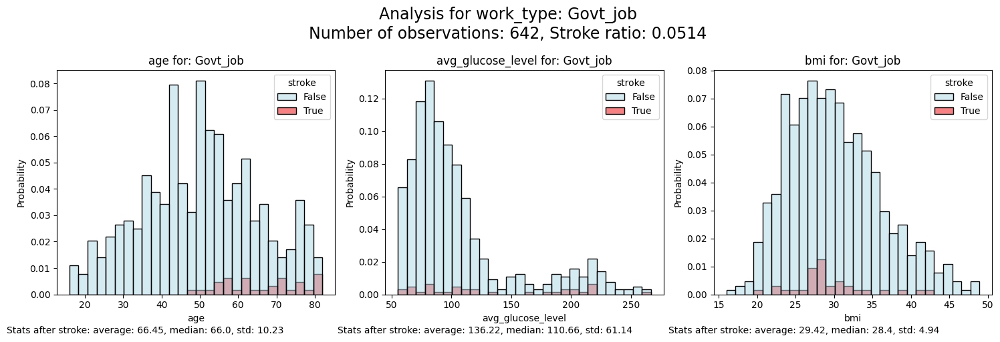

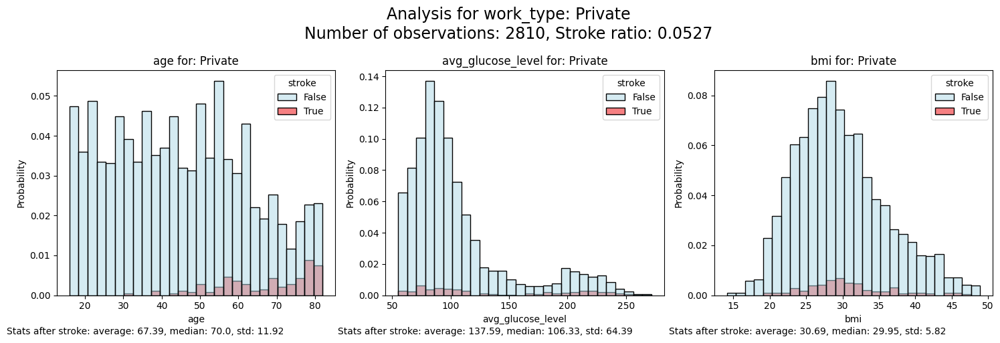

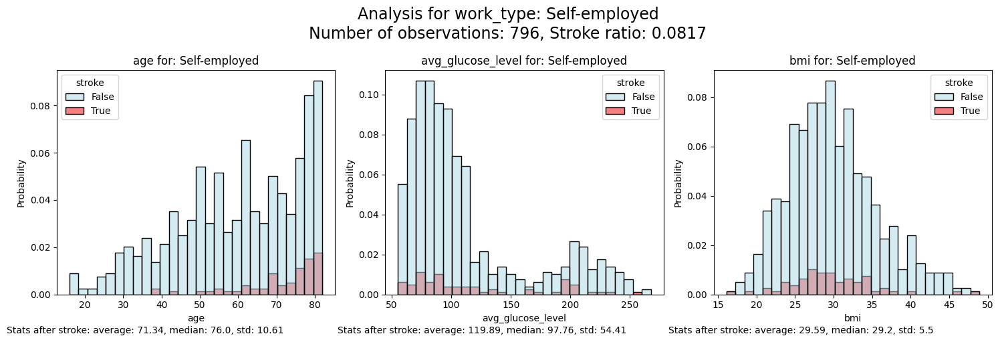

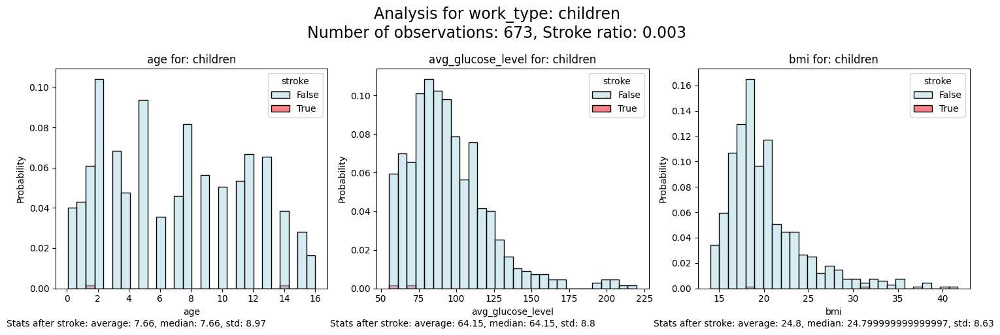

In [24]:
displayHistogramsWithClassesAndCategory(df2, numericalAttributes, decisiveAttr, categoricalAttributes[4])

### Conclusions from the Analysis of Histograms Stratified by Employment Type and Decisive Attribute:
* The removal of records did not change the validity of the previous conclusions.
* Children exhibit glucose levels close to normal. Some have lower levels, while others have higher levels.
* Most children have a healthy weight.
* Individuals deciding to start their own business are generally older.
* The private sector has a relatively uniform age distribution, while the public sector employs the most individuals around the age of 50.
* The incidence of strokes in self-employment may also be related to the age of individuals choosing this type of activity.
* The distributions of average glucose levels are very similar for each type of employment.
* BMI levels are also similar.

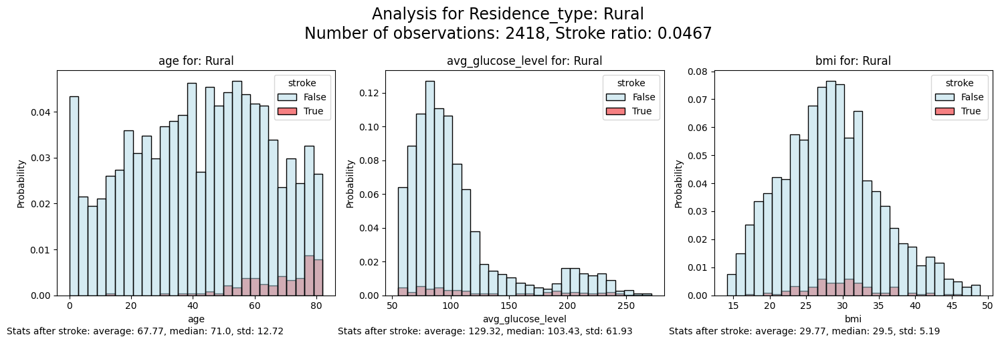

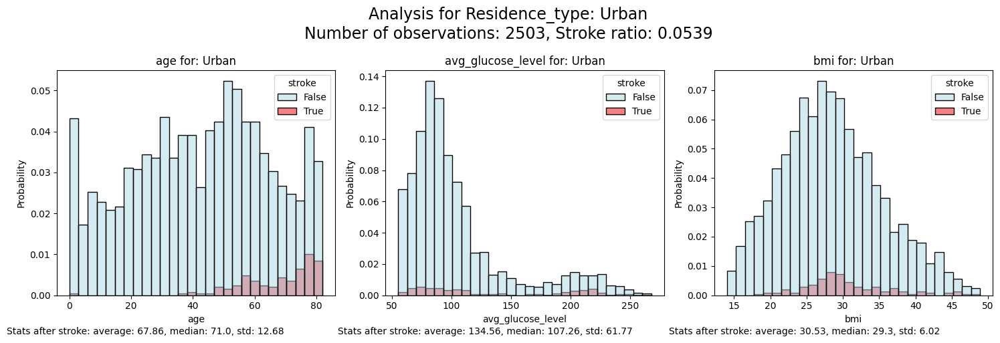

In [25]:
displayHistogramsWithClassesAndCategory(df2, numericalAttributes, decisiveAttr, categoricalAttributes[5])

### Conclusions from the Analysis of Histograms Stratified by Residence Type and Decisive Attribute:
* Place of residence does not depend on age.
* Blood glucose levels also have a very similar distribution.
* BMI does not differ significantly in distribution based on residence type. We can only observe a slightly higher probability of stroke around BMI=30 in the group of individuals living in urban areas.

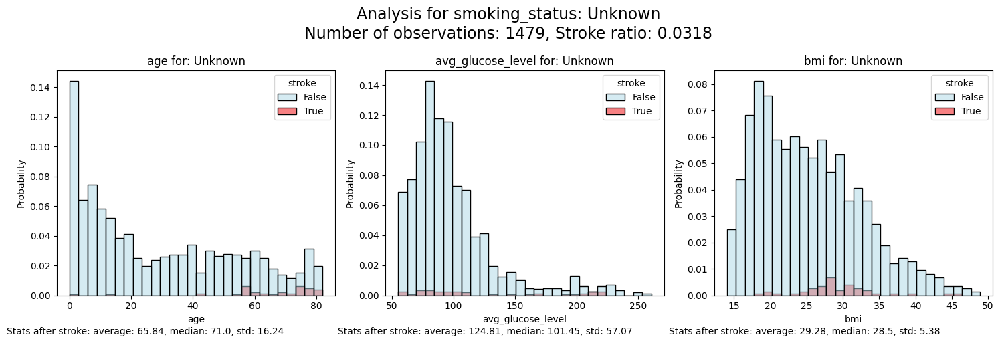

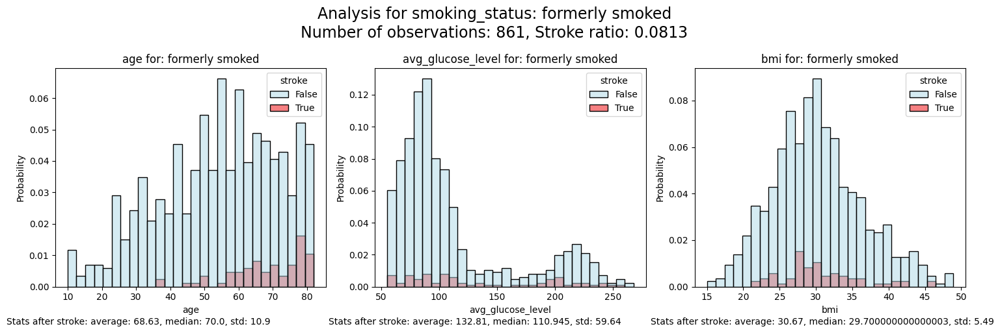

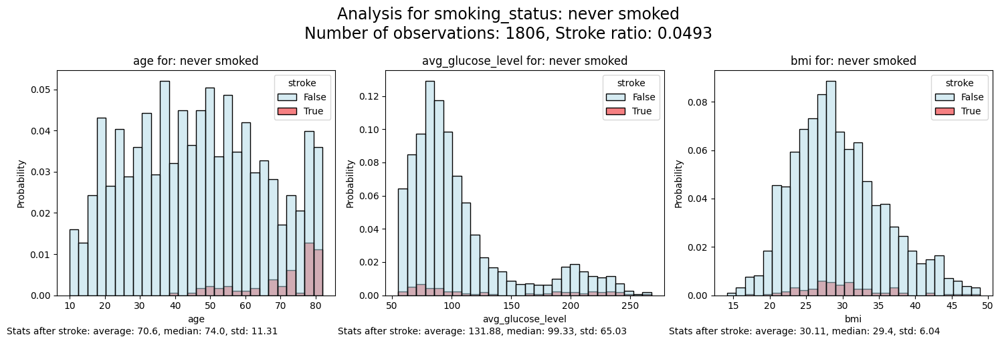

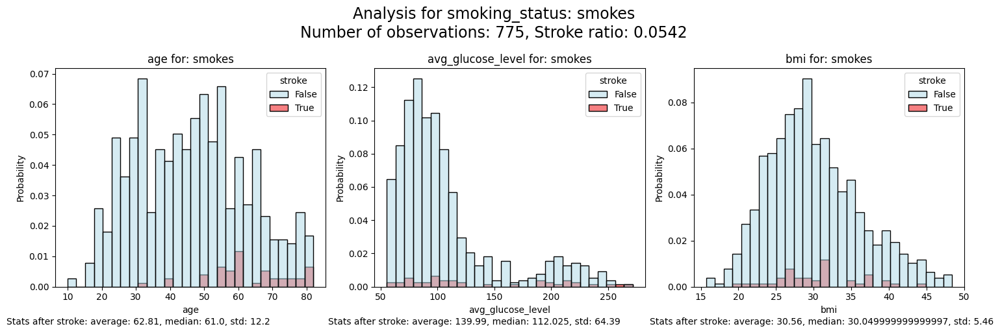

In [26]:
displayHistogramsWithClassesAndCategory(df2, numericalAttributes, decisiveAttr, categoricalAttributes[6])

### Conclusions from the Analysis of Histograms Stratified by Smoking Status and Decisive Attribute:
* The "Unknown" status is mostly assigned to children. After reaching approximately 20 years of age, this distribution becomes more or less uniform. Due to the dominance of young people, the "Unknown" group also has normal blood glucose levels and lower BMI.
* The number of individuals who have never smoked does not have a uniform distribution in terms of age.
* The number of current smokers somewhat resembles the shape of a normal distribution in terms of age.
* The number of individuals who have quit smoking increases with age.
* A concerning observation is the presence of children in the group of current and former smokers.
* The highest probability of individuals with a blood glucose level exceeding 200 is in the group of former smokers.
* BMI distributions are also similar for all groups.
* In BMI distributions, we see that the group of former smokers has significantly higher "peaks" of stroke incidence.
* Individuals who smoke and have had a stroke have much lower values of central tendency measures for age.

### 3.4 Cluster Analysis Stratified by Categorical Attributes and Decisive Attribute
In this step, we will examine whether there are clusters in scatter plots for categorical attributes when stratified by categorical attributes and the decisive attribute.

In [27]:
def displayClustersForCategoricalAttributes(frame, numericalAttributes, categoricalAttributes):
    attributesForPairplot = numericalAttributes.copy()
    for categoricalAttribute in categoricalAttributes:
        attributesForPairplot.append(categoricalAttribute)
        plt.figure(figsize=(5,5))
        sns.pairplot(frame.loc[:,attributesForPairplot], hue=categoricalAttribute, palette="bright", plot_kws={'alpha':0.5})
        attributesForPairplot.remove(categoricalAttribute)
        plt.show()

<Figure size 500x500 with 0 Axes>

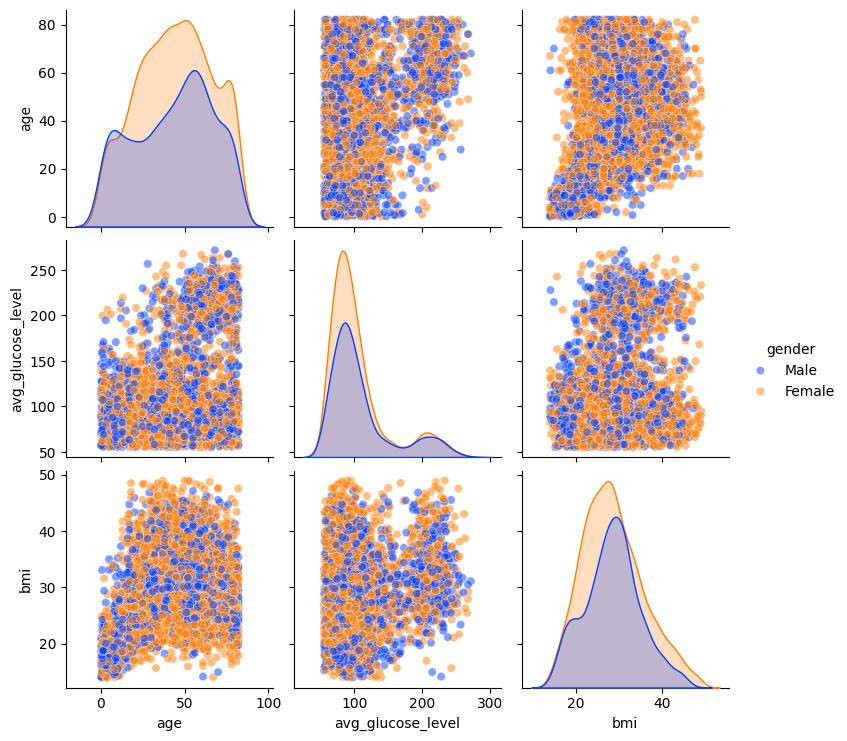

<Figure size 500x500 with 0 Axes>

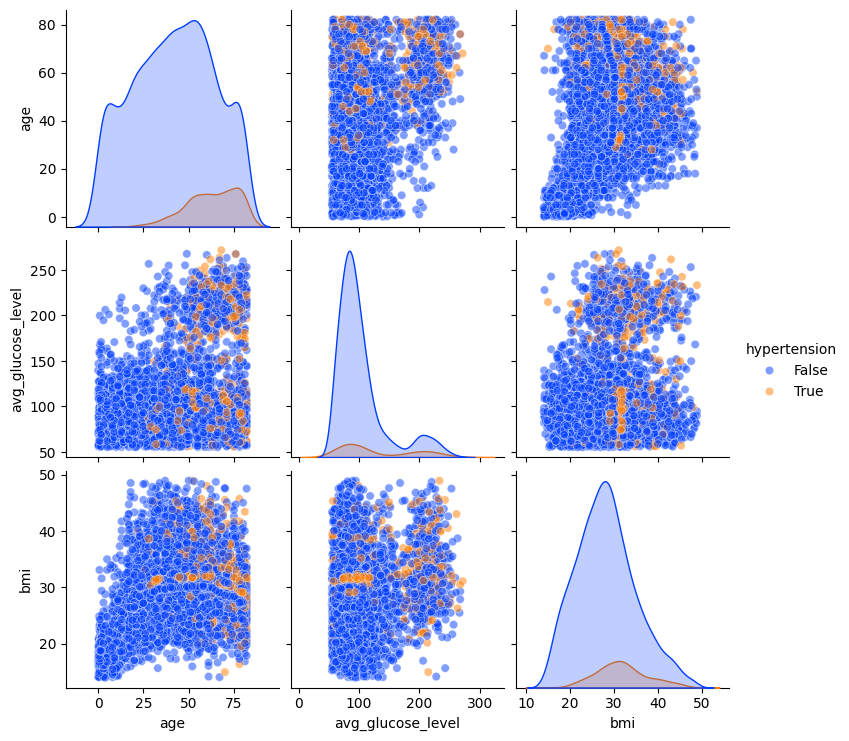

<Figure size 500x500 with 0 Axes>

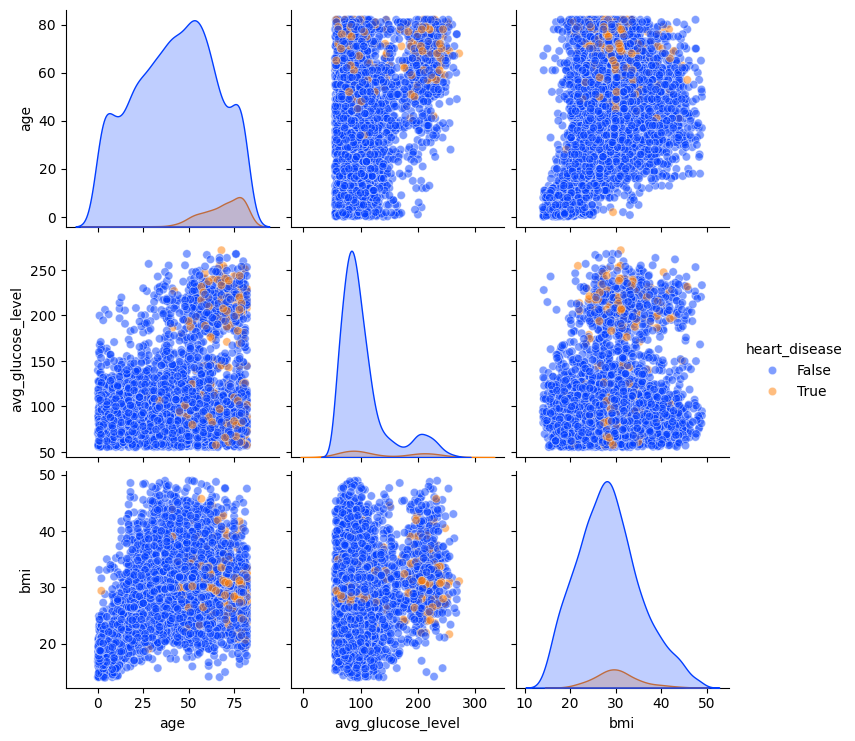

<Figure size 500x500 with 0 Axes>

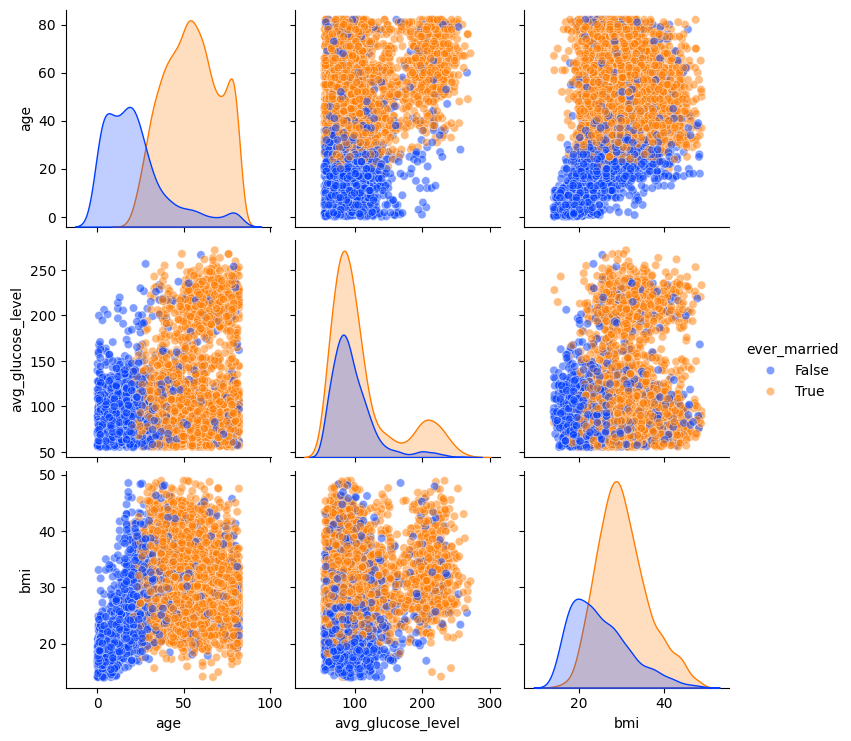

<Figure size 500x500 with 0 Axes>

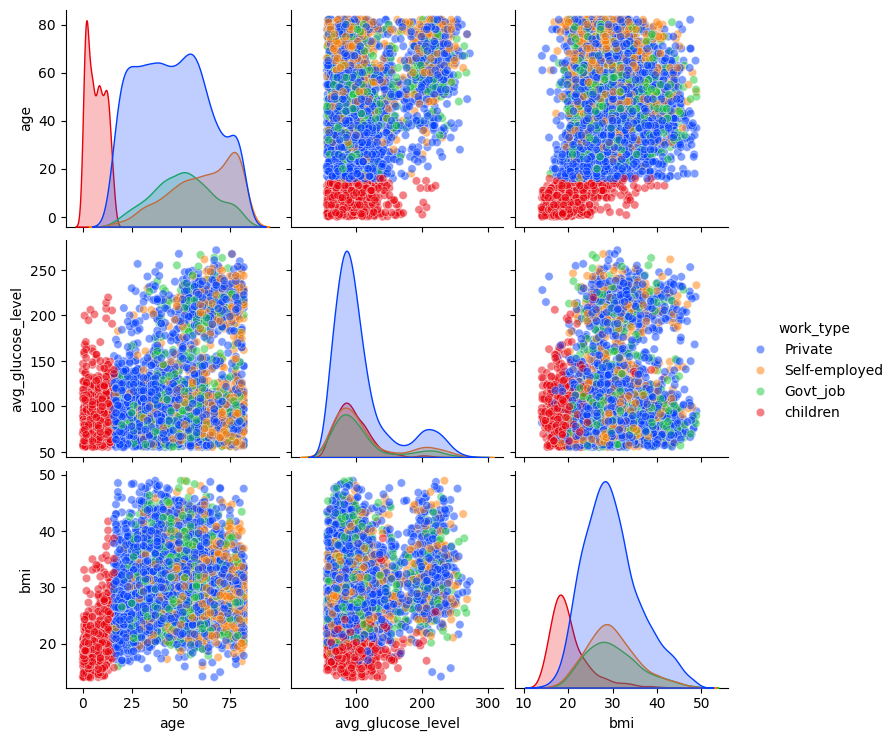

<Figure size 500x500 with 0 Axes>

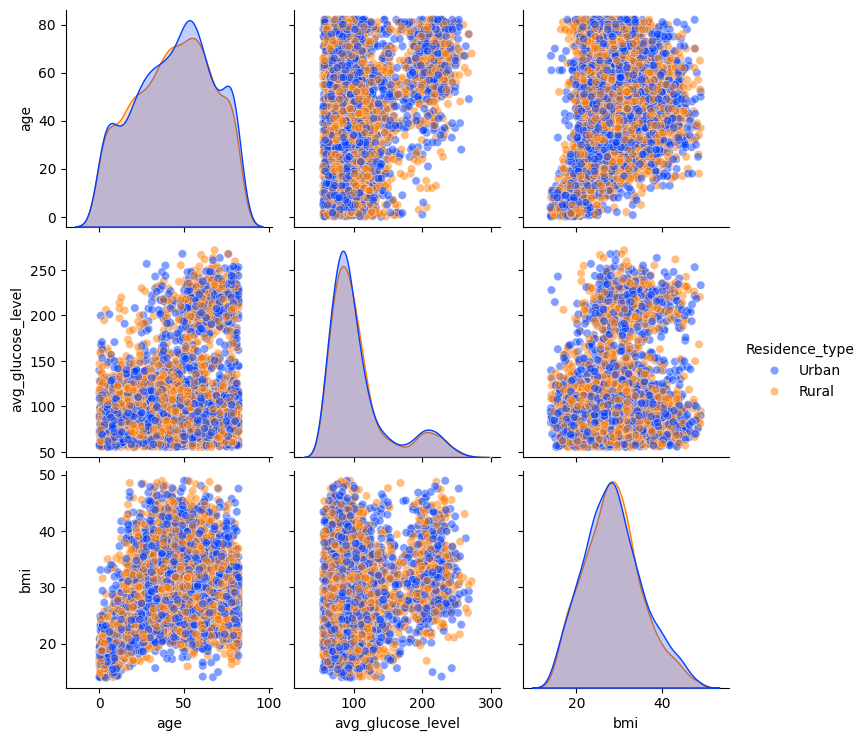

<Figure size 500x500 with 0 Axes>

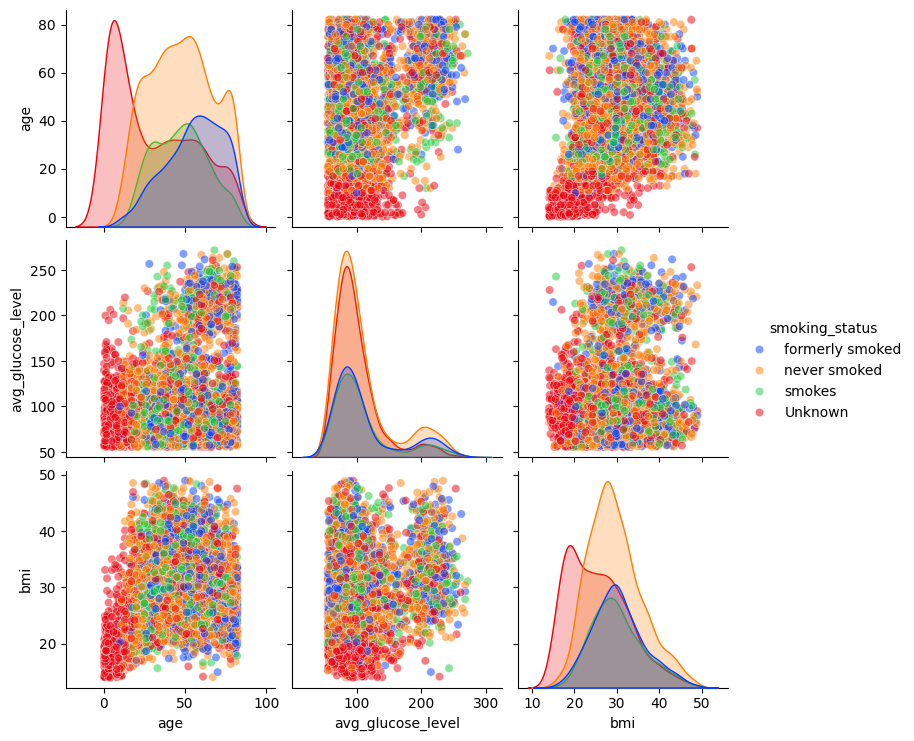

In [28]:
displayClustersForCategoricalAttributes(df2, numericalAttributes, categoricalAttributes)

### Conclusions from the Cluster Analysis Stratified by Categorical Attributes:
* For the gender attribute, all data is mixed, which is an expected phenomenon.
* Hypertension tends to occur for people over 40 years old and is less likely for extreme BMI values.
* Similar conclusions can be drawn for heart diseases, but they are more common in people over 50 years old.
* Marriage is strongly associated with age. People who have never been married generally have lower BMI.
* Distributions of features are very similar for employment type (except for children, who stand out in terms of age and BMI). Self-employment status is more common among older individuals. Besides that, these groups are mixed.
* Place of residence does not affect numerical attributes.
* Smoking does not affect blood glucose levels and BMI. In older age, the number of people who have quit smoking increases. The "Unknown" status dominates among children.
* In summary, there are not many clear clusters when stratifying by categorical attributes.

<Figure size 500x500 with 0 Axes>

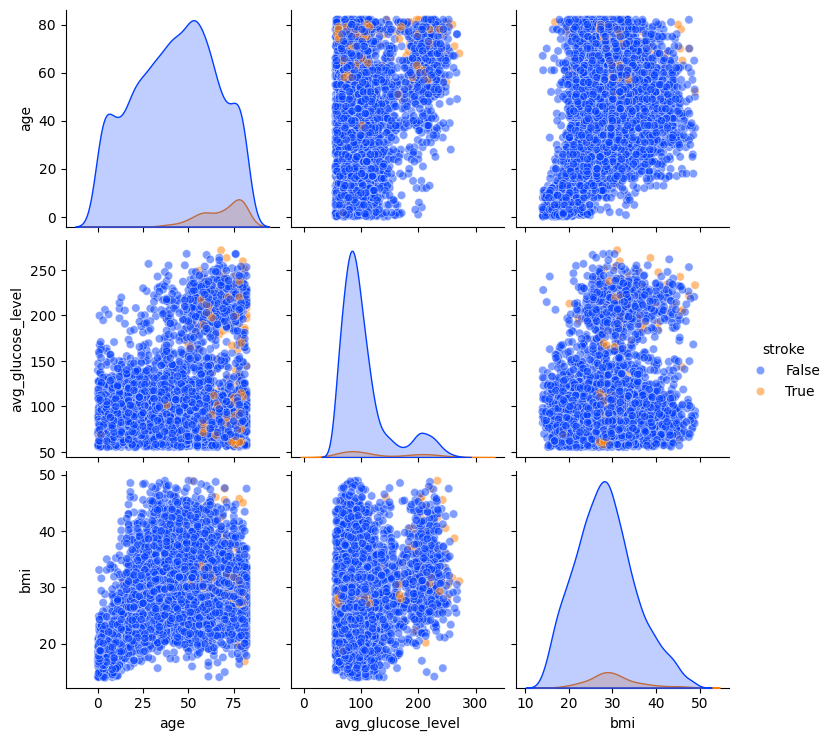

In [29]:
displayClustersForCategoricalAttributes(df2, numericalAttributes, [decisiveAttr])

### Conclusions from the Cluster Analysis Stratified by the Decisive Attribute:
After stratification by the decisive attribute, we also do not observe clusters of data. The only thing we can notice is that the age distribution has a slightly different shape depending on the class. The glucose level may have a smaller disparity in terms of the difference between the counts in the two highest points for the stroke class than for the other class. BMI has a very similar distribution for both classes.

## 3.5 Numerical Attributes Correlation Analysis
In this step, we will analyze the correlation between numerical attributes using a heatmap. We will examine the correlation for the entire dataset and then stratify it based on categorical and decisive attributes.

In [30]:
def displayCorrelation(frame, attributes):
    plt.figure(figsize=(5,5))
    sns.heatmap(data=frame.loc[:,attributes].corr(), annot=True, vmin=-1, vmax=1)

In [31]:
def analyseCorrelationInCategories(frame, numericalAttributes, categoricalAttribute):
    categories = frame[categoricalAttribute].sort_values().unique()
    plt.figure(figsize=(15,5), dpi=100)
    for id, currentCategory in enumerate(categories):
        categoryFrame = frame[frame[categoricalAttribute] == currentCategory]
        plt.subplot(1,len(categories),id+1)
        plt.tight_layout()
        sns.heatmap(categoryFrame.loc[:,numericalAttributes].corr(), annot=True, vmin=-1, vmax=1)
        plt.title("{0} = {1}".format(categoricalAttribute, currentCategory))
    plt.suptitle("Correlation for {0}".format(categoricalAttribute))
    plt.tight_layout()

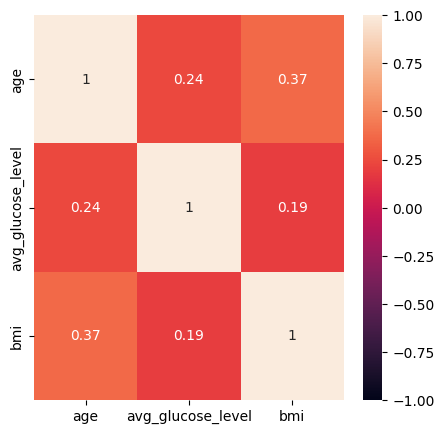

In [32]:
displayCorrelation(df2, numericalAttributes)

### Conclusions from the Analysis of Quantitative Attributes Correlation:
* The highest correlation value is observed between BMI and age, and it is 0.37.
* Thus, we do not observe any strong correlation between numerical attributes.
### Correlation Analysis with Respect to the Decisive Attribute

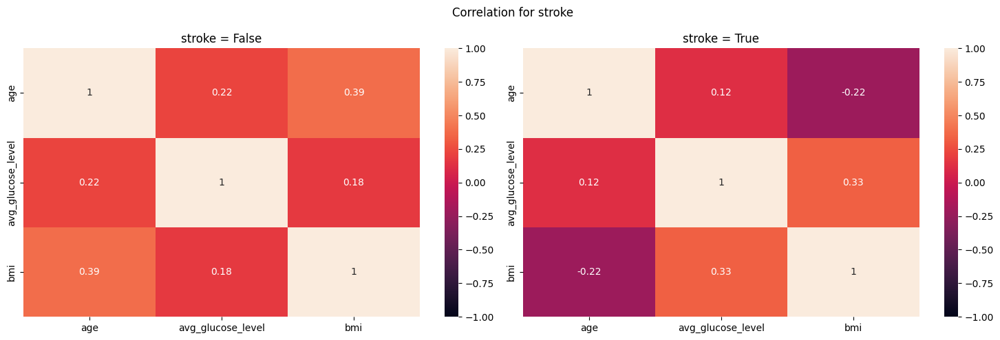

In [33]:
analyseCorrelationInCategories(df2, numericalAttributes, decisiveAttr)

### Conclusions from the Analysis of Numerical Attributes Correlation Stratified by the Decisive Attribute:
* For the False group:
    * The highest correlation is still between age and BMI (0.39), but it is still not significant.
* For the True group:
    * An interesting phenomenon is that for the True group, the correlation coefficient between BMI and age is negative, while for the False group, it was positive.
* In neither case do we observe significant correlation.

### Correlation Analysis with Respect to Categorical Attributes

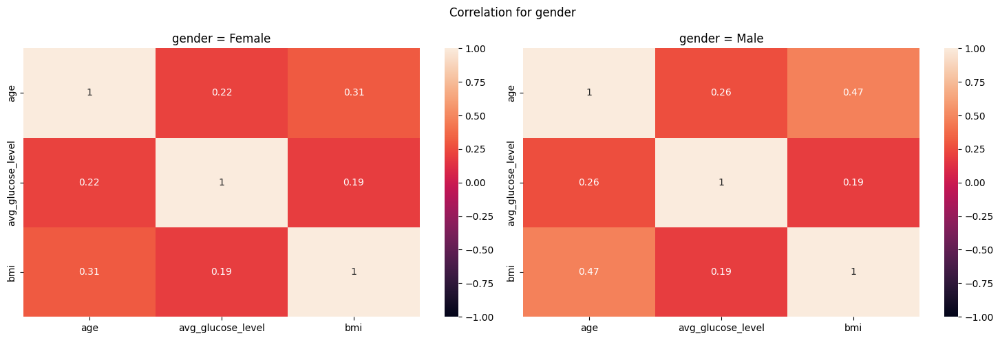

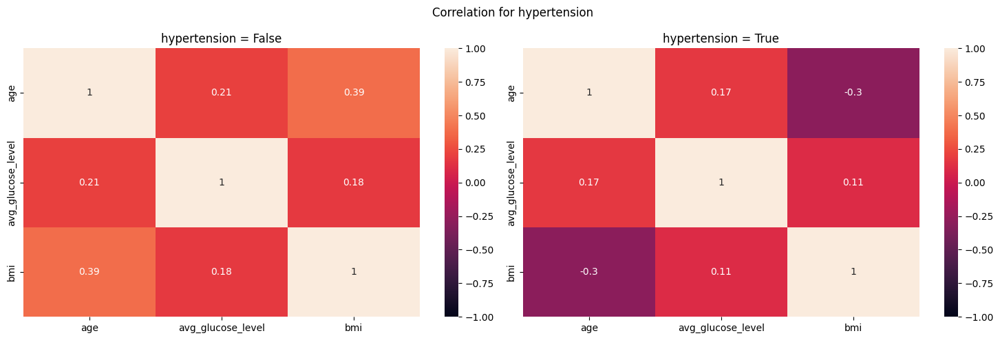

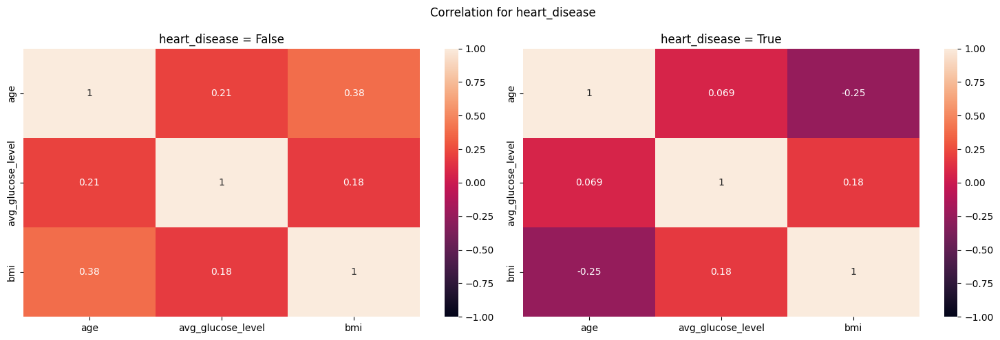

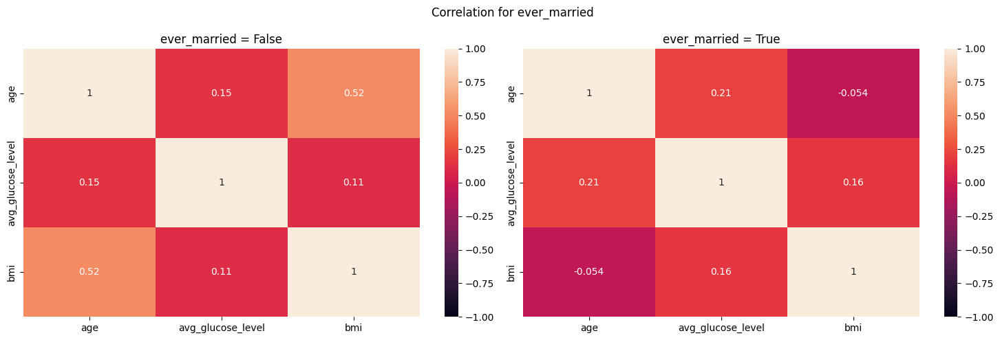

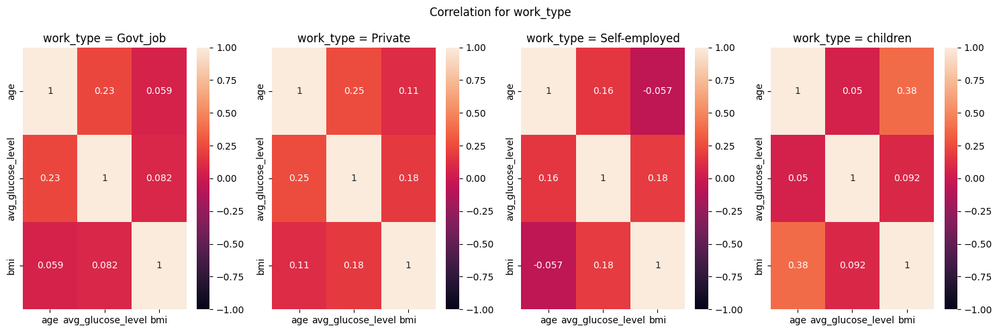

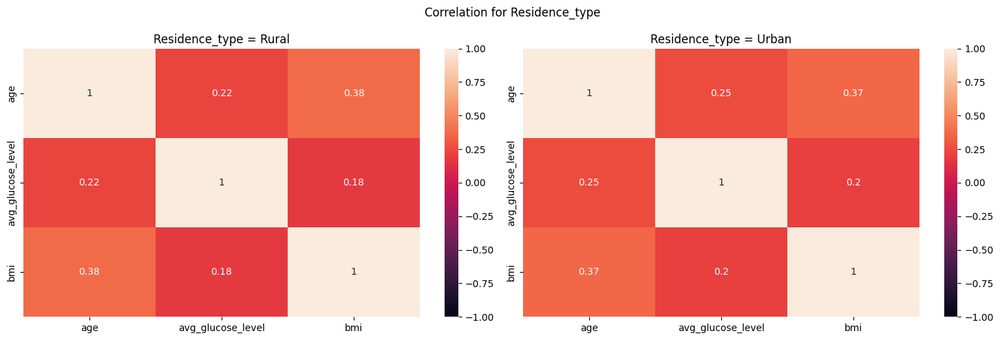

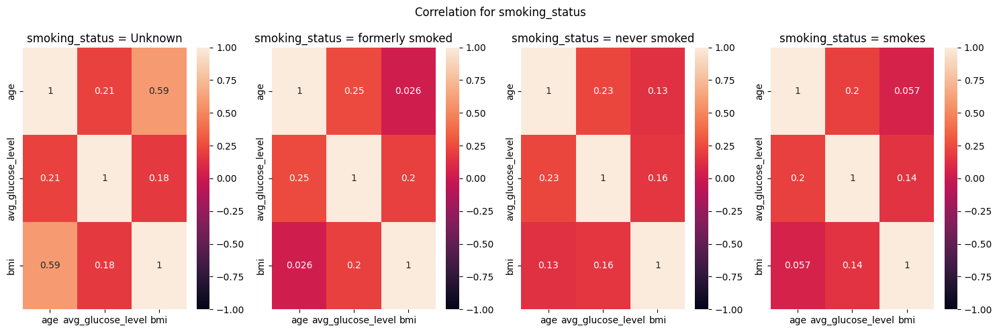

In [34]:
for categoricalAttr in categoricalAttributes:
    analyseCorrelationInCategories(df2, numericalAttributes, categoricalAttr)

### Conclusions from the Correlation Analysis Stratified by Categorical Attribute:
* Men have more (though still not very) correlated age with BMI.
* An interesting phenomenon is the reversal of the age-BMI correlation coefficient for people with hypertension. The correlation is still not significant, but for people with hypertension, it is negative, while for the rest, it is positive. The same pattern is observed for heart diseases. This implies similarity to the division based on the decisive attribute. However, these are not significant correlations.
* The highest correlation is observed between age and BMI in the group of people for whom smoking status is unknown.
* After examining the correlations with the division into groups, we did not observe the emergence of any significant correlation coefficients.

## 3.6 Analysis of Categorical Attribute Co-occurrence
In this step, we begin by presenting each pair of categorical attributes on a separate confusion matrix normalized by columns. Normalization is applied to enable a clear reference to each of them.

In [35]:
def analyseCoexistenceOfTwoFeatures(frame, categoricalAttributes):
    numberOfAttrs = len(categoricalAttributes)
    numberOfPairs = math.factorial(numberOfAttrs)/(2*(math.factorial(numberOfAttrs-2)))
    numberOfRows = np.ceil(numberOfPairs/3).astype("int64")
    numberOfPlot = 0
    plt.figure(figsize=(15,25))
    for i, columnI in enumerate(categoricalAttributes):
        for j in range(i+1, numberOfAttrs):
            numberOfPlot+=1
            plt.subplot(numberOfRows, 3, numberOfPlot)
            ct = pd.crosstab(frame[categoricalAttributes[j]], frame[columnI],  normalize="columns")
            sns.heatmap(ct,annot=True,  fmt='.4f', vmin=0, vmax=1)
            plt.title("{0} vs {1}".format(columnI, categoricalAttributes[j]))
    plt.tight_layout()

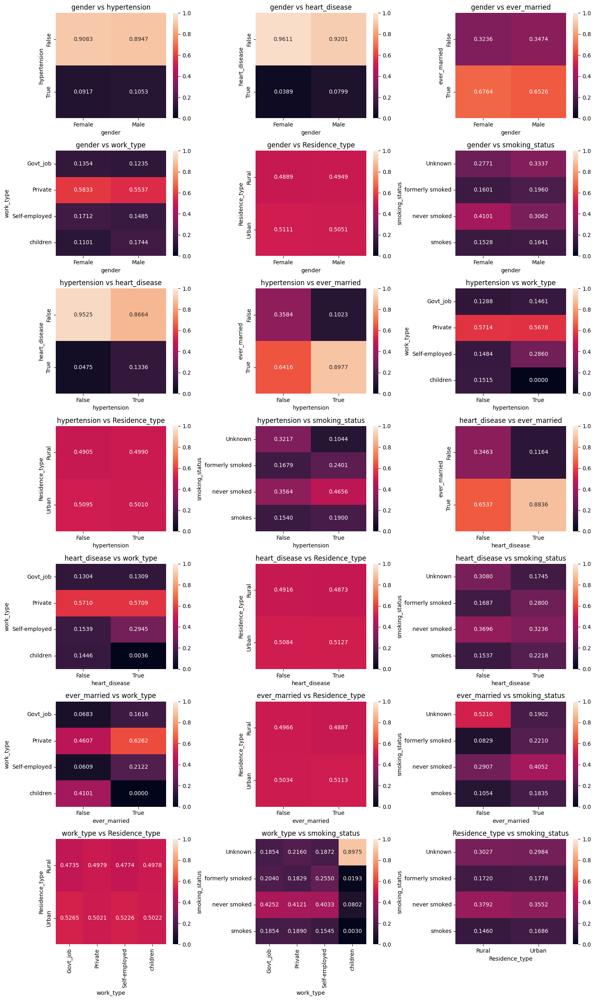

In [36]:
analyseCoexistenceOfTwoFeatures(df2, categoricalAttributes)

### Conclusions from the analysis of categorical feature co-occurrence:
* Gender usually does not significantly influence the occurrence of other features. Slightly notable facts are that fewer women have ever smoked compared to men, and there is a slightly higher likelihood that a man has heart disease.
* If a person has hypertension, there is usually only a slightly higher chance that they also have heart disease.
* If a person has hypertension, there is a significant chance that they have ever been married. However, this may be due to the correlation of these attributes with age. The same pattern is observed with heart diseases. This might suggest a higher tendency for the co-occurrence of the "ever_married" attribute with "hypertension" and "heart_disease."
* Children do not have hypertension, and it is very rare for them to have heart diseases.
* If self-employment is the economic activity of a person, there is a higher chance that they suffer from hypertension or heart disease. However, starting a business is also somewhat correlated with age.
* If a person has never been married, there is a high chance that either they have never smoked or their smoking status is unknown. This is also associated with age.
* If a person's smoking status is unknown, they are most likely a child.
* If a person has never been married, there is a very high chance that they are either a child or work in the private sector.
* Gender, place of residence, the "children" employment type, and an unknown smoking status are potentially less informative features in the dataset. The first two have a very similar distribution when compared to other features, while the latter are correlated with age. Moreover, an unknown smoking status is not a feature that can be unambiguously well-interpreted in relation to the real world.

### Transformation of the set of categorical attribute values
Continuing the analysis of the co-occurrence of two features, we will present on a common heat map the co-occurrence of each possible value of categorical attributes. To do this, we need to perform the following operations:
* Rename attributes: _**gender**_ to _**is_female**_ and _**Residence_type**_ to _**is_urban**_
* Change their values: _**Female->True**_, _**Male->False**_ and _**Urban->True**_, _**Rural->False**_
* For each value of the _**smoking_status**_ and _**work_type**_ create a separate binary column indicating the presence or absence of that value. We will do this using the One-Hot Encoding method.

Performing these operations will also be useful from the perspective of the subsequent task - learning.

In [37]:
dfLearning = df2.rename(columns={"gender": "is_female", "Residence_type": "is_urban" })
dfLearning["is_female"] = dfLearning["is_female"].map({"Female": True, "Male": False})
dfLearning["is_urban"] = dfLearning["is_urban"].map({"Urban": True, "Rural": False})
dfLearning.head(10)

,is_female,age,hypertension,heart_disease,ever_married,work_type,is_urban,avg_glucose_level,bmi,smoking_status,stroke
0,False,67.00,False,True,True,Private,True,228.69,36.60,formerly smoked,True
1,False,80.00,False,True,True,Private,False,105.92,32.50,never smoked,True
2,True,49.00,False,False,True,Private,True,171.23,34.40,smokes,True
3,True,79.00,True,False,True,Self-employed,False,174.12,24.00,never smoked,True
4,False,81.00,False,False,True,Private,True,186.21,29.00,formerly smoked,True
5,False,74.00,True,True,True,Private,False,70.09,27.40,never smoked,True
6,True,69.00,False,False,False,Private,True,94.39,22.80,never smoked,True
7,True,78.00,False,False,True,Private,True,58.57,24.20,Unknown,True
8,True,81.00,True,False,True,Private,False,80.43,29.70,never smoked,True
9,True,61.00,False,True,True,Govt_job,False,120.46,36.80,smokes,True


In [38]:
dfLearning2 = pd.get_dummies(dfLearning, prefix=["work", "smoking"], columns=["work_type", "smoking_status"])
cols = list(dfLearning2.columns.drop("stroke"))
cols.append("stroke")
dfLearning2 = dfLearning2[cols]
dfLearning2

,is_female,age,hypertension,heart_disease,ever_married,is_urban,avg_glucose_level,bmi,work_Govt_job,work_Private,work_Self-employed,work_children,smoking_Unknown,smoking_formerly smoked,smoking_never smoked,smoking_smokes,stroke
0,False,67.00,False,True,True,True,228.69,36.60,False,True,False,False,False,True,False,False,True
1,False,80.00,False,True,True,False,105.92,32.50,False,True,False,False,False,False,True,False,True
2,True,49.00,False,False,True,True,171.23,34.40,False,True,False,False,False,False,False,True,True
3,True,79.00,True,False,True,False,174.12,24.00,False,False,True,False,False,False,True,False,True
4,False,81.00,False,False,True,True,186.21,29.00,False,True,False,False,False,True,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4976,False,41.00,False,False,False,False,70.15,29.80,False,True,False,False,False,True,False,False,False
4977,False,40.00,False,False,True,True,191.15,31.10,False,True,False,False,False,False,False,True,False
4978,True,45.00,True,False,True,False,95.02,31.80,True,False,False,False,False,False,False,True,False
4979,False,40.00,False,False,True,False,83.94,30.00,False,True,False,False,False,False,False,True,False


Opiszemy nowo powstałą ramkę

In [39]:
describeDataSet(dfLearning2, decisiveAttr)

Number of objects in dataset: 4921
Number of attributes in dataset: 17
Number of classes: 2
Number of observations per class: 
stroke
False    4673
True      248
Name: count, dtype: int64
Number of fields with missing data: 0


In [40]:
categoricalAttributesLearning = ['is_female', 'hypertension', 'heart_disease', 'ever_married',
       'is_urban', 'work_Govt_job', 'work_Private', 'work_Self-employed', 'work_children', 'smoking_Unknown',
       'smoking_formerly smoked', 'smoking_never smoked', 'smoking_smokes',
       'stroke']
showValuesForCategoricalAttributes(dfLearning2, categoricalAttributesLearning)

Values for is_female
[False  True] 

Values for hypertension
[False  True] 

Values for heart_disease
[ True False] 

Values for ever_married
[ True False] 

Values for is_urban
[ True False] 

Values for work_Govt_job
[False  True] 

Values for work_Private
[ True False] 

Values for work_Self-employed
[False  True] 

Values for work_children
[False  True] 

Values for smoking_Unknown
[False  True] 

Values for smoking_formerly smoked
[ True False] 

Values for smoking_never smoked
[False  True] 

Values for smoking_smokes
[False  True] 

Values for stroke
[ True False] 



After changing the attribute values and applying One-Hot Encoding, two things have changed in the dataset.
* The number of attributes increased to 17 (including the decision attribute).
* All categorical attributes take on values of False or True.
### Continuing the analysis of the co-occurrence of categorical attributes

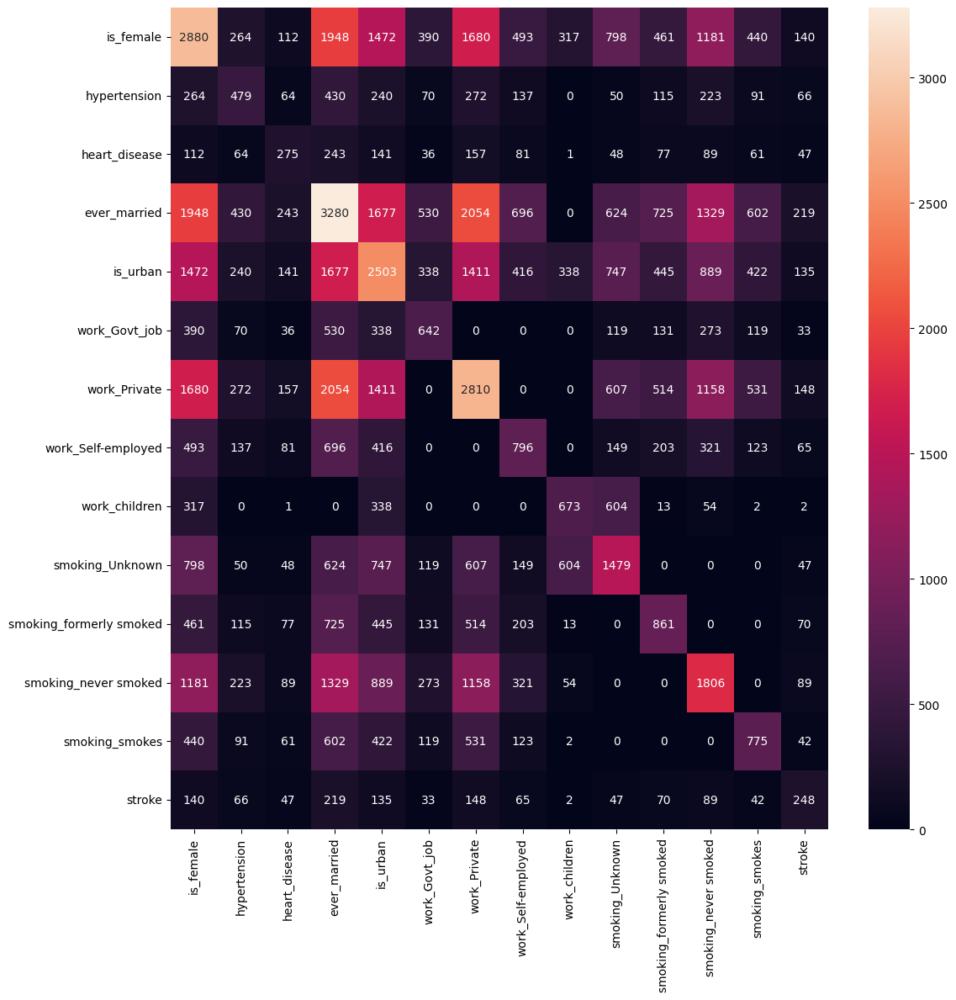

In [41]:
categoricalFrame = dfLearning2.copy()
categoricalFrame = categoricalFrame.drop(columns=["bmi", "age", "avg_glucose_level"])
count_martix = pd.DataFrame(index=categoricalFrame.columns, columns=categoricalFrame.columns, data=0)

for col1 in categoricalFrame.columns:
    for col2 in categoricalFrame.columns:
        count_martix.loc[col1, col2] = (categoricalFrame[col1] & categoricalFrame[col2]).sum()

plt.figure(figsize=(12,12))
sns.heatmap(count_martix, annot=True, fmt='g')
plt.tight_layout()

### Conclusions from the Analysis of Categorical Attribute Co-occurrence:

* The feature "work_children" mostly has an unknown smoking status.
* Children generally do not have hypertension and heart diseases.
* Most people with hypertension and heart diseases have been married.
* It's not a rule that hypertension co-occurs with heart diseases.
* The majority of people who had a stroke were married.
* The vast majority of people who quit smoking were married. This may indirectly relate to age, as older patients are more likely to have quit smoking and be married.
* The "ever_married" feature also frequently co-occurs with the "smokes" feature.

### Analysis of Categorical Attribute Co-occurrence with Class Division:

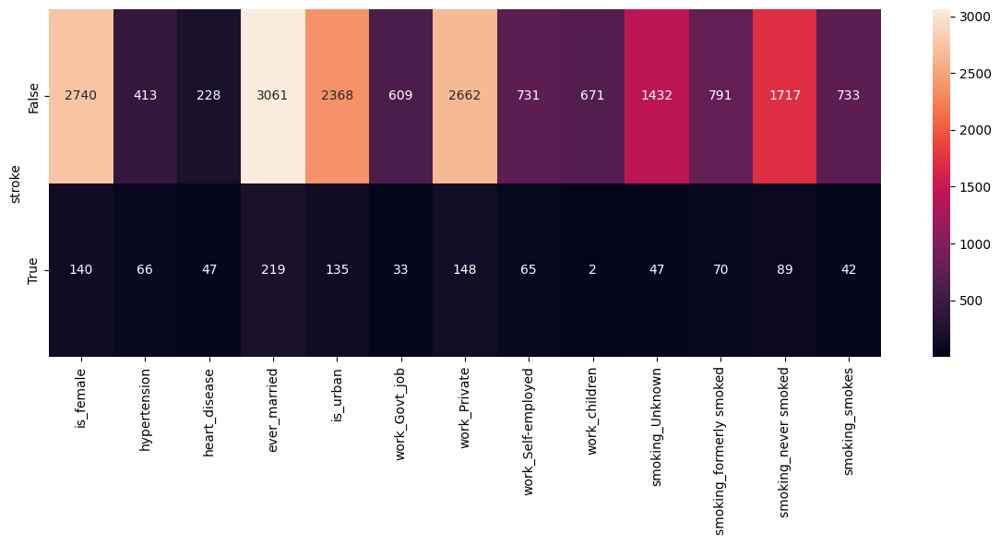

In [42]:
categoricalFrameGroupped = categoricalFrame.groupby("stroke").sum()
plt.figure(figsize=(12,6))
sns.heatmap(categoricalFrameGroupped, annot=True, fmt="g")
plt.tight_layout()

### Conclusions from the Analysis of Categorical Attribute Co-occurrence with Class Division:
* Children very rarely experience strokes.
* Heart diseases may have a more significant impact on the occurrence of strokes than hypertension.

# Conclusions from Exploratory Data Analysis:
* Heart diseases and hypertension may have the most significant impact on the occurrence of strokes among categorical attributes.
* Heart diseases and hypertension are associated with marital status (linked to age) and the decision attribute.
* Gender and place of residence have similar stroke statistics, suggesting they may not have a significant impact.
* Employment sector may be relevant when distinguishing between self-employment and others, as the private and public sectors have similar stroke statistics. (The "children" value is associated with age here.)
* Whether a person ever smoked may also influence the likelihood of a stroke, especially the "formerly smoked" attribute, implying prolonged smoking history.
* Marital status, unknown smoking status, and employment status "children" are associated with age.
* Among numerical attributes, age seems to be the most influential, while BMI may have the least impact due to a similar distribution for each class.
* A critically high level of glucose in the blood is more characteristic of the positive class of the decision attribute.

In summary, attributes that may not be helpful in classification are:

* Gender - due to similar statistics for the decision attribute.
* Place of residence - due to a similar distribution of this feature with each attribute.
* Smoking status: unknown - due to a possible connection with age and a lack of a clear reflection of this feature.
* Employment status: children - due to the association with age.
  
Marital status, despite being associated with age, may prove useful, as most stroke cases have this feature.  
  
Additionally, distinguishing between the public and private sectors may not provide additional information. It may turn out that the only significant feature resulting from employment status is whether a person is self-employed.

# 4. Unsupervised Learning

In this step, we will perform unsupervised learning using agglomerative clustering and K-Means clustering to analyze whether there are clusters in the dataset that are not apparent in two dimensions. As subsequent methods involve determining distances between objects, we need to normalize the sets of numerical attribute values. We will use min-max normalization in this step, which ensures the following variability range for quantitative attributes: [0...1]. We chose it over standardization because it maintains the natural distribution of attributes, whereas standardization would transform it into a normal distribution, potentially contradicting reality (only BMI has a distribution close to normal).

Despite the susceptibility of the min-max method to outliers, we will not remove them. In the case of medical data, outliers may contain important information. Analyzing the box plot during the exploratory analysis, we saw that values around 200 were classified as outliers. Removing them could lead to the loss of vital information.

### Min-Max Normalization

In [43]:
def normalizeMinMax(frame, columns):
    result = frame.copy()
    for feature_name in columns:
        max_value = frame[feature_name].max()
        min_value = frame[feature_name].min()
        result[feature_name] = (frame[feature_name] - min_value) / (max_value - min_value)
    return result

In [44]:
dfNormalised = normalizeMinMax(dfLearning2, ["age", "avg_glucose_level", "bmi"])
dfNormalised

,is_female,age,hypertension,heart_disease,ever_married,is_urban,avg_glucose_level,bmi,work_Govt_job,work_Private,work_Self-employed,work_children,smoking_Unknown,smoking_formerly smoked,smoking_never smoked,smoking_smokes,stroke
0,False,0.82,False,True,True,True,0.80,0.65,False,True,False,False,False,True,False,False,True
1,False,0.98,False,True,True,False,0.23,0.53,False,True,False,False,False,False,True,False,True
2,True,0.60,False,False,True,True,0.54,0.58,False,True,False,False,False,False,False,True,True
3,True,0.96,True,False,True,False,0.55,0.29,False,False,True,False,False,False,True,False,True
4,False,0.99,False,False,True,True,0.61,0.43,False,True,False,False,False,True,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4976,False,0.50,False,False,False,False,0.07,0.45,False,True,False,False,False,True,False,False,False
4977,False,0.49,False,False,True,True,0.63,0.49,False,True,False,False,False,False,False,True,False
4978,True,0.55,True,False,True,False,0.18,0.51,True,False,False,False,False,False,False,True,False
4979,False,0.49,False,False,True,False,0.13,0.46,False,True,False,False,False,False,False,True,False


## 4.1 Analysis of clusters in full-dimensional dataset

### 4.1.1 Agglomerative Clustering

In [45]:
def runAgglomerativeMethodWithDendrogramForThreshold(frameWithClass, decisiveAttr, attrsScatter, threshold_percent=70):
    classes = frameWithClass[decisiveAttr].astype('category').cat.codes
    frame = frameWithClass.drop(columns = decisiveAttr)
    plt.figure(figsize = (10,4))
    plt.subplot(1,2,1)
    plt.scatter(x = frame[attrsScatter[0]], y = frame[attrsScatter[1]], c = classes)
    plt.title("Original Data")
    plt.xlabel(attrsScatter[0])
    plt.ylabel(attrsScatter[1])
    plt.subplot(1,2,2)
    plt.scatter(x = frame[attrsScatter[0]], y = frame[attrsScatter[1]])
    plt.title("Not categorised")
    plt.xlabel(attrsScatter[0])
    plt.ylabel(attrsScatter[1])
    plt.show()
    plt.figure(figsize = (20,15))
    for id, distance in enumerate(["single", "complete", "average", "ward"]):
        groups = linkage(frame, method = distance, metric = 'euclidean')
        threshold = threshold_percent*max(groups[:,2])/100
        plt.subplot(3,4,id + 1)
        cl = dendrogram(groups, truncate_mode = 'lastp', color_threshold = threshold)
        plt.title("Dendrogram, method: {0}".format(distance))            
        plt.subplot(3,4,id + 5)
        frame['group'] =  fcluster(groups, threshold, criterion = 'distance')
        plt.scatter(x = frame[attrsScatter[0]], y = frame[attrsScatter[1]], c = frame['group'])
        plt.title("Clustering effect:")
        plt.xlabel(attrsScatter[0])
        plt.ylabel(attrsScatter[1])
        plt.subplot(3,4,id + 9)
        confusions = pd.crosstab(frameWithClass[decisiveAttr],frame['group'])
        accuracy =  confusions.max(axis="columns").sum() / confusions.sum(axis="columns").sum()
        sns.heatmap(confusions,annot = confusions, fmt='g')
        plt.title("Accuracy: {0}".format(accuracy))

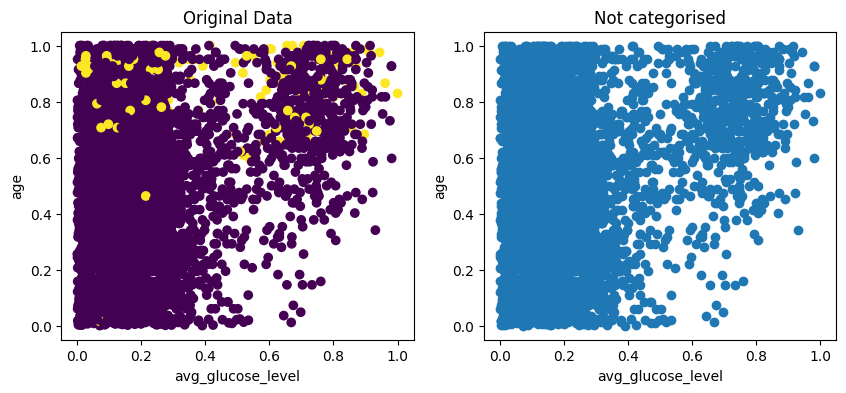

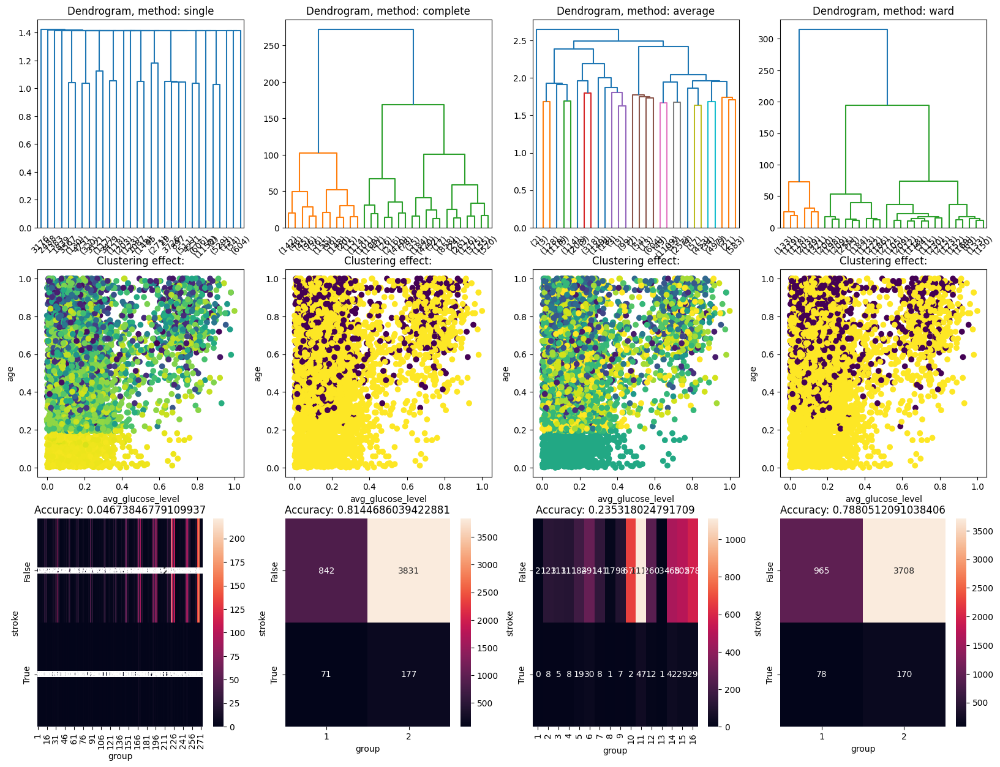

In [46]:
runAgglomerativeMethodWithDendrogramForThreshold(dfNormalised, decisiveAttr, ["avg_glucose_level", "age"], threshold_percent=70)

### Conclusions from the Dendrogram Analysis:
* Single and average distance methods indicate a vast number of clusters. They would not be applicable for a reliable clustering in this dataset.
* Complete and ward methods do suggest the existence of two clusters; however, they are unable to correctly group the original data due to their intermingling in the original set.
* Assigning observations to clusters cannot be considered reliable due to a large number of misclassifications in both the False and True classes.
* Scatter plots after clustering confirm that stroke is more characteristic of older individuals.

### 4.1.2 K-Means Clustering

In [47]:
def displaySilhouettesKMeans(frame, kRange, attrsScatter):
    quality_metrics = pd.Series()
    numbersOfGroups = kRange
    for groupCount in kRange:
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(15, 5)
        ax1.set_xlim([-0.2, 1])
        ax1.set_ylim([0, len(frame) + (groupCount + 1) * 10])
        kmeans = KMeans(n_clusters = groupCount, random_state = 0).fit(frame)
        quality_metrics = pd.concat([quality_metrics, pd.Series(kmeans.inertia_)], ignore_index=True)
        groupNames = kmeans.fit_predict(frame)

        silhouette = silhouette_samples(frame, groupNames)
        avgSilhouette = silhouette_score(frame, groupNames)
        linePosition = 10

        for i in range(groupCount):
            groupSilhoeutte = silhouette[groupNames == i]
            groupSilhoeutte.sort()

            observationsInGroup = groupSilhoeutte.shape[0]
            color = cm.tab10(float(i) / groupCount)
            ax1.fill_betweenx(np.arange(linePosition, linePosition + observationsInGroup), 0, groupSilhoeutte ,color = color)

            linePosition += observationsInGroup + 10
            
        ax1.set_title("Silhouette plot for number of groups")
        ax1.set_xlabel("Silhouette score")
        ax1.set_ylabel("Group name")
        
        ax1.axvline(x = avgSilhouette, color = "black", linestyle = "--")
        ax1.set_yticks([])
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        colors = cm.tab10(groupNames.astype(float) / groupCount)
        ax2.scatter(frame[attrsScatter[0]], frame[attrsScatter[1]], marker = '.', s = 30, lw = 0, alpha = 0.7,c = colors)

        ax2.set_title("Clustering visualisation")
        ax2.set_xlabel("Attribute: {0}".format(attrsScatter[0]))
        ax2.set_ylabel("Attribute: {0}".format(attrsScatter[1]))

        plt.suptitle(("Silhouette analysis k = %d" % groupCount),  fontweight = 'bold')
        plt.figtext(0.14, 0, ("For n = %d, avg silhouette score equals: %.3f, Sum of distance from centroids: %.2f"
                    % (groupCount, avgSilhouette, kmeans.inertia_ ) ))
        plt.show()

    plt.plot(numbersOfGroups, quality_metrics,'bo-')
    plt.title("Elbow plot", fontsize = 14, fontweight = 'bold')
    plt.xlabel("Number of groups")
    plt.ylabel("Sum of distance from centroids")

c:\Users\chabr\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\chabr\AppData\Local\Temp\ipykernel_23312\2713338331.py:10: FutureWarning: The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.
  quality_metrics = pd.concat([quality_metrics, pd.Series(kmeans.inertia_)], ignore_index=True)
c:\Users\chabr\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_

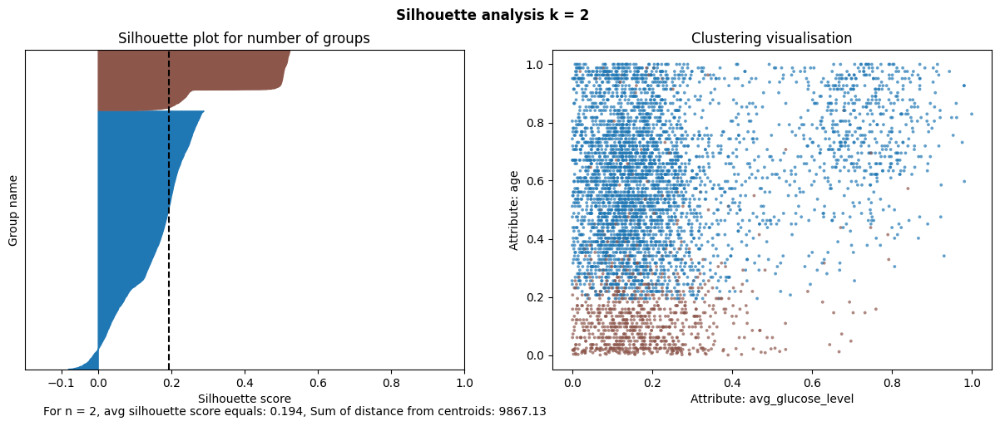

c:\Users\chabr\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\chabr\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


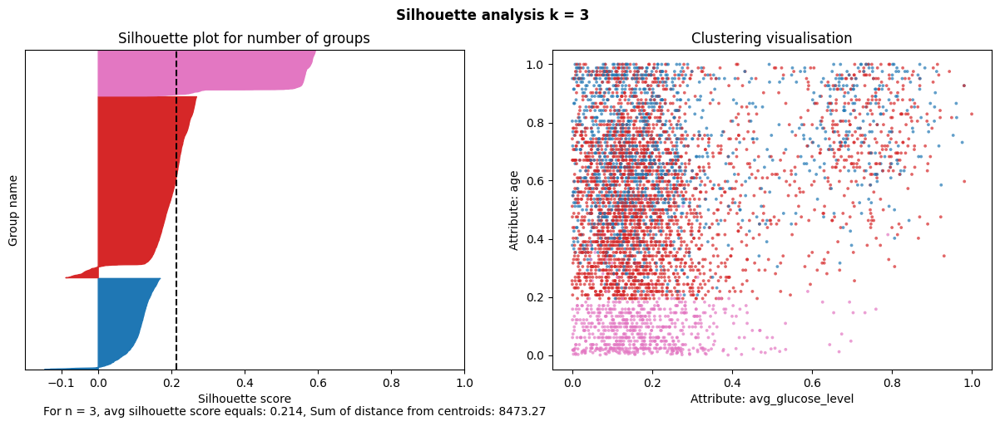

c:\Users\chabr\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\chabr\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


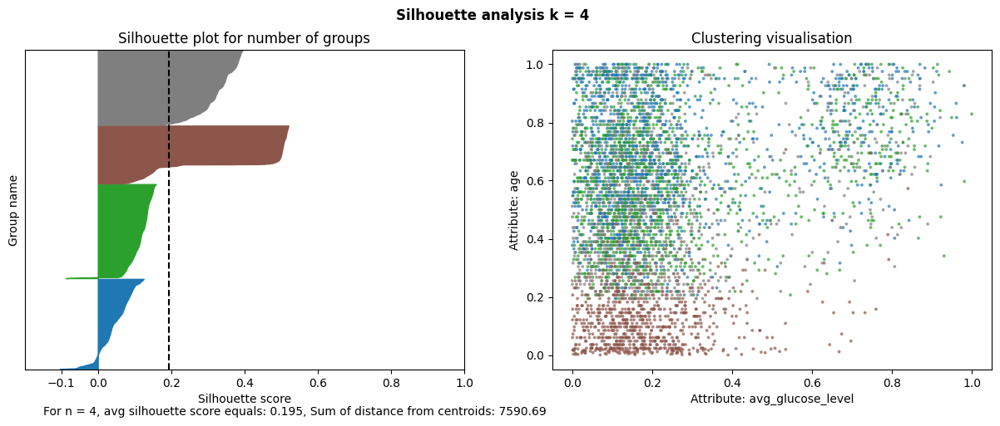

c:\Users\chabr\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\chabr\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


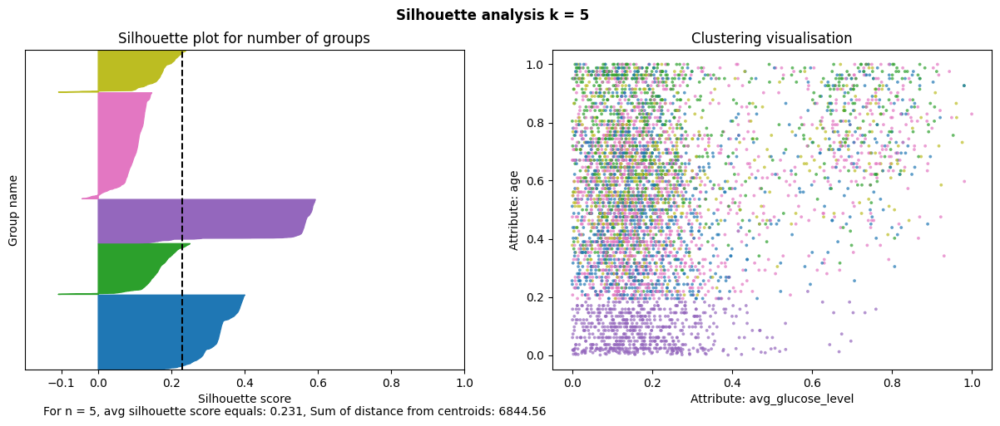

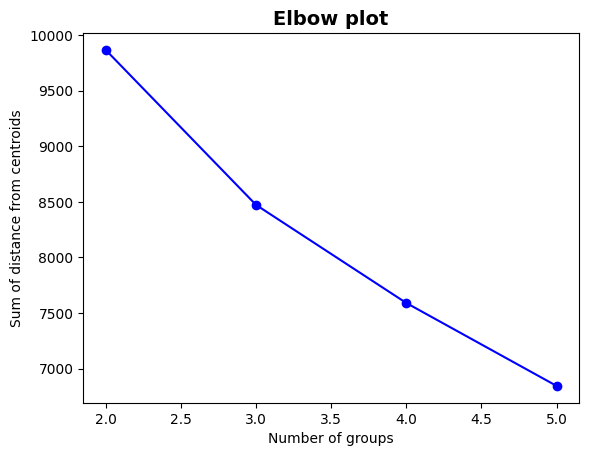

In [48]:
displaySilhouettesKMeans(dfNormalised, [2,3,4,5], ["avg_glucose_level", "age"])

### Conclusions from the Silhouette Analysis:
* Only for the number of clusters equal to 2, all classes have some silhouette values above the average. However, the average silhouette value is not satisfactory in any case. We do not observe clear clusters in the data.

## 4.2 Dimensionality Reduction
As inferred from the exploratory analysis, it is possible that the following attributes do not contribute significantly to the classification:

* Gender
* Residence type
* Employment type: children
* Smoking status: unknown

Furthermore, distinguishing between employment in the private and public sectors may not affect the classification.

We will conduct an analysis after reducing these attributes.

In [49]:
dfNormalisedReduced = dfNormalised.copy()
dfNormalisedReduced = dfNormalisedReduced.loc[:,['age', 'hypertension', 'heart_disease', 'ever_married', 'avg_glucose_level', 'bmi', 
        'work_Govt_job', 'work_Private','work_Self-employed', 'smoking_formerly smoked', 'smoking_never smoked', 'smoking_smokes',
       'stroke']]
dfNormalisedReduced.shape

(4921, 13)

### 4.2.1 Agglomerative Clustering

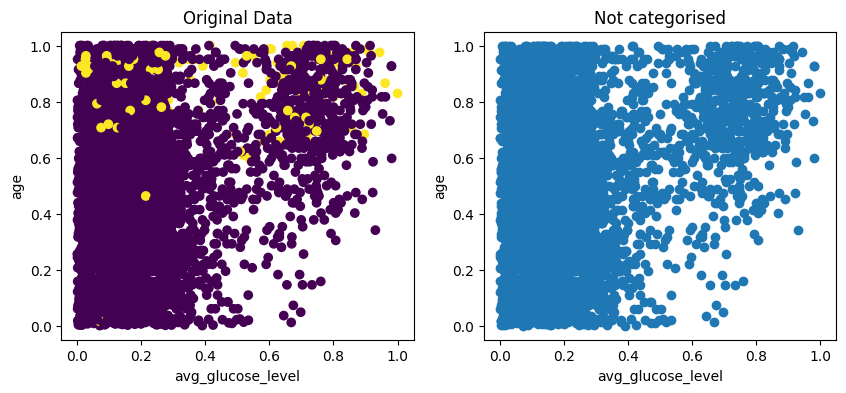

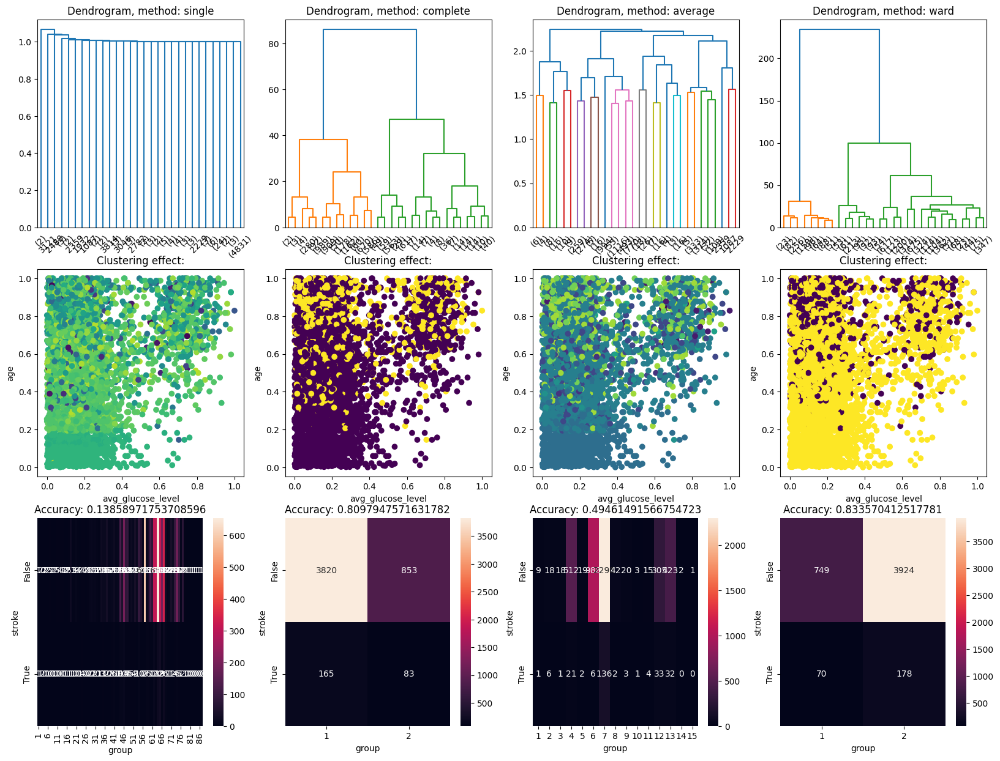

In [50]:
runAgglomerativeMethodWithDendrogramForThreshold(dfNormalisedReduced, decisiveAttr, ["avg_glucose_level", "age"], threshold_percent=70)

### Conclusions from the clustering analysis after dimensionality reduction:
* After dimensionality reduction, the accuracy improved for most distances. However, the quality of clustering is still not satisfactory.

### 4.2.2 K-Means Clustering

c:\Users\chabr\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\chabr\AppData\Local\Temp\ipykernel_23312\2713338331.py:10: FutureWarning: The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.
  quality_metrics = pd.concat([quality_metrics, pd.Series(kmeans.inertia_)], ignore_index=True)
c:\Users\chabr\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_

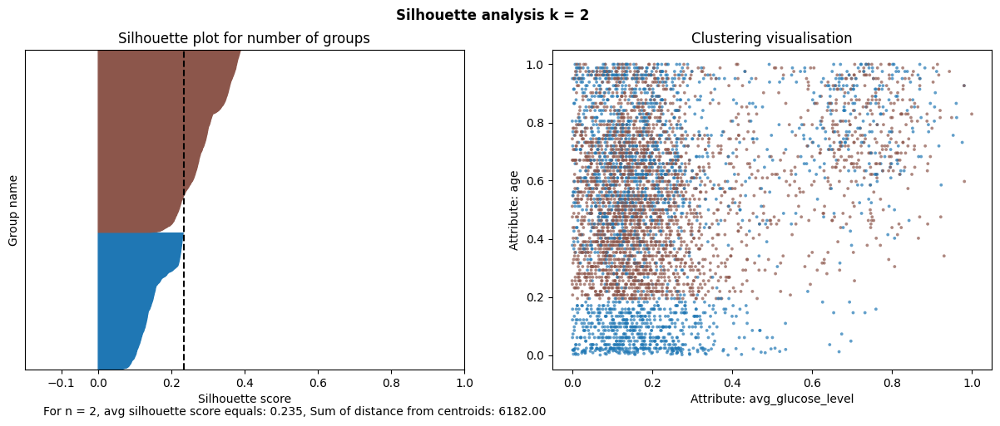

c:\Users\chabr\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\chabr\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


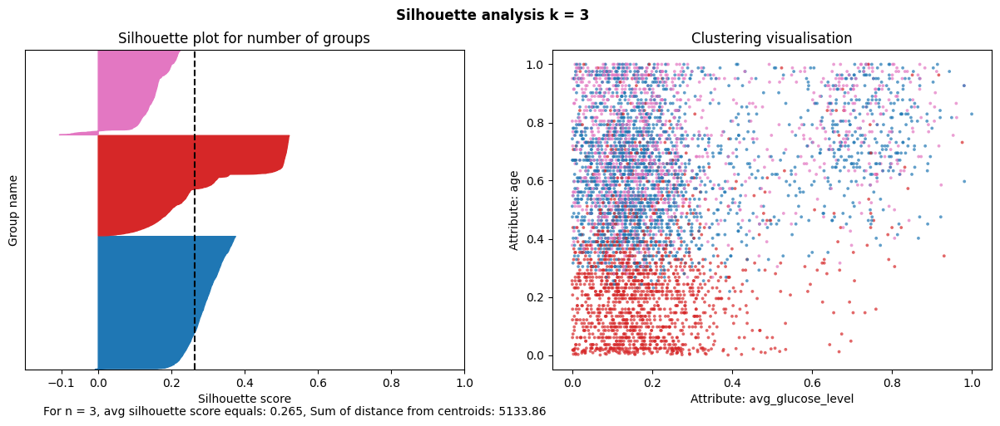

c:\Users\chabr\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\chabr\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


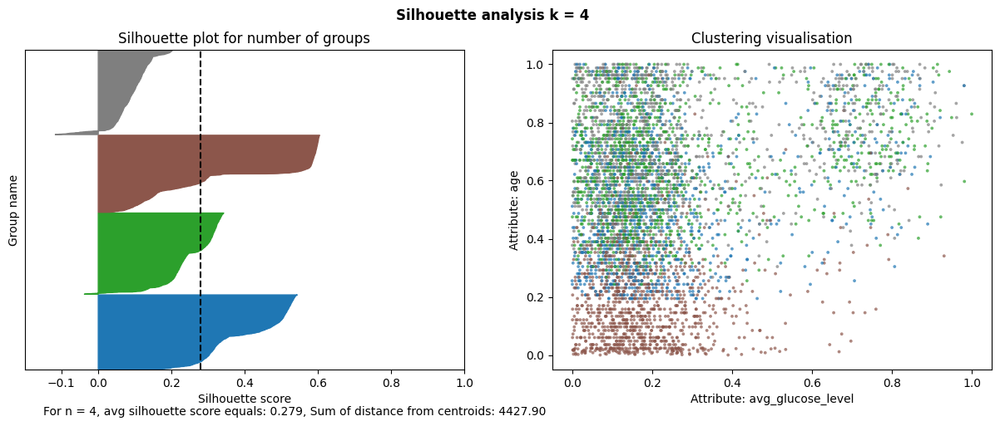

c:\Users\chabr\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\chabr\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


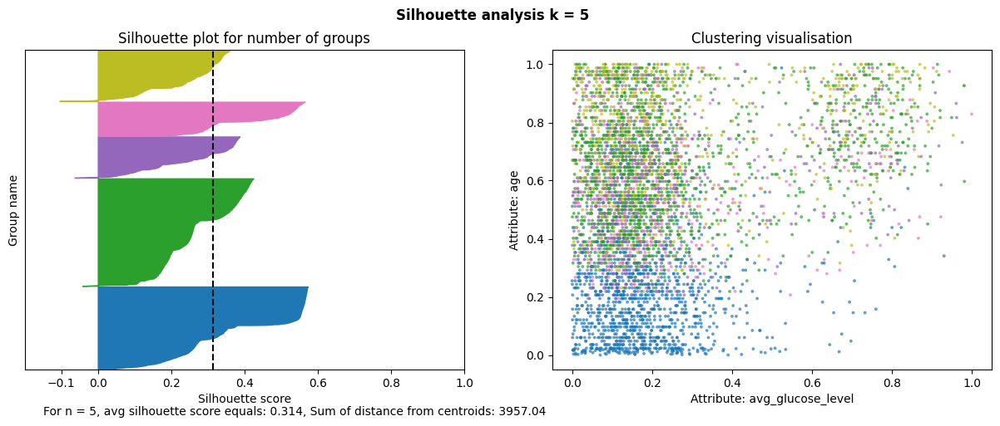

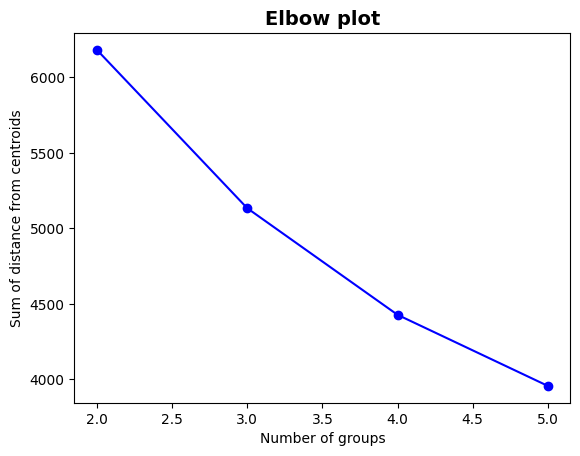

In [51]:
displaySilhouettesKMeans(dfNormalisedReduced, [2,3,4,5], ["avg_glucose_level", "age"])

### Conclusions from the K-Means analysis after dimensionality reduction:
* Interestingly, after dimensionality reduction, all silhouette scores are above average for k=3 and k=5, but not for k=2. However, in both cases, the average silhouette value is still not satisfactory.
## 4.3 Further Dimensionality Reduction
We will consider another scenario where we reduce the dimensionality of the dataset by removing the employment statuses "private sector" and "public sector," leaving only the "self-employed" status.

In [52]:
dfNormalisedMoreReduced = dfNormalisedReduced.copy()
dfNormalisedMoreReduced = dfNormalisedMoreReduced.drop(columns=['work_Govt_job', 'work_Private'])
dfNormalisedMoreReduced.shape

(4921, 11)

### 4.3.1 Agglomerative Clustering

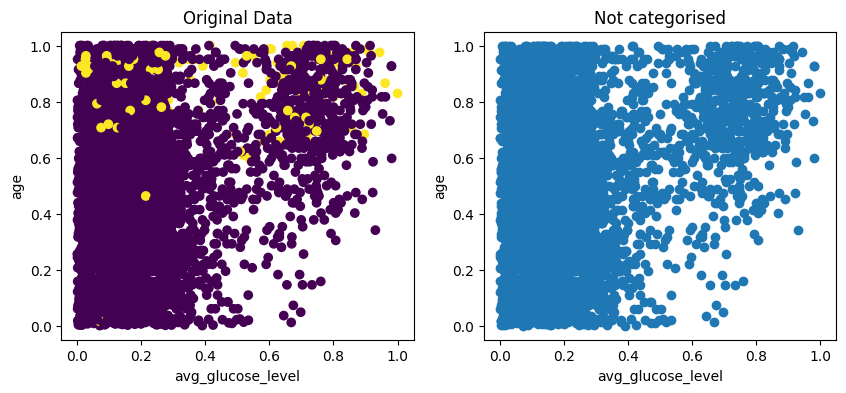

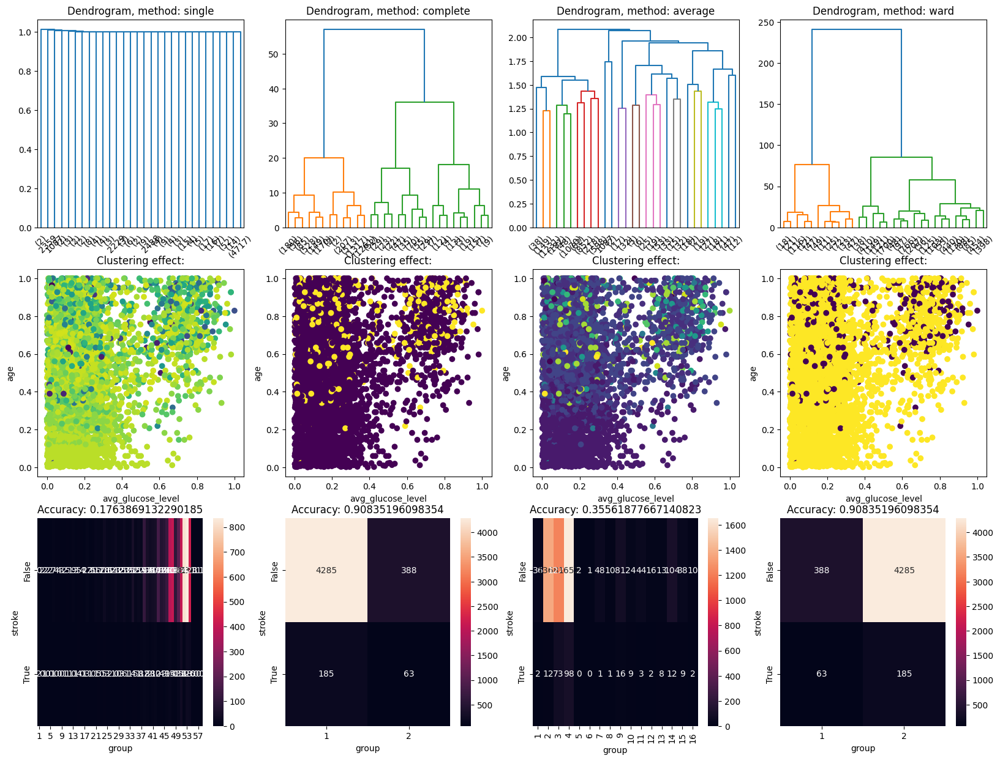

In [53]:
runAgglomerativeMethodWithDendrogramForThreshold(dfNormalisedMoreReduced, decisiveAttr, ["avg_glucose_level", "age"], threshold_percent=70)

### Conclusions after reducing two employment statuses:
* Clustering effectiveness has increased significantly.
* However, we still observe that clustering is not perfect, as indicated by the small number of correct assignments to the "stroke" group.

### 4.3.2 K-Means Clustering

c:\Users\chabr\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\chabr\AppData\Local\Temp\ipykernel_23312\2713338331.py:10: FutureWarning: The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.
  quality_metrics = pd.concat([quality_metrics, pd.Series(kmeans.inertia_)], ignore_index=True)
c:\Users\chabr\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_

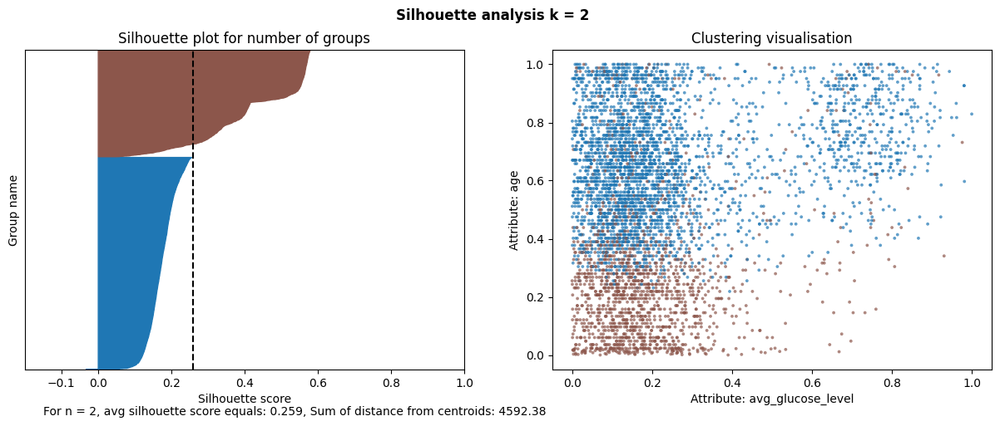

c:\Users\chabr\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\chabr\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


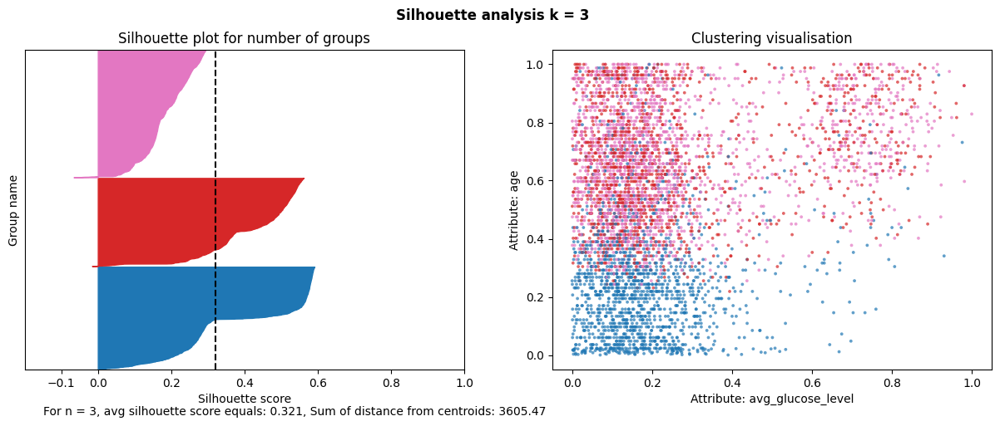

c:\Users\chabr\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\chabr\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


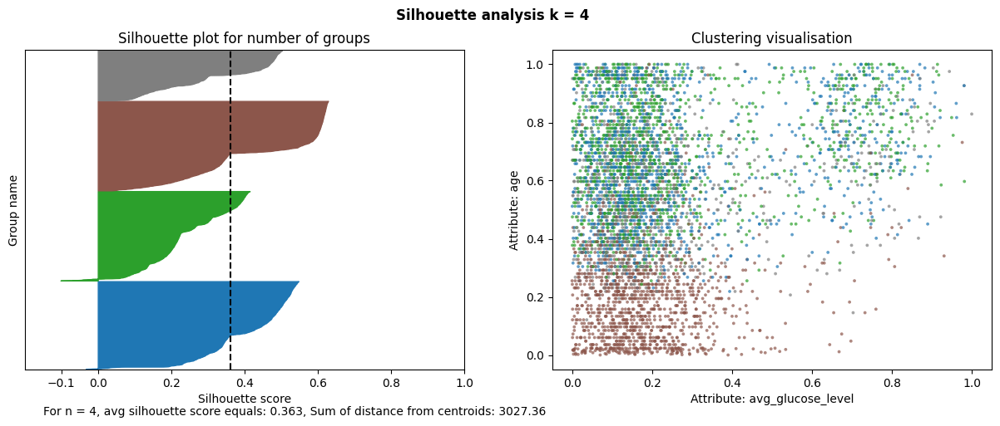

c:\Users\chabr\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\chabr\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


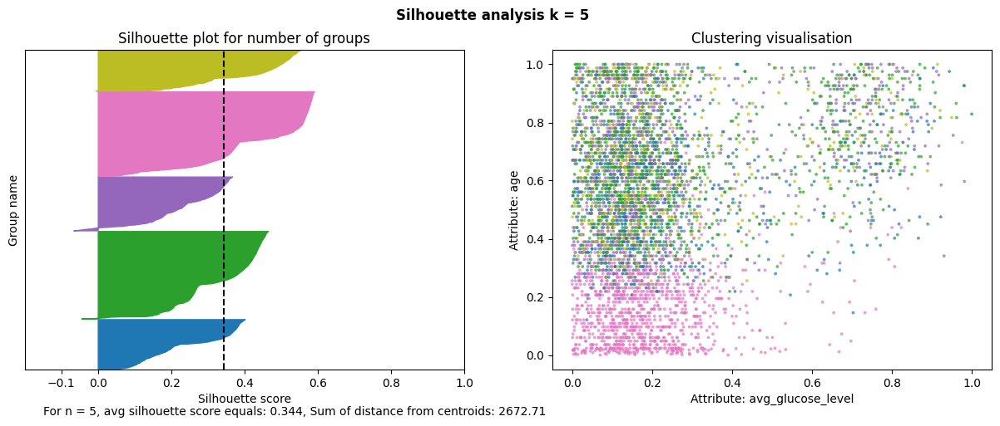

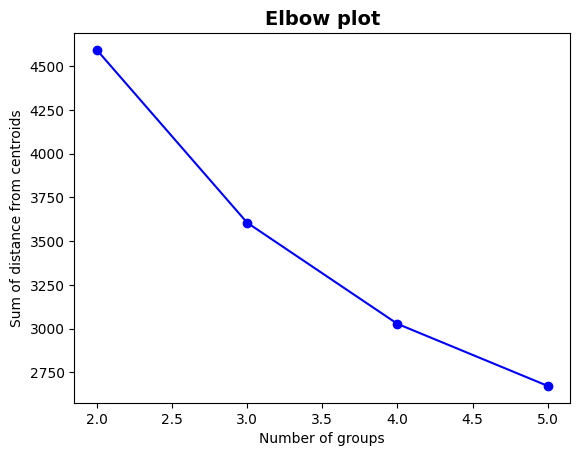

In [54]:
displaySilhouettesKMeans(dfNormalisedMoreReduced, [2,3,4,5], ["avg_glucose_level", "age"])

### Conclusions from the K-Means analysis after reducing two employment statuses:
* For k=4 and k=5, all silhouette scores are above the average, and the average silhouette scores have increased. However, it is still not an acceptable level.

### Conclusions from Unsupervised Learning
* Clear clusters cannot be distinguished in the dataset.
* Dimensionality reduction improves the accuracy of cluster assignment, but there is a slight tendency to assign to the "stroke" group.
* Reducing the employment status in the private and public sectors increases the accuracy of clustering. This may suggest that these attributes may not be significant in the dataset.

# 5. Supervised Learning
At this stage, we will conduct supervised learning. To do this, we will use the classifiers we have learned about during the course:

* K-Nearest Neighbors
* Nearest Centroid
* Naive Bayes Classifier
* Decision Tree  
  
We will test the classifiers on both the full-dimensional dataset and when the number of dimensions is reduced.

A potential issue with this dataset may be the very small number of individuals who have had a stroke. In the end, we will test whether oversampling methods increase the accuracy of the classifiers.

In [55]:
def divide(frame, ratio, randomState = None):
    descAtrsTrainSet, descAtrsTestSet, decisiveTrain, decisiveTest = train_test_split(frame.iloc[:,0:-1], frame.iloc[:,-1], test_size=ratio, random_state=randomState)
    return {"descAtrsTrainSet":descAtrsTrainSet, "descAtrsTestSet":descAtrsTestSet, "decisiveTrain":decisiveTrain, "decisiveTest":decisiveTest}

In [56]:
def verify(model,data,attribs, title):
    plt.figure(figsize=(15,3))
    model.fit(data["descAtrsTrainSet"].iloc[:,attribs], data["decisiveTrain"])
    train_result = model.predict(data["descAtrsTrainSet"].iloc[:,attribs])
    test_result = model.predict(data["descAtrsTestSet"].iloc[:,attribs])
    plt.subplot(1,2,1)
    mp = confusion_matrix(data["decisiveTrain"],train_result)
    sns.heatmap(mp, annot=mp, fmt='g')
    plt.title("Train set\naccuracy: {0}\nF1 score: {1}".format(model.score(data['descAtrsTrainSet'].iloc[:,attribs],data['decisiveTrain']),
                                                         f1_score(data["decisiveTrain"],train_result)))
    plt.xlabel("Predicted")
    plt.ylabel("Actual")

    plt.subplot(1,2,2)
    mp = confusion_matrix(data["decisiveTest"],test_result)
    sns.heatmap(mp, annot=mp, fmt='g')
    plt.title("Test set\naccuracy: {0}\nF1 score: {1}".format(model.score(data['descAtrsTestSet'].iloc[:,attribs],data['decisiveTest']),
                                               f1_score(data["decisiveTest"],test_result)))
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.suptitle("Confusion matrices for {0}".format(title))
    plt.tight_layout()
    plt.show()

In [57]:
def displayErrorPlotForKNN(data, maxK, attribs):
    kvals = range(1, maxK+1)
    rssAllTrainAcc = np.zeros(maxK)
    rssAllTestAcc = np.zeros(maxK)
    rssAllTrainF1 = np.zeros(maxK)
    rssAllTestF1 = np.zeros(maxK)
    for k in kvals:
        model = KNeighborsClassifier(n_neighbors=k)
        model.fit(data['descAtrsTrainSet'].iloc[:,attribs],data['decisiveTrain'])

        train_result = model.predict(data["descAtrsTrainSet"].iloc[:,attribs])
        test_result = model.predict(data["descAtrsTestSet"].iloc[:,attribs])

        rssAllTrainAcc[k-1] = 1-model.score(data['descAtrsTrainSet'].iloc[:,attribs],data['decisiveTrain'])
        rssAllTestAcc[k-1] = 1-model.score(data['descAtrsTestSet'].iloc[:,attribs],data['decisiveTest'])

        rssAllTrainF1[k-1] = 1 - f1_score(data["decisiveTrain"],train_result)
        rssAllTestF1[k-1] = 1 - f1_score(data["decisiveTest"],test_result)
    plt.figure(figsize=(15,4))
    plt.subplot(1,2,1)
    plt.plot(kvals, rssAllTrainAcc,'bo-', label="Train")
    plt.plot(kvals, rssAllTestAcc,'ro-', label="Test")
    plt.title('Error plot (accuracy)')
    plt.xlabel('Number of Neighbours')
    plt.ylabel('Error probability')
    plt.legend()
    plt.subplot(1,2,2)
    plt.plot(kvals, rssAllTrainF1,'bo-', label="Train")
    plt.plot(kvals, rssAllTestF1,'ro-', label="Test")
    plt.title('Error plot (f1 score)')
    plt.xlabel('Number of Neighbours')
    plt.ylabel('Error probability')
    plt.legend()

In [58]:
def displayErrorPlotForDecisionTree(data, maxK, attribs, criterion="gini", class_weight={0:1, 1:1}):
    kvals = range(1, maxK+1)
    rssAllTrainAcc = np.zeros(maxK)
    rssAllTestAcc = np.zeros(maxK)
    rssAllTrainF1 = np.zeros(maxK)
    rssAllTestF1 = np.zeros(maxK)
    for k in kvals:
        model = tree.DecisionTreeClassifier(max_depth=k, random_state=31, criterion=criterion , class_weight=class_weight)
        model.fit(data['descAtrsTrainSet'].iloc[:,attribs],data['decisiveTrain'])
        train_result = model.predict(data["descAtrsTrainSet"].iloc[:,attribs])
        test_result = model.predict(data["descAtrsTestSet"].iloc[:,attribs])

        rssAllTrainAcc[k-1] = 1-model.score(data['descAtrsTrainSet'].iloc[:,attribs],data['decisiveTrain'])
        rssAllTestAcc[k-1] = 1-model.score(data['descAtrsTestSet'].iloc[:,attribs],data['decisiveTest'])
        
        rssAllTrainF1[k-1] = 1 - f1_score(data["decisiveTrain"],train_result)
        rssAllTestF1[k-1] = 1 - f1_score(data["decisiveTest"],test_result)
    plt.figure(figsize=(15,4))
    plt.subplot(1,2,1)
    plt.plot(kvals, rssAllTrainAcc,'bo-', label="Train")
    plt.plot(kvals, rssAllTestAcc,'ro-', label="Test")
    plt.title('Error plot (accuracy)')
    plt.xlabel('Depth of tree')
    plt.ylabel('Error probability')
    plt.legend()
    plt.subplot(1,2,2)
    plt.plot(kvals, rssAllTrainF1,'bo-', label="Train")
    plt.plot(kvals, rssAllTestF1,'ro-', label="Test")
    plt.title('Error plot (f1 score)')
    plt.xlabel('Depth of tree')
    plt.ylabel('Error probability')
    plt.legend()

In [59]:
def makeNDivisionOfFrameAndCalculateMean(frame, attribs, model, ratio, nIterations, modelName, oversampler=None):
    accuracyScoresTrain = np.zeros(nIterations)
    f1ScoresTrain = np.zeros(nIterations)
    accuracyScoresTest = np.zeros(nIterations)
    f1ScoresTest = np.zeros(nIterations)
    for i in range(0, nIterations):
        dividedSet = divide(frame, ratio)
        
        if(oversampler != None):
            x = dividedSet["descAtrsTrainSet"]
            y = dividedSet["decisiveTrain"]
            x, y = oversampler.fit_resample(x, y)
            dividedSet["descAtrsTrainSet"] = x
            dividedSet["decisiveTrain"] = y

        model.fit(dividedSet['descAtrsTrainSet'].iloc[:,attribs],dividedSet['decisiveTrain'])
        
        train_result = model.predict(dividedSet["descAtrsTrainSet"].iloc[:,attribs])
        test_result = model.predict(dividedSet["descAtrsTestSet"].iloc[:,attribs])

        accuracyScoresTrain[i] = model.score(dividedSet['descAtrsTrainSet'].iloc[:,attribs],dividedSet['decisiveTrain'])
        accuracyScoresTest[i] = model.score(dividedSet['descAtrsTestSet'].iloc[:,attribs],dividedSet['decisiveTest'])
        
        f1ScoresTrain[i] = f1_score(dividedSet["decisiveTrain"],train_result)
        f1ScoresTest[i] = f1_score(dividedSet["decisiveTest"],test_result)
    meanAccurracyTrain, stdAccuracyTrain = accuracyScoresTrain.mean(), accuracyScoresTrain.std()
    meanF1Train, stdF1Train = f1ScoresTrain.mean(), f1ScoresTrain.std()
    meanAccurracyTest, stdAccuracyTest = accuracyScoresTest.mean(), accuracyScoresTest.std()
    meanF1Test, stdF1Test = f1ScoresTest.mean(), f1ScoresTest.std()

    print("Scores of {0} iterations with ratio: {1}, on model: {2}\n".format(nIterations, ratio, modelName))
    print("Train Set Accuracy:\nMean: {0}, Std: {1}".format(meanAccurracyTrain, stdAccuracyTrain))
    print("Train Set F1:\nMean: {0}, Std: {1}\n".format(meanF1Train, stdF1Train))
    print("Test Set Accuracy:\nMean: {0}, Std: {1}".format(meanAccurracyTest, stdAccuracyTest))
    print("Test Set F1:\nMean: {0}, Std: {1}\n".format(meanF1Test, stdF1Test))
    print("--------------------------------------------------------------------------------------------------------------------")


## 5.1 Full-Dimensional Data Analysis
### 5.1.1 K-Nearest Neighbors Classifier
We split the dataset into a training set and a test set. We chose an 80%-20% split ratio due to the large number of data points in the set.

In [60]:
randomState = 31
allAttributes = list(range(0,16))
data = divide(dfNormalised, 0.2, randomState)
print("Train set: {0} observations".format(data["decisiveTrain"].shape[0]))
print(data["decisiveTrain"].value_counts())
print("\nTest set: {0} observations".format(data["decisiveTest"].shape[0]))
print(data["decisiveTest"].value_counts())

Train set: 3936 observations
stroke
False    3734
True      202
Name: count, dtype: int64

Test set: 985 observations
stroke
False    939
True      46
Name: count, dtype: int64


We can observe that both the training set and the test set have observations from both classes in a similar ratio.

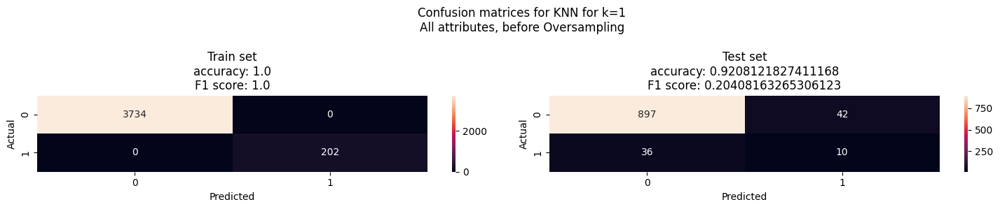

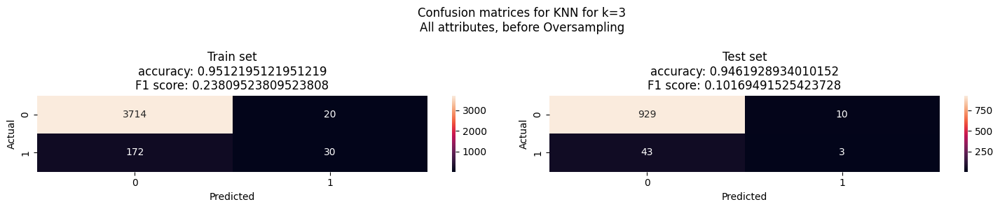

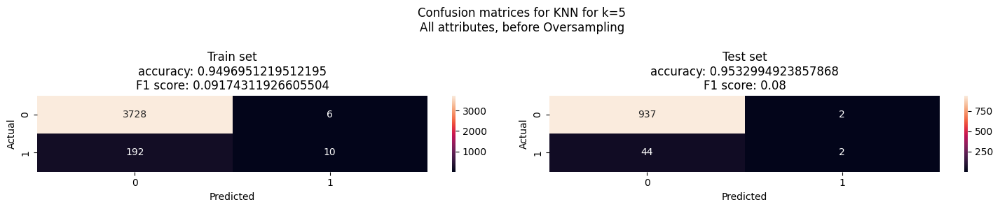

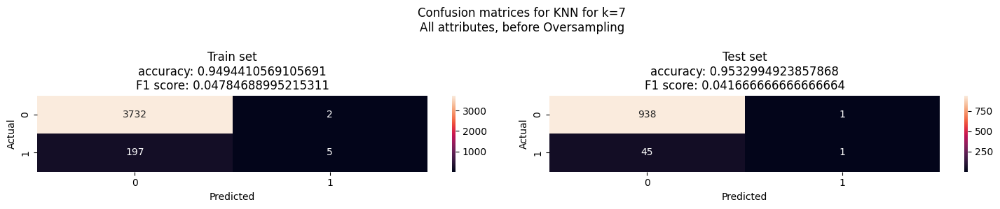

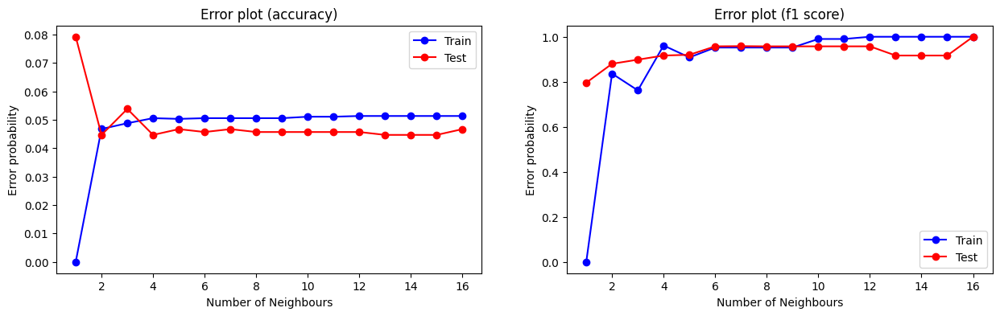

In [61]:
rangeOfK = [1,3,5,7]
for k in rangeOfK:
    model = KNeighborsClassifier(n_neighbors=k)
    verify(model, data, allAttributes, "KNN for k={0}\nAll attributes, before Oversampling".format(k))
displayErrorPlotForKNN(data, 16, allAttributes)

In [62]:
rangeOfK = [1,3,5,7]
for k in rangeOfK:
    model = KNeighborsClassifier(n_neighbors=k)
    makeNDivisionOfFrameAndCalculateMean(dfNormalised, allAttributes, model, 0.2, 20, "{0}NN Classifier before Oversampling, All attributes".format(k))

Scores of 20 iterations with ratio: 0.2, on model: 1NN Classifier before Oversampling, All attributes

Train Set Accuracy:
Mean: 1.0, Std: 0.0
Train Set F1:
Mean: 1.0, Std: 0.0

Test Set Accuracy:
Mean: 0.9101522842639593, Std: 0.00601902897777934
Test Set F1:
Mean: 0.10261263399866356, Std: 0.03749895016107395

--------------------------------------------------------------------------------------------------------------------
Scores of 20 iterations with ratio: 0.2, on model: 3NN Classifier before Oversampling, All attributes

Train Set Accuracy:
Mean: 0.9547256097560975, Std: 0.0013743016601929388
Train Set F1:
Mean: 0.28218886133904775, Std: 0.025882649471523595

Test Set Accuracy:
Mean: 0.9395939086294417, Std: 0.006776221967904659
Test Set F1:
Mean: 0.0644022819585415, Std: 0.039830881486834564

--------------------------------------------------------------------------------------------------------------------
Scores of 20 iterations with ratio: 0.2, on model: 5NN Classifier befor

### Conclusions from the Nearest Neighbors analysis for all attributes before oversampling:
* The accuracy is high, but we can see that the classification does not make sense; almost every observation is classified as not having a stroke.
* The highest accuracy is 95% for k=5, and the highest F1 score (which we should trust more) is 0.2 for k=1.
* The best average result in terms of accuracy was achieved by the 5NN classifier (95%), and in terms of F1, it was 1NN (11%).
### 5.1.2 Nearest Prototype Classifier

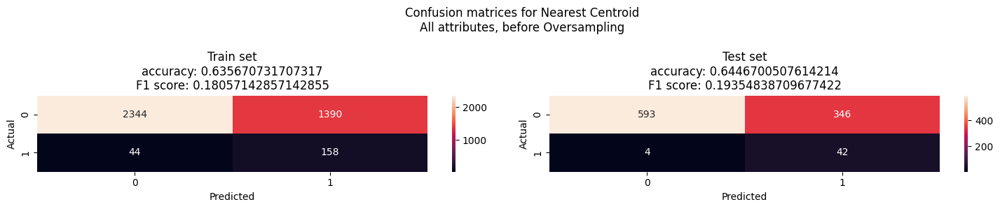

Scores of 50 iterations with ratio: 0.2, on model: Nearest Centroid before Oversampling, All attributes

Train Set Accuracy:
Mean: 0.6448424796747968, Std: 0.011147898035878723
Train Set F1:
Mean: 0.18231701973180364, Std: 0.006663198901524217

Test Set Accuracy:
Mean: 0.6426598984771574, Std: 0.01918055350922383
Test Set F1:
Mean: 0.18245011806518704, Std: 0.020734114848242443

--------------------------------------------------------------------------------------------------------------------


In [ ]:
model = NearestCentroid()
verify(model, data, allAttributes, "Nearest Centroid\nAll attributes, before Oversampling")
makeNDivisionOfFrameAndCalculateMean(dfNormalised, allAttributes, model, 0.2, 50, "Nearest Centroid before Oversampling, All attributes")

### Conclusions from the Nearest Centroid Classifier analysis for all attributes before oversampling:
* The Nearest Centroid classifier tends to falsely claim the existence of a stroke where there is none. The results are not satisfactory.
* Accuracy: 64%, F1 score: 19%
* The averaged results indicate a slightly higher F1 score but much lower accuracy compared to KNN.
### 5.1.3 Naive Bayes Classifier

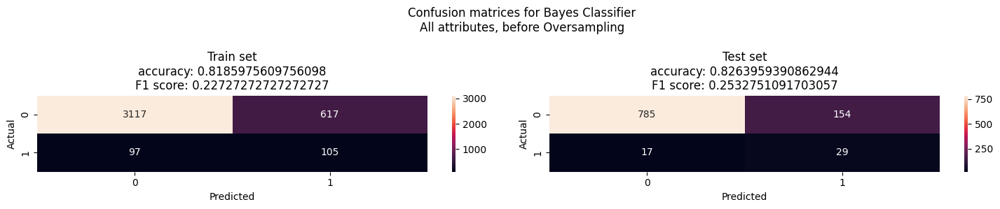

Scores of 50 iterations with ratio: 0.2, on model: Bayes Classifier before Oversampling, All attributes

Train Set Accuracy:
Mean: 0.7965497967479674, Std: 0.09222608974880132
Train Set F1:
Mean: 0.2323999643433953, Std: 0.022081419780243437

Test Set Accuracy:
Mean: 0.797725888324873, Std: 0.0923059977869653
Test Set F1:
Mean: 0.2252411056786724, Std: 0.038681317681258535

--------------------------------------------------------------------------------------------------------------------


In [ ]:
model = GaussianNB()

verify(model, data, allAttributes, "Bayes Classifier\nAll attributes, before Oversampling")
makeNDivisionOfFrameAndCalculateMean(dfNormalised, allAttributes, model, 0.2, 50, "Bayes Classifier before Oversampling, All attributes")

### Conclusions from the Naive Bayes Classifier analysis for all attributes before oversampling:
* Again, we observe a tendency to falsely claim the occurrence of a stroke. However, it is less pronounced than in the Nearest Centroid classifier.
* Accuracy: 82%, F1 score: 25%. F1 has achieved the best result so far.
* However, we can see that the presented heatmap division is favorable. The average results are lower.
### 5.1.4 Decision Tree Classifier

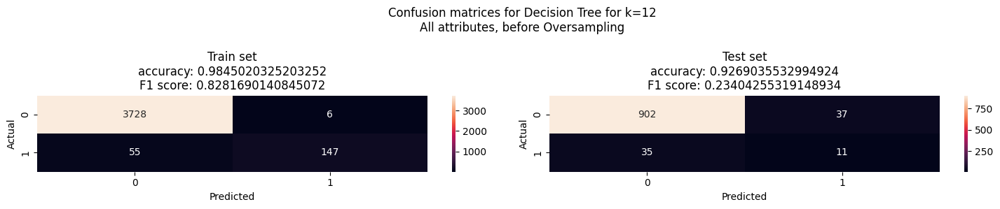

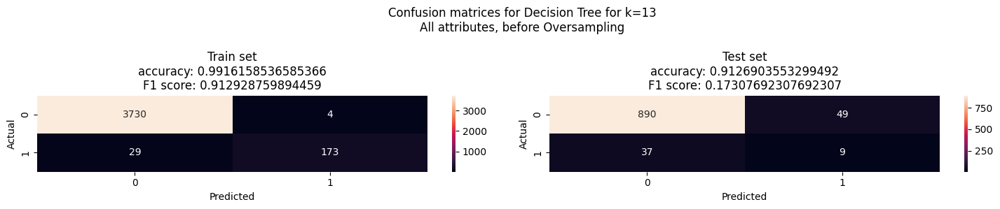

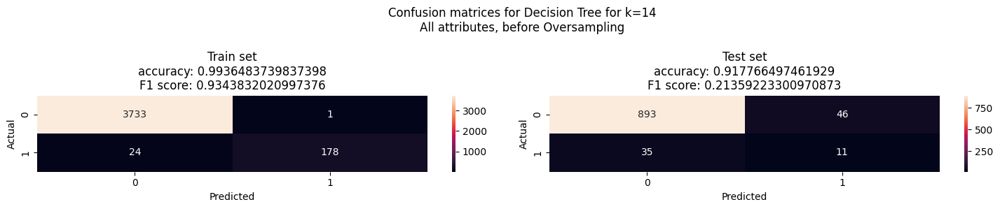

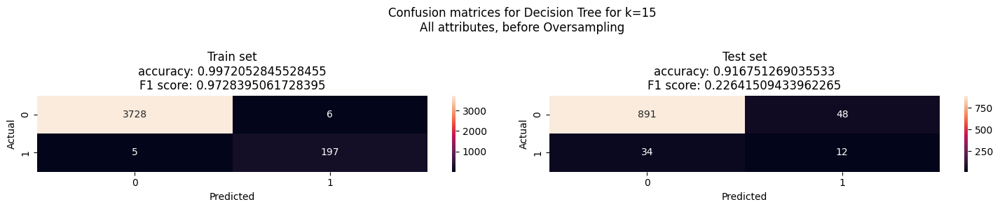

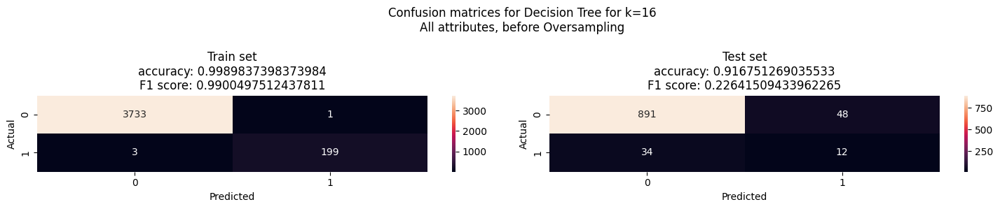

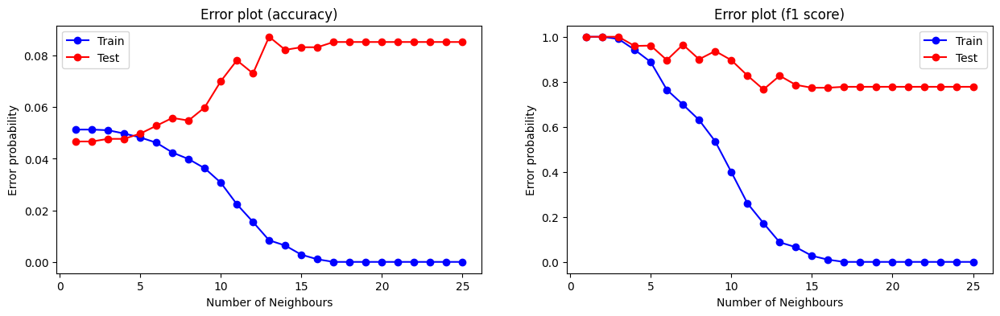

In [ ]:
rangeOfK = [12,13,14,15,16]
for k in rangeOfK:
    model = tree.DecisionTreeClassifier(max_depth=k, random_state=randomState)
    verify(model, data, allAttributes, "Decision Tree for k={0}\nAll attributes, before Oversampling".format(k))
displayErrorPlotForDecisionTree(data, 25, allAttributes)

In [ ]:
rangeOfK = [10,11,12,13,14,15,16]
for k in rangeOfK:
    model = tree.DecisionTreeClassifier(max_depth=k)
    makeNDivisionOfFrameAndCalculateMean(dfNormalised, allAttributes, model, 0.2, 50, "Decision Tree for k={0}\nAll attributes, before Oversampling".format(k))

Scores of 50 iterations with ratio: 0.2, on model: Decision Tree for k=10
All attributes, before Oversampling

Train Set Accuracy:
Mean: 0.975625, Std: 0.0034558113240256835
Train Set F1:
Mean: 0.6879610178309095, Std: 0.05786652138502389

Test Set Accuracy:
Mean: 0.9239593908629441, Std: 0.007735081278700689
Test Set F1:
Mean: 0.10531702826331525, Std: 0.053128500889545155

--------------------------------------------------------------------------------------------------------------------
Scores of 50 iterations with ratio: 0.2, on model: Decision Tree for k=11
All attributes, before Oversampling

Train Set Accuracy:
Mean: 0.9814278455284553, Std: 0.0043096051656180395
Train Set F1:
Mean: 0.7790029431564087, Std: 0.060460023634907635

Test Set Accuracy:
Mean: 0.9188223350253807, Std: 0.008329724969682418
Test Set F1:
Mean: 0.11312580250396509, Std: 0.04213966100913381

--------------------------------------------------------------------------------------------------------------------


### Conclusions from the Decision Tree Classifier analysis for all attributes before oversampling:
* The decision tree achieves the best overall results, although still far from ideal. However, the F1 measure is slightly smaller than the Naive Bayes classifier.
* Accuracy: 92%, F1: 23% for k=12
* Again, in this case, we see that the heatmap division is optimistic.
* The highest averaged F1 measure for the presented divisions is much smaller than that shown on the heatmap.
  
The classifiers did not achieve good efficiency; we will check what results they will achieve after dimensionality reduction.

## 5.2 Dimensionality Reduction
Based on the exploratory data analysis, not all features may play a significant role in this classification. The likelihood of a stroke was similar based on gender as well as place of residence. The columns ever_married and work_children are associated with age. The smoking_Unknown column does not seem to be valuable in this analysis due to the lack of significance of this data in the real world. As shown in unsupervised learning, job statuses in the private and public sectors may also not be significant.

To analyze the usefulness of attributes for classification, we will display the decision tree without pruning. This will allow us to assess which attributes are useful in classification and which are not.

In [ ]:
model = tree.DecisionTreeClassifier()
model.fit(data['descAtrsTrainSet'].iloc[:,allAttributes],data['decisiveTrain'])
print("Feature importance:")
for id, feature in enumerate(model.feature_importances_):
    print(data["descAtrsTestSet"].columns[id],"|", model.feature_importances_[id],"\n")

Feature importance:
is_female | 0.02902226184224369 

age | 0.17599616910029275 

hypertension | 0.028299350402951194 

heart_disease | 0.020336580941911705 

ever_married | 0.013779375030496583 

is_urban | 0.014771889780136186 

avg_glucose_level | 0.32334881082770245 

bmi | 0.2616737725891371 

work_Govt_job | 0.021738637444827708 

work_Private | 0.013074724457700635 

work_Self-employed | 0.022909948829751454 

work_children | 0.0 

smoking_Unknown | 0.014182004616481822 

smoking_formerly smoked | 0.029749982420386047 

smoking_never smoked | 0.013455039907082772 

smoking_smokes | 0.017661451808897933 



In [ ]:
fig = plt.figure(figsize=(30,20), dpi=1000)
classes = dfNormalised.iloc[:,-1].sort_values().unique().astype("str")
tree.plot_tree(model, 
            feature_names=dfNormalised.iloc[:,:-1].columns,  
            class_names=classes,
            filled=True)
plt.savefig("tree.png")

### Conclusions from the unpruned decision tree analysis:
* Both numbers and the tree suggest that numerical attributes are the most important. Among them, glucose level is significantly predominant.
* The second and third most important attributes are BMI and age.
* Categorical attributes have significantly lower importance.
* The attribute "work_children" is not used anywhere, likely due to its association with age.
* The "smoking_Unknown" attribute has the second smallest importance. It does not have a real-world representation.
* According to the importance index, the most crucial decision attribute is hypertension, confirmed by examining the tree.
* Despite the low index, the "work_Self-employed" attribute's test is high in the tree structure, suggesting its significance.
* Similarly, the "ever_married" attribute.
* The absence of the "smoking_smokes" status can correctly characterize the absence of a stroke.
* The "never_smoked" attribute often occurs when there are many samples in the test.
* Despite its rare occurrence in the tree, the "formerly_smoked" attribute has a high importance measure.
* Despite the high "is_female" index, it usually allows differentiation between individual attributes (~10 observations).
* Similarly with the "is_urban" attribute.
* The "work_Govt_job" attribute often appears in tests, but they usually involve single samples, similarly to "work_private".
  
Summary:
#### Key Attributes:
* avg_glucose_level
* bmi
* age

#### Important Attributes:
* hypertension
* heart_disease
* smoking_smokes
* smoking_never_smoked
* smoking_formerly smoked
* ever_married
* work_Self employed

#### Potentially Insignificant Attributes:
* is_female
* is_urban
* work_Govt_job
* work_private

#### Insignificant Attributes:
* work_children
* smoking_Unknown

We will analyze the classifier results by eliminating attributes identified as potentially irrelevant or irrelevant. The analysis code refers to attributes by their indices. Below, we will display the order of attributes and select the indices that interest us.

In [ ]:
dfNormalised.columns

Index(['is_female', 'age', 'hypertension', 'heart_disease', 'ever_married',
       'is_urban', 'avg_glucose_level', 'bmi', 'work_Govt_job', 'work_Private',
       'work_Self-employed', 'work_children', 'smoking_Unknown',
       'smoking_formerly smoked', 'smoking_never smoked', 'smoking_smokes',
       'stroke'],
      dtype='object')

In [ ]:
attributesReduced = [1,2,3,4,6,7,10,13,14,15]

### 5.2.1 K-Nearest Neighbours Classifier

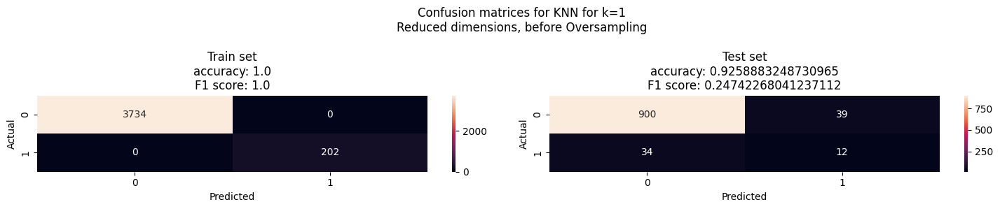

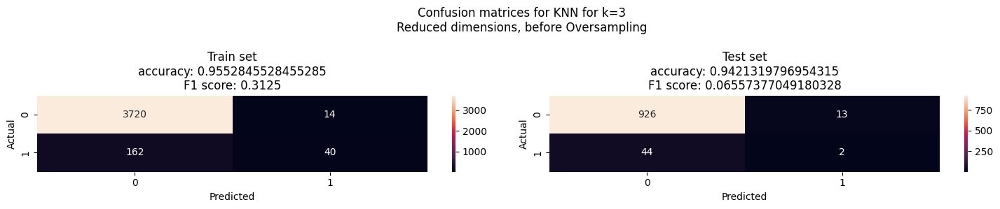

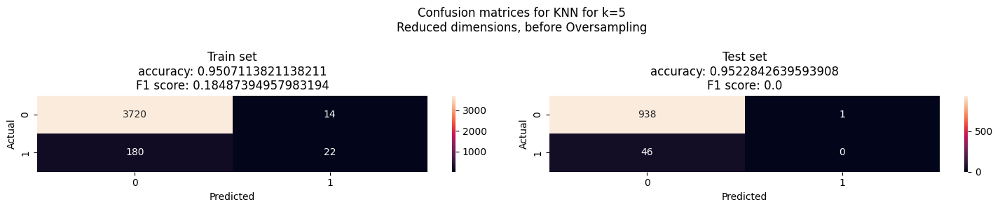

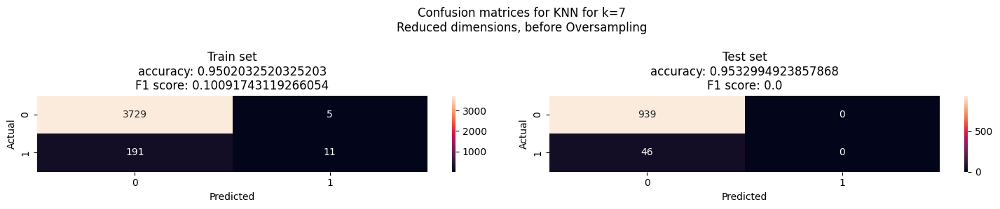

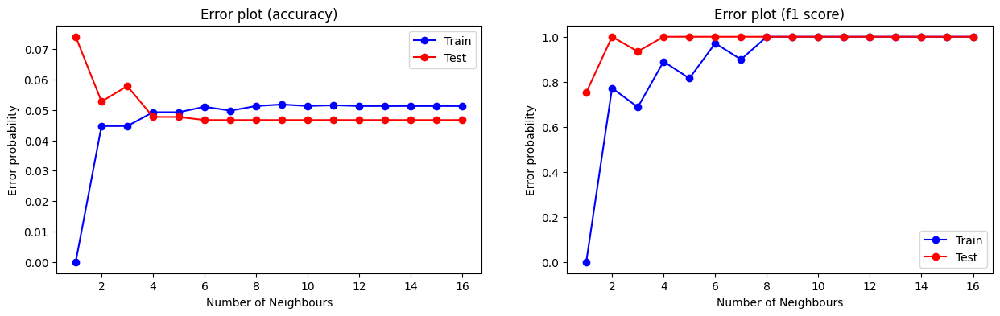

In [ ]:
rangeOfK = [1,3,5,7]
for k in rangeOfK:
    model = KNeighborsClassifier(n_neighbors=k)
    verify(model, data, attributesReduced, "KNN for k={0}\nReduced dimensions, before Oversampling".format(k))
displayErrorPlotForKNN(data, 16, attributesReduced)

In [ ]:
rangeOfK = [1,3,5,7]
for k in rangeOfK:
    model = KNeighborsClassifier(n_neighbors=k)
    makeNDivisionOfFrameAndCalculateMean(dfNormalised, attributesReduced, model, 0.2, 20, "{0}NN Classifier before Oversampling, Reduced dimensions".format(k))

Scores of 20 iterations with ratio: 0.2, on model: 1NN Classifier before Oversampling, Reduced dimensions

Train Set Accuracy:
Mean: 1.0, Std: 0.0
Train Set F1:
Mean: 1.0, Std: 0.0

Test Set Accuracy:
Mean: 0.9113705583756346, Std: 0.0069087767637965765
Test Set F1:
Mean: 0.12964431091383727, Std: 0.050748839878592744

--------------------------------------------------------------------------------------------------------------------
Scores of 20 iterations with ratio: 0.2, on model: 3NN Classifier before Oversampling, Reduced dimensions

Train Set Accuracy:
Mean: 0.9577870934959348, Std: 0.0018622724851179587
Train Set F1:
Mean: 0.37578042084955443, Std: 0.02637526621911019

Test Set Accuracy:
Mean: 0.9358375634517765, Std: 0.005603104457480872
Test Set F1:
Mean: 0.08276415249321631, Std: 0.02912492891408053

--------------------------------------------------------------------------------------------------------------------
Scores of 20 iterations with ratio: 0.2, on model: 5NN Classi

### Conclusions from the analysis of the KNN classifier after dimensionality reduction before oversampling:
* The result has slightly improved; for k=1, KNN correctly classified 5 more cases. Accuracy is 92.5%, F1 is 24.7%.
* Classifier accuracies decrease when taking the average of 20 measurements.
* However, when compared to the previous results for KNN, we can observe that the average F1 has increased by a few percentage points for both the presented case and for 20 measurements.
### 5.1.2 Nearest Centroid Classifier

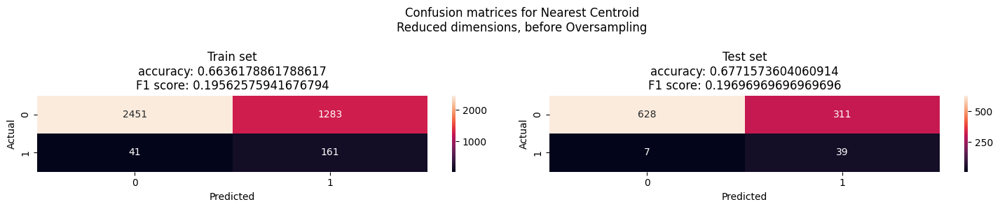

Scores of 50 iterations with ratio: 0.2, on model: Nearest Centroid before Oversampling, Reduced dimensions

Train Set Accuracy:
Mean: 0.6788821138211381, Std: 0.008684244870045921
Train Set F1:
Mean: 0.19955345788691176, Std: 0.006784699046589496

Test Set Accuracy:
Mean: 0.6772994923857868, Std: 0.01354028539234954
Test Set F1:
Mean: 0.19534703778227913, Std: 0.022436605294093505

--------------------------------------------------------------------------------------------------------------------


In [ ]:
model = NearestCentroid()

verify(model, data, attributesReduced, "Nearest Centroid\nReduced dimensions, before Oversampling")
makeNDivisionOfFrameAndCalculateMean(dfNormalised, attributesReduced, model, 0.2, 50, "Nearest Centroid before Oversampling, Reduced dimensions")

### Conclusions from the analysis of the Nearest Centroid Classifier after dimensionality reduction before oversampling:
* Classifier accuracy increased; it is now 67%, and F1 is 19%.
* The achieved results are still not good. This may be due to the lack of clear clusters.
* Accuracies for both the average and the presented result have slightly increased, and F1 remained the same.
### 5.2.3 Naive Bayes Classifier

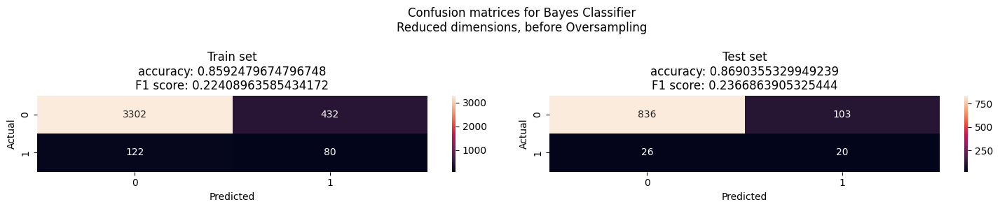

Scores of 50 iterations with ratio: 0.2, on model: Bayes Classifier before Oversampling, Reduced dimensions

Train Set Accuracy:
Mean: 0.8599085365853659, Std: 0.0025411584857825153
Train Set F1:
Mean: 0.22431276143815915, Std: 0.008106447762171563

Test Set Accuracy:
Mean: 0.8602233502538071, Std: 0.009537615850257794
Test Set F1:
Mean: 0.23082620274313018, Std: 0.03625849799495247

--------------------------------------------------------------------------------------------------------------------


In [ ]:
model = GaussianNB()

verify(model, data, attributesReduced, "Bayes Classifier\nReduced dimensions, before Oversampling")
makeNDivisionOfFrameAndCalculateMean(dfNormalised, attributesReduced, model, 0.2, 50, "Bayes Classifier before Oversampling, Reduced dimensions")

### Conclusions from the analysis of the Bayes Classifier after dimensionality reduction before oversampling:
* After dimensionality reduction, the classifier is less inclined to classify into the "stroke" group.
* Overall classification accuracy has improved, but 9 fewer stroke cases were correctly classified.
* There is a tendency to overclassify as a stroke.
### 5.2.4 Decision Tree Classifier

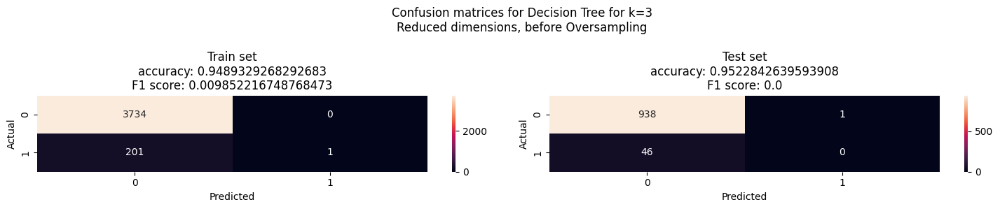

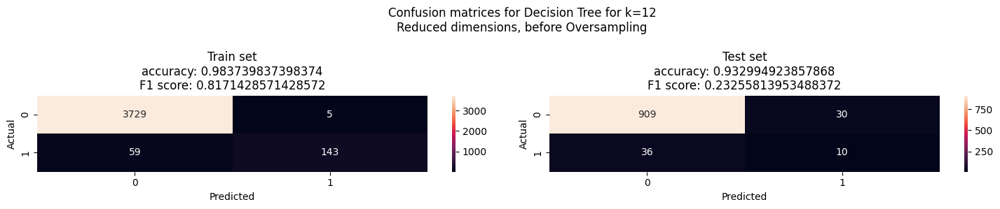

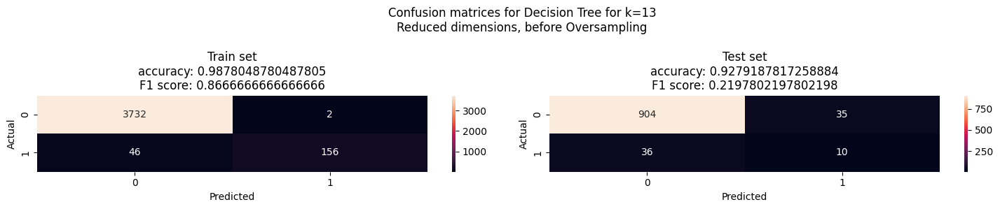

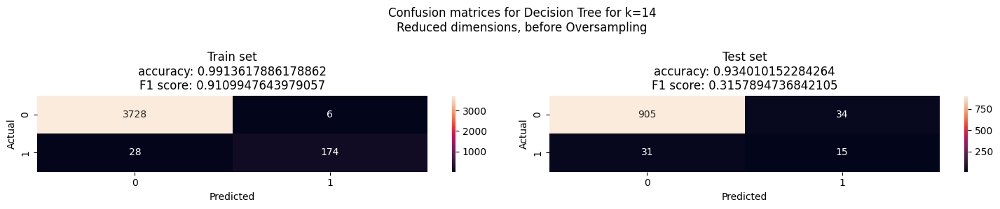

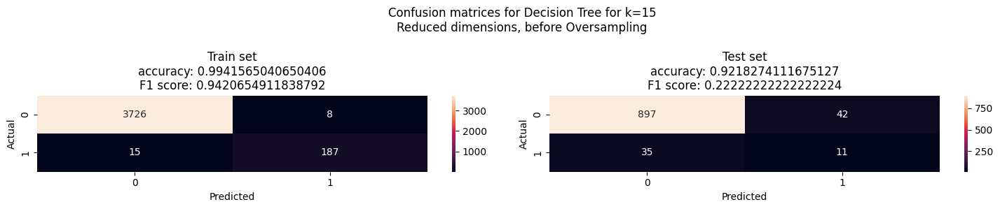

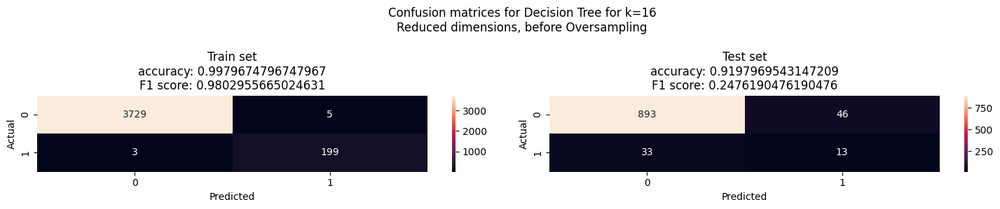

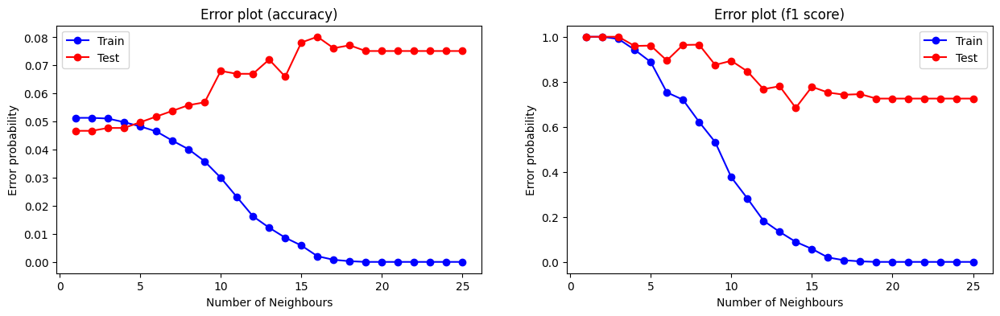

In [ ]:
rangeOfK = [3,12,13,14,15,16]
for k in rangeOfK:
    model = tree.DecisionTreeClassifier(max_depth=k, random_state=randomState)
    verify(model, data, attributesReduced, "Decision Tree for k={0}\nReduced dimensions, before Oversampling".format(k))
displayErrorPlotForDecisionTree(data, 25, attributesReduced)

In [ ]:
rangeOfK = [10,11,12,13,14,15,16]
for k in rangeOfK:
    model = tree.DecisionTreeClassifier(max_depth=k)
    makeNDivisionOfFrameAndCalculateMean(dfNormalised, attributesReduced, model, 0.2, 50, "Decision Tree for k={0}\nReduced Dimensions, before Oversampling".format(k))

Scores of 50 iterations with ratio: 0.2, on model: Decision Tree for k=10
Reduced Dimensions, before Oversampling

Train Set Accuracy:
Mean: 0.9737957317073171, Std: 0.0043601617536370854
Train Set F1:
Mean: 0.6602163517051062, Std: 0.07535466715869774

Test Set Accuracy:
Mean: 0.9285279187817258, Std: 0.009000674216975228
Test Set F1:
Mean: 0.10866718160171507, Std: 0.05094655862662124

--------------------------------------------------------------------------------------------------------------------
Scores of 50 iterations with ratio: 0.2, on model: Decision Tree for k=11
Reduced Dimensions, before Oversampling

Train Set Accuracy:
Mean: 0.9800152439024391, Std: 0.003402047583868525
Train Set F1:
Mean: 0.758793264461439, Std: 0.050929191251788096

Test Set Accuracy:
Mean: 0.92048730964467, Std: 0.00834821538694787
Test Set F1:
Mean: 0.11552929434350881, Std: 0.04738730505033601

---------------------------------------------------------------------------------------------------------

### Conclusions from the Decision Tree Classifier analysis after dimensionality reduction before oversampling:
* After dimensionality reduction, the classifier's accuracy improved. The best result was obtained for k=14. The accuracy increased by 1% to 93%, and F1 increased to 31.5%. However, this is still not a satisfactory result.
* The highest accuracy (95%) occurs for k=3. However, it simply assigns almost every observation as "no stroke," which is unacceptable.
* For k=14, there is a similar number of False Positive and False Negative elements.
* The most acceptable average results are obtained for k=14. Unfortunately, the classifier's accuracy decreases with the number of repetitions. F1 is around 14%.
### Dimensionality Reduction Conclusions:
* Dimensionality reduction can improve classifier results. However, it does not yield alarming results, and we still cannot trust the classifiers completely.
* The Bayes Classifier increases its overall accuracy.
* The Decision Tree Classifier increases both its accuracy and F1 score.

## 5.3 Oversampling - RandomOverSampler
In this step, we will test whether Oversampling methods positively impact classification results. In the first step we will use RandomOverSampler and SMOTE in the next one.
  
Initially, we will use RandomOverSampler, which randomly selects samples from the dataset and duplicates them. First, we will test this method by oversampling the entire dataset and then by dividing it into a training and testing set. Realizing that it is better practice to leave the test set unmodified, in the subsequent steps, we will first split the data into training and testing sets, and then oversample only the training set. This will allow us to obtain more reliable results.

### 5.3.1 Oversampling whole dataset

In [ ]:
oversampler = RandomOverSampler(sampling_strategy=0.3, random_state=randomState)
dfReducedToOversample = dfNormalised.loc[:,['age', 'hypertension', 'heart_disease', 'ever_married', 'avg_glucose_level', 'bmi', 
                                            'work_Self-employed', 'smoking_formerly smoked', 'smoking_never smoked', 
                                            'smoking_smokes',"stroke"]]
y = dfReducedToOversample["stroke"]
x = dfReducedToOversample.iloc[:,:-1]

x, y = oversampler.fit_resample(x, y)

dfOversampled = pd.DataFrame(pd.concat([x,y], axis=1))
dfOversampled["stroke"].value_counts()

stroke
False    4673
True     1401
Name: count, dtype: int64

In [ ]:
duplicates = dfOversampled.duplicated()
print("Number of duplicates: {0}".format(duplicates.sum()))

Number of duplicates: 1153


In [ ]:
dataWholeSetOversampled = divide(dfOversampled, 0.2, randomState)
allAttributesReduced = list(range(0,10))
print("Training set", dataWholeSetOversampled["decisiveTrain"].value_counts())
print("\nTesting set", dataWholeSetOversampled["decisiveTest"].value_counts())

Training set stroke
False    3736
True     1123
Name: count, dtype: int64

Testing set stroke
False    937
True     278
Name: count, dtype: int64


After oversampling both the training and testing sets, we observe that the prevalence of the "stroke" class has increased from 5% to 23% of the entire dataset. Additionally, we notice that duplicates are added to the dataset when using this method.

### 5.3.1.1 K-Nearest Neighbors Classifier

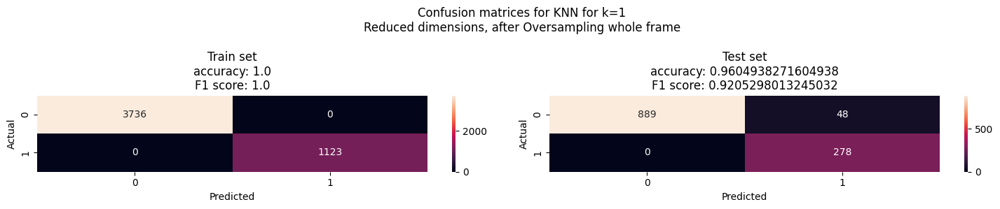

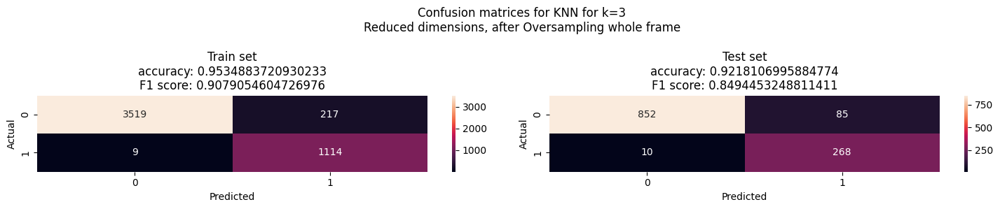

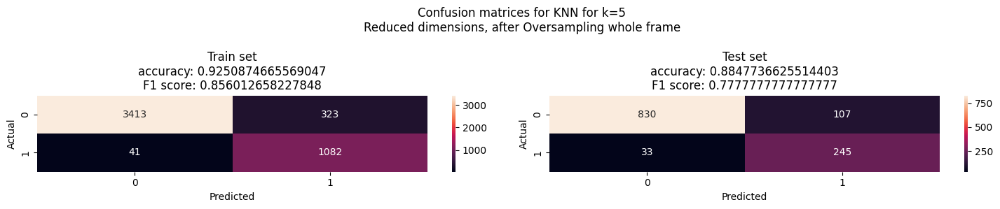

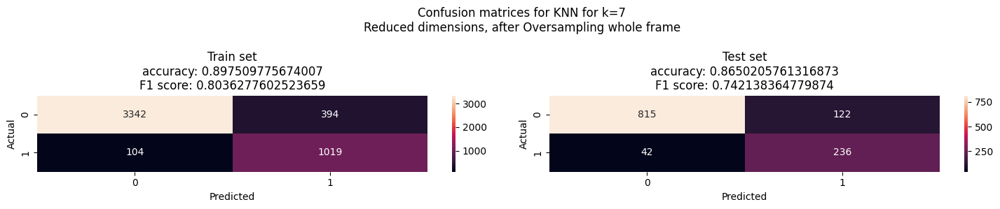

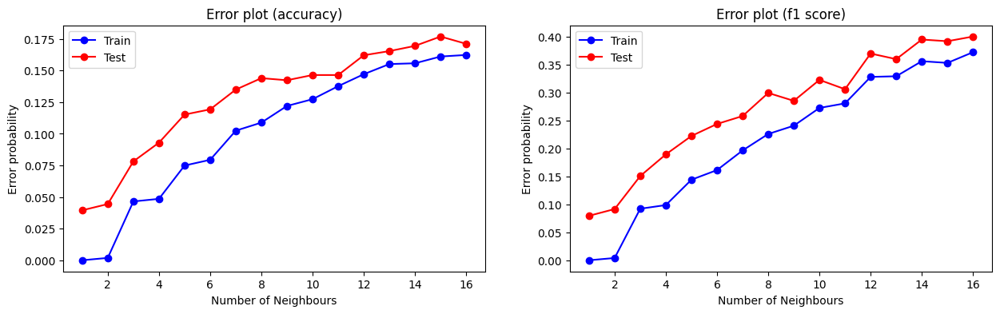

In [ ]:
rangeOfK = [1,3,5,7]
for k in rangeOfK:
    model = KNeighborsClassifier(n_neighbors=k)
    verify(model, dataWholeSetOversampled, allAttributesReduced, "KNN for k={0}\nReduced dimensions, after Oversampling whole frame".format(k))
displayErrorPlotForKNN(dataWholeSetOversampled, 16, allAttributesReduced)

In [ ]:
rangeOfK = [1,3,5,7]
for k in rangeOfK:
    model = KNeighborsClassifier(n_neighbors=k)
    makeNDivisionOfFrameAndCalculateMean(dfOversampled, allAttributesReduced, model, 0.2, 20, "{0}NN Classifier after Oversampling whole frame, Reduced dimensions".format(k))

Scores of 20 iterations with ratio: 0.2, on model: 1NN Classifier after Oversampling whole frame, Reduced dimensions

Train Set Accuracy:
Mean: 1.0, Std: 0.0
Train Set F1:
Mean: 1.0, Std: 0.0

Test Set Accuracy:
Mean: 0.9531275720164609, Std: 0.005149626588328612
Test Set F1:
Mean: 0.9069919680047495, Std: 0.01033236911842593

--------------------------------------------------------------------------------------------------------------------
Scores of 20 iterations with ratio: 0.2, on model: 3NN Classifier after Oversampling whole frame, Reduced dimensions

Train Set Accuracy:
Mean: 0.9553714756122659, Std: 0.0011333692010150858
Train Set F1:
Mean: 0.9111927912756528, Std: 0.0025594802053809417

Test Set Accuracy:
Mean: 0.9155144032921811, Std: 0.008613612087708278
Test Set F1:
Mean: 0.8392748536596539, Std: 0.01902021134370073

--------------------------------------------------------------------------------------------------------------------
Scores of 20 iterations with ratio: 0.2, o

### Conclusions from the analysis of the K-Nearest Neighbors Classifier after dimensionality reduction and oversampling of the entire frame:
* The classifier (especially for k=1) performs very well (accuracy 96%, F1 92%). However, we begin to observe a tendency to classify as a stroke. This may be due to the artificially increased probability of stroke occurrence.
* The average of twenty samples also shows high results (accuracy 95%, F1 91%).
* The classifier performs so well because the test set has been similarly oversampled as the training set. Although it looks satisfying, these results may not be reliable. When new, real data is provided, the results probably wouldn't be as good.

### 5.3.1.2 Nearest Centroid Classifier

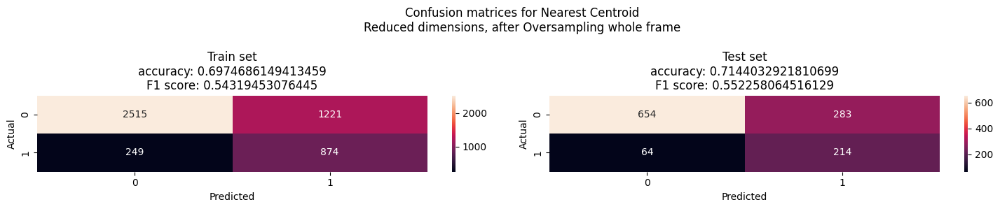

Scores of 50 iterations with ratio: 0.2, on model: Nearest Centroid after Oversampling whole frame, Reduced dimensions

Train Set Accuracy:
Mean: 0.7019715990944639, Std: 0.004073590186261211
Train Set F1:
Mean: 0.5476739944313401, Std: 0.005195863605372414

Test Set Accuracy:
Mean: 0.7038353909465022, Std: 0.013010739574420829
Test Set F1:
Mean: 0.555326391410269, Std: 0.016594439018735554

--------------------------------------------------------------------------------------------------------------------


In [ ]:
model = NearestCentroid()

verify(model, dataWholeSetOversampled, allAttributesReduced, "Nearest Centroid\nReduced dimensions, after Oversampling whole frame")
makeNDivisionOfFrameAndCalculateMean(dfOversampled, allAttributesReduced, model, 0.2, 50, "Nearest Centroid after Oversampling whole frame, Reduced dimensions")

### Conclusions from the analysis of the Nearest Centroid Classifier after dimensionality reduction and oversampling of the entire frame:
* Accuracy did not change significantly; however, F1 increased by about 35% for both the presented division and average measurements. Similarly to the previous classifier, this may not reflect reality.
* We also observe a tendency to classify as a stroke.
### 5.3.1.3 Naive Bayes Classifier

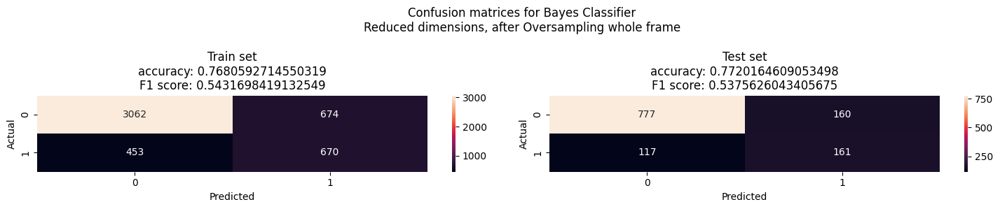

Scores of 50 iterations with ratio: 0.2, on model: Bayes Classifier after Oversampling whole frame, Reduced dimensions

Train Set Accuracy:
Mean: 0.7717596213212594, Std: 0.003188958145207637
Train Set F1:
Mean: 0.5468367761049304, Std: 0.008526905942657835

Test Set Accuracy:
Mean: 0.7681975308641975, Std: 0.011977794489775775
Test Set F1:
Mean: 0.5445638364397143, Std: 0.024454197314098956

--------------------------------------------------------------------------------------------------------------------


In [ ]:
model = GaussianNB()

verify(model, dataWholeSetOversampled, allAttributesReduced, "Bayes Classifier\nReduced dimensions, after Oversampling whole frame")
makeNDivisionOfFrameAndCalculateMean(dfOversampled, allAttributesReduced, model, 0.2, 50, "Bayes Classifier after Oversampling whole frame, Reduced dimensions")

### Conclusions from the analysis of the Bayes classifier after dimensionality reduction and oversampling of the entire frame:
* Despite a significant increase in F1, overall accuracy decreased. This classifier performs well only for the "True Negatives" group, and the number of assigned cases to the other groups is comparable.
### 5.3.1.4 Decision Tree Classifier

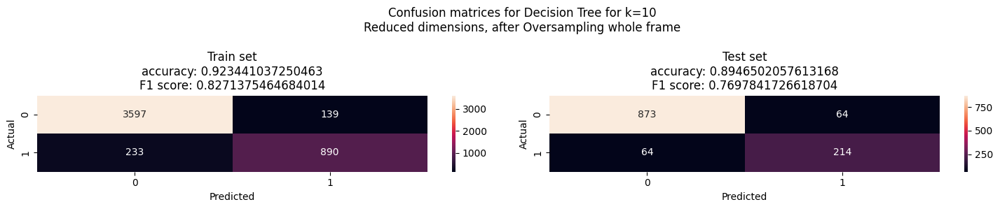

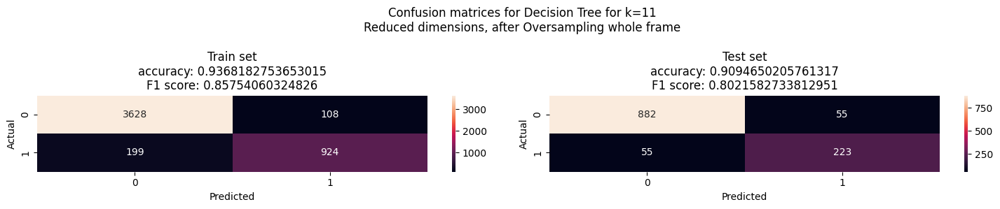

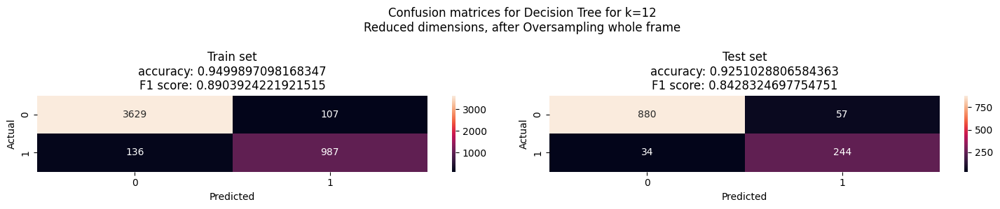

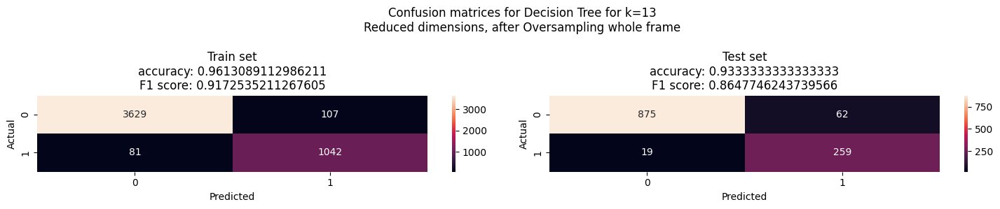

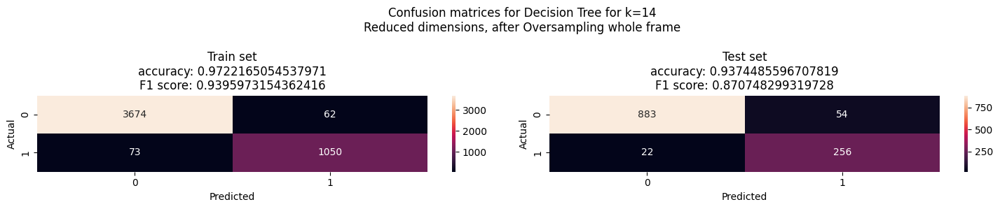

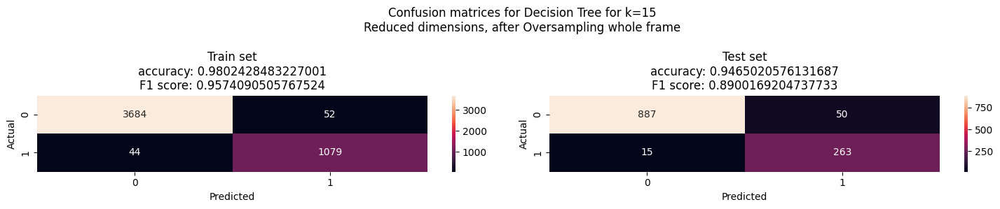

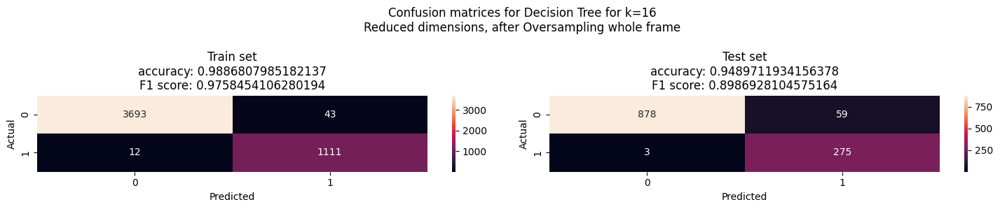

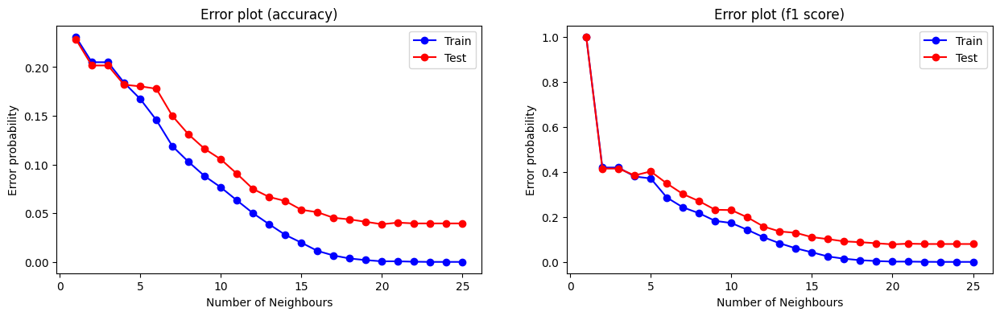

In [ ]:
rangeOfK = [10,11,12,13,14,15,16]
for k in rangeOfK:
    model = tree.DecisionTreeClassifier(max_depth=k, random_state=31)
    verify(model, dataWholeSetOversampled, allAttributesReduced, "Decision Tree for k={0}\nReduced dimensions, after Oversampling whole frame".format(k))
displayErrorPlotForDecisionTree(dataWholeSetOversampled, 25, allAttributesReduced)

In [ ]:
rangeOfK = [10,11,12,13,14,15,16]
for k in rangeOfK:
    model = tree.DecisionTreeClassifier(max_depth=k)
    makeNDivisionOfFrameAndCalculateMean(dfOversampled, allAttributesReduced, model, 0.2, 50, "Decision Tree for k={0}\nReduced Dimensions, after Oversampling whole frame".format(k))

Scores of 50 iterations with ratio: 0.2, on model: Decision Tree for k=10
Reduced Dimensions, after Oversampling whole frame

Train Set Accuracy:
Mean: 0.9313850586540441, Std: 0.00722203733330019
Train Set F1:
Mean: 0.8541302434037257, Std: 0.01625731697607005

Test Set Accuracy:
Mean: 0.8994238683127571, Std: 0.009471817205475424
Test Set F1:
Mean: 0.7976689576199086, Std: 0.022495470247141325

--------------------------------------------------------------------------------------------------------------------
Scores of 50 iterations with ratio: 0.2, on model: Decision Tree for k=11
Reduced Dimensions, after Oversampling whole frame

Train Set Accuracy:
Mean: 0.9482650751183371, Std: 0.00882875072088719
Train Set F1:
Mean: 0.8912250776997118, Std: 0.017947340742679653

Test Set Accuracy:
Mean: 0.9091028806584363, Std: 0.009637940910493137
Test Set F1:
Mean: 0.8193219678804653, Std: 0.02052981994989309

-----------------------------------------------------------------------------------

### Conclusions from the analysis of the Decision Tree Classifier after dimensionality reduction and oversampling of the entire frame:
* The decision tree performs very well. It would be most logical to stop the classifier at k=13. The achieved results are 93% accuracy and 86% F1. Here, too, there is a greater tendency to incorrectly assign to the stroke group.
* The average results are similar as well.
* Despite very good results, we must remember that they were obtained on a modified test set.

### General conclusions after oversampling both sets using the RandomOverSampling method:
* The F1 score and, in most cases, accuracy have significantly increased. However, one should not be too enthusiastic because a good result on a modified test set does not imply good results for real data.
* There is a greater tendency to incorrectly assign to the "stroke" group than to the "no stroke" group. This may be the result of artificially increasing the number of samples in the "stroke" class.

### 5.3.2 Oversampling only the training set
At this point, recognizing possible drawbacks of oversampling the test set, we will conduct oversampling only the training set, hoping that this will provide more reliable classification results.

In [ ]:
dfReducedROS = dfReducedToOversample.copy()
dataTrainOversampled = divide(dfReducedROS, 0.2, randomState)
oversamplerROS = RandomOverSampler(sampling_strategy=0.3, random_state=randomState)
oversamplerROSForMean = RandomOverSampler(sampling_strategy=0.3)

x = dataTrainOversampled["descAtrsTrainSet"]
y = dataTrainOversampled["decisiveTrain"]
x, y = oversamplerROS.fit_resample(x, y)
dataTrainOversampled["descAtrsTrainSet"] = x
dataTrainOversampled["decisiveTrain"] = y

print("Training set", dataTrainOversampled["decisiveTrain"].value_counts())
print("\nTest set", dataTrainOversampled["decisiveTest"].value_counts())
print("\nDuplicates Training: ", dataTrainOversampled["descAtrsTrainSet"].duplicated().sum())
print("Duplicates Test: ", dataTrainOversampled["descAtrsTestSet"].duplicated().sum())

Training set stroke
False    3734
True     1120
Name: count, dtype: int64

Test set stroke
False    939
True      46
Name: count, dtype: int64

Duplicates Training:  918
Duplicates Test:  0


This time, we can see that the test set has not been altered. It originates from the original split.

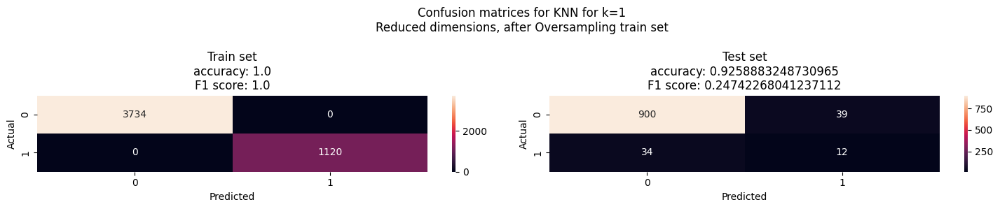

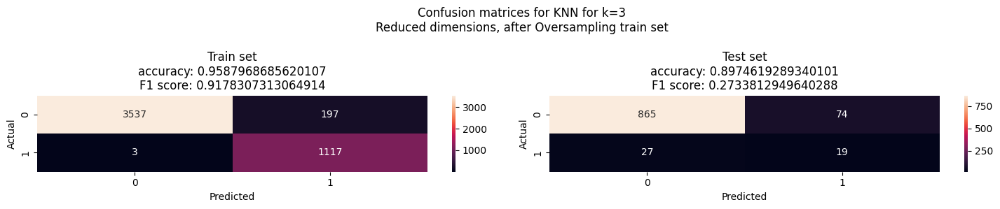

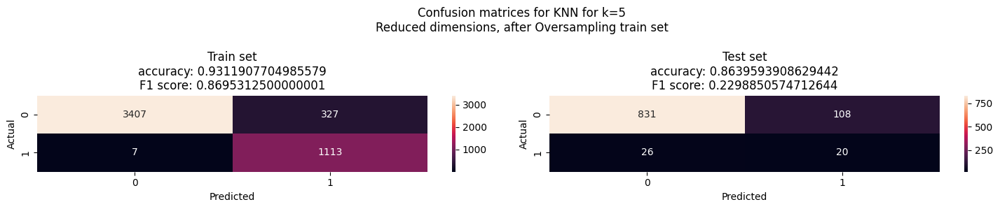

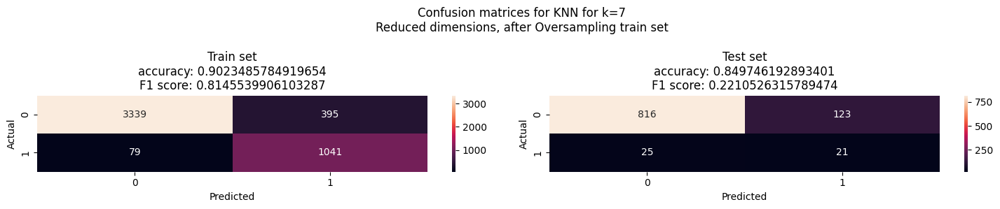

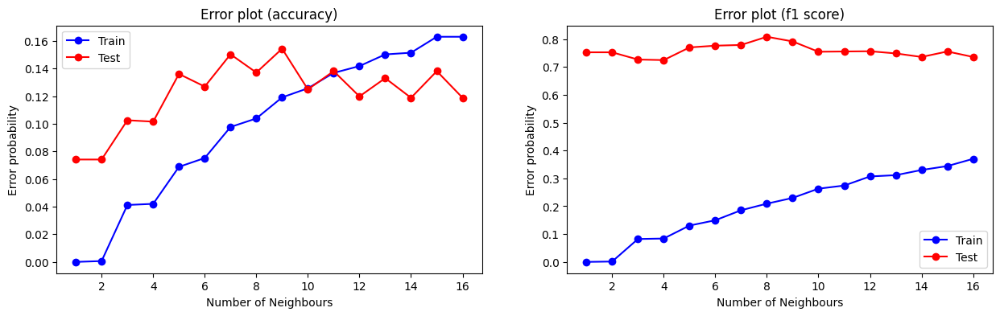

In [ ]:
rangeOfK = [1,3,5,7]
for k in rangeOfK:
    model = KNeighborsClassifier(n_neighbors=k)
    verify(model, dataTrainOversampled, allAttributesReduced, "KNN for k={0}\nReduced dimensions, after Oversampling train set".format(k))
displayErrorPlotForKNN(dataTrainOversampled, 16, allAttributesReduced)

In [ ]:
rangeOfK = [1,3,5,7]
for k in rangeOfK:
    model = KNeighborsClassifier(n_neighbors=k)
    makeNDivisionOfFrameAndCalculateMean(dfReducedROS, allAttributesReduced, model, 0.2, 20, 
                                         "{0}NN Classifier after Oversampling train set, Reduced dimensions".format(k), oversamplerROSForMean)

Scores of 20 iterations with ratio: 0.2, on model: 1NN Classifier after Oversampling train set, Reduced dimensions

Train Set Accuracy:
Mean: 1.0, Std: 0.0
Train Set F1:
Mean: 1.0, Std: 0.0

Test Set Accuracy:
Mean: 0.9158883248730965, Std: 0.00535551037779151
Test Set F1:
Mean: 0.15711360454167783, Std: 0.0496052862184563

--------------------------------------------------------------------------------------------------------------------
Scores of 20 iterations with ratio: 0.2, on model: 3NN Classifier after Oversampling train set, Reduced dimensions

Train Set Accuracy:
Mean: 0.9629526373957067, Std: 0.0017832098906217513
Train Set F1:
Mean: 0.9256072675445015, Std: 0.003326872823336304

Test Set Accuracy:
Mean: 0.8848730964467005, Std: 0.006503804011389622
Test Set F1:
Mean: 0.18651066980798214, Std: 0.042621742655190024

--------------------------------------------------------------------------------------------------------------------
Scores of 20 iterations with ratio: 0.2, on mo

### Conclusions from the analysis of the KNN classifier after dimensionality reduction and oversampling of the training set:
* Accuracy results have not decreased significantly, but F1 scores have increased significantly. For the presented k=3, they are 27%, and for the average, 18.5% for k=3.
* The results drastically dropped when the test set was not augmented.
* The results improved compared to the results without oversampling.
### 5.3.2.2 Nearest Prototype Classifier

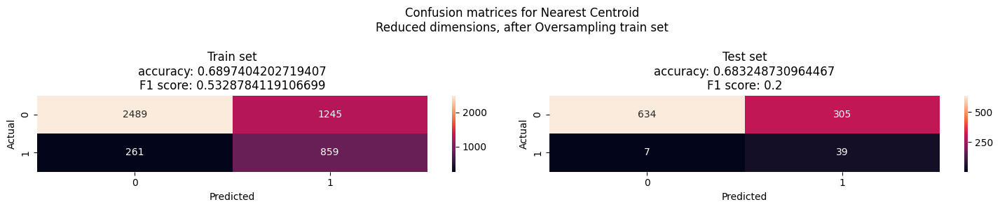

Scores of 50 iterations with ratio: 0.2, on model: Nearest Centroid after Oversampling train set, Reduced dimensions

Train Set Accuracy:
Mean: 0.7009058231879297, Std: 0.009036807150514706
Train Set F1:
Mean: 0.5494945075445749, Std: 0.010426899771554844

Test Set Accuracy:
Mean: 0.6786598984771574, Std: 0.014650615056321408
Test Set F1:
Mean: 0.19205674366998282, Std: 0.02200580060571963

--------------------------------------------------------------------------------------------------------------------


In [ ]:
model = NearestCentroid()

verify(model, dataTrainOversampled, allAttributesReduced, "Nearest Centroid\nReduced dimensions, after Oversampling train set")
makeNDivisionOfFrameAndCalculateMean(dfReducedROS, allAttributesReduced, model, 0.2, 50, 
                                     "Nearest Centroid after Oversampling train set, Reduced dimensions", oversamplerROSForMean)

### Conclusions from the analysis of the Nearest Centroid classifier after dimensionality reduction and oversampling of the training set:
* Compared to no oversampling, the results have slightly increased, but they drastically dropped compared to the augmented test set.
* The Nearest Centroid classifier has a significant tendency to classify as a stroke.
### 5.3.2.3 Naive Bayes Classifier

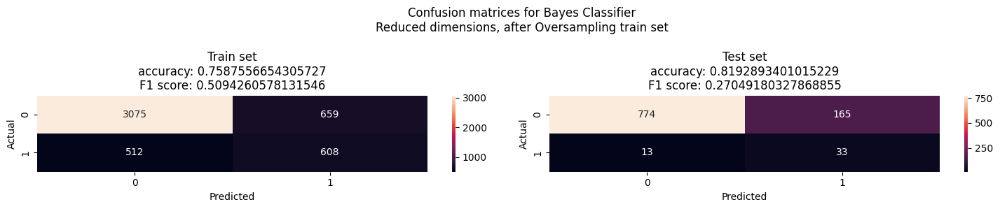

Scores of 50 iterations with ratio: 0.2, on model: Bayes Classifier after Oversampling train set, Reduced dimensions

Train Set Accuracy:
Mean: 0.7687864940813094, Std: 0.00635424199422334
Train Set F1:
Mean: 0.5436318747377918, Std: 0.016438415281595974

Test Set Accuracy:
Mean: 0.8085888324873096, Std: 0.012200004688788119
Test Set F1:
Mean: 0.2278654995941828, Std: 0.027573469216634394

--------------------------------------------------------------------------------------------------------------------


In [ ]:
model = GaussianNB()

verify(model, dataTrainOversampled, allAttributesReduced, "Bayes Classifier\nReduced dimensions, after Oversampling train set")
makeNDivisionOfFrameAndCalculateMean(dfReducedROS, allAttributesReduced, model, 0.2, 50, 
                                     "Bayes Classifier after Oversampling train set, Reduced dimensions", oversamplerROSForMean)

### Conclusions from the analysis of the Naive Bayes classifier after dimensionality reduction and oversampling of the training set:
* Compared to no oversampling, the F1 score slightly increased, but accuracy decreased. There is a tendency to misclassify as a stroke. This could be due to the use of a-priori probabilities by this classifier, which are much higher in the training set than in reality.
* The results drastically dropped when compared to the augmented test set.
### 5.3.2.4 Decision Tree Classifier

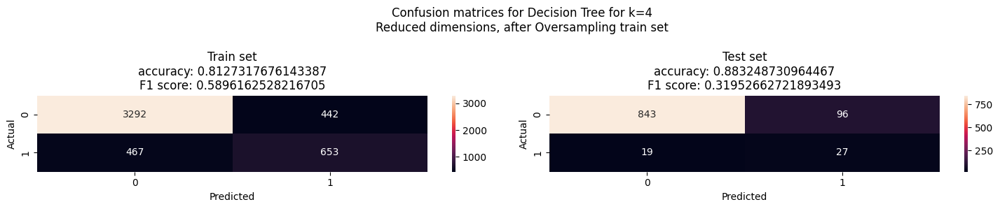

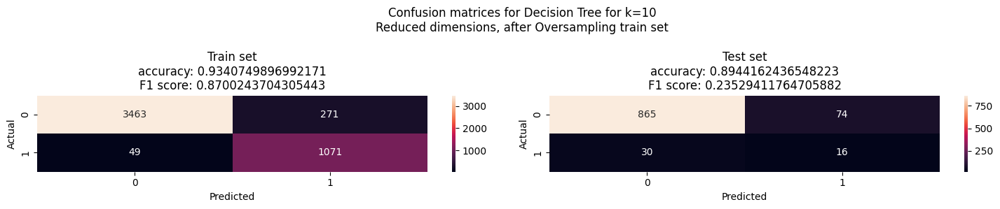

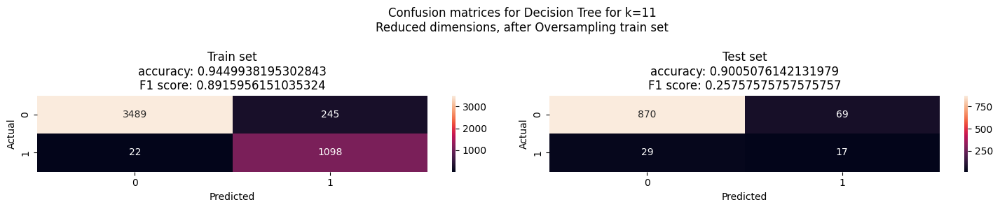

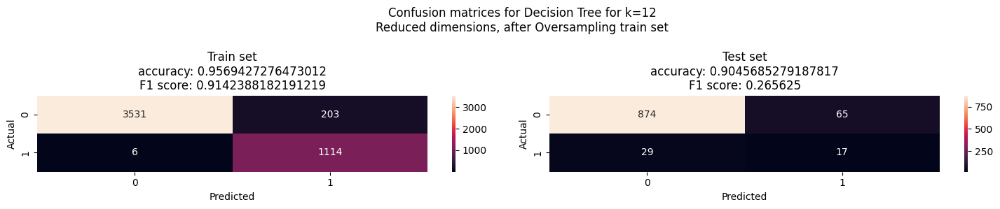

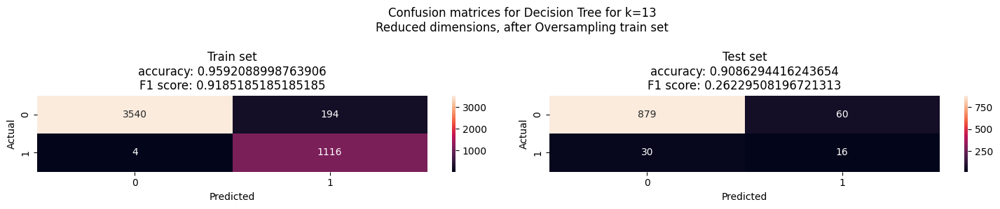

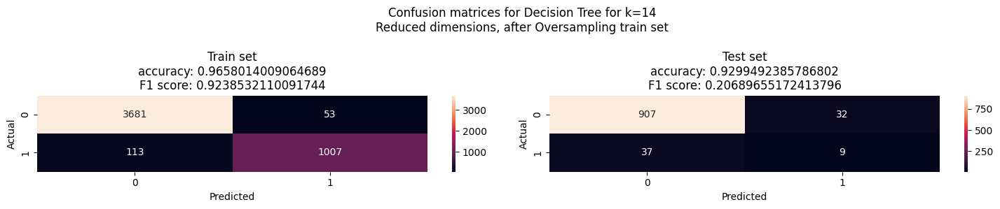

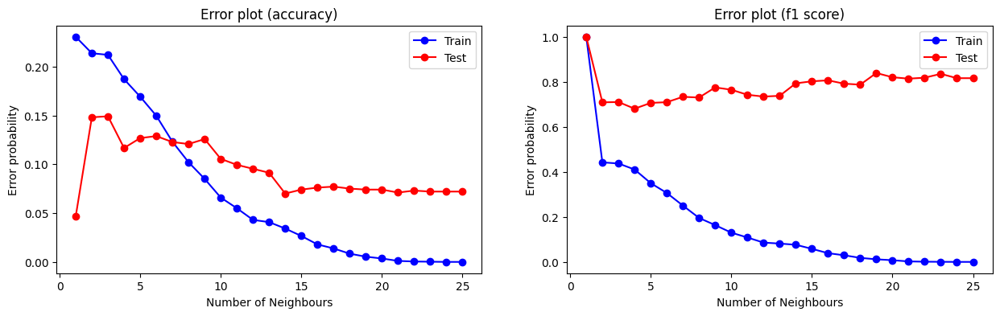

In [ ]:
rangeOfK = [4,10,11,12,13,14]
for k in rangeOfK:
    model = tree.DecisionTreeClassifier(max_depth=k, random_state=randomState)
    verify(model, dataTrainOversampled, allAttributesReduced, "Decision Tree for k={0}\nReduced dimensions, after Oversampling train set".format(k))
displayErrorPlotForDecisionTree(dataTrainOversampled, 25, allAttributesReduced)

In [ ]:
rangeOfK = [4,5,6,7,8,9,10,11,12]
for k in rangeOfK:
    model = tree.DecisionTreeClassifier(max_depth=k)
    makeNDivisionOfFrameAndCalculateMean(dfReducedROS, allAttributesReduced, model, 0.2, 50, 
                                         "Decision Tree for k={0}\nReduced Dimensions, after Oversampling train set".format(k), oversamplerROSForMean)

Scores of 50 iterations with ratio: 0.2, on model: Decision Tree for k=4
Reduced Dimensions, after Oversampling train set

Train Set Accuracy:
Mean: 0.8203641798139703, Std: 0.006659583848454258
Train Set F1:
Mean: 0.5922018841516966, Std: 0.032285978351968

Test Set Accuracy:
Mean: 0.8686091370558375, Std: 0.020295520826815037
Test Set F1:
Mean: 0.2532299641114591, Std: 0.04283951248844455

--------------------------------------------------------------------------------------------------------------------
Scores of 50 iterations with ratio: 0.2, on model: Decision Tree for k=5
Reduced Dimensions, after Oversampling train set

Train Set Accuracy:
Mean: 0.8371165962728303, Std: 0.005246517615254461
Train Set F1:
Mean: 0.6445503889944232, Std: 0.034519590416427264

Test Set Accuracy:
Mean: 0.8605076142131981, Std: 0.022388491612321676
Test Set F1:
Mean: 0.2435239182688177, Std: 0.04742756449047049

------------------------------------------------------------------------------------------

### Conclusions from the analysis of the Decision Tree classifier after dimensionality reduction and oversampling of the training set:
* Interestingly, the overall accuracy of the classifier did not decrease significantly.
* Despite a decrease in F1 for the presented split, it increased to 19.5% on average for k=11.
* We observe that the best results in terms of F1 were achieved by a tree with a depth of k=4. The average even increased to 25%.
* The general trend suggests that duplicating observations can have interesting effects on the decision tree. Despite reducing overall accuracy, it is able to increase the F1 score. We also achieve the best results so far for a shallow tree: 4. These results surpass all other results obtained for the decision tree (of course, except for augmenting the test set).

### General conclusions from the analysis of RandomOverSampler for the training set after dimensionality reduction:
* Most classifiers have worsened their overall accuracy.
* However, it turned out to be the cost of a relatively large increase in the F1 score in each case.
* In most cases, RandomOverSampling increases the tendency of classifiers to falsely classify observations as a stroke.
* An interesting case is the decision tree classifier, where oversampling allowed for a drastic pruning of the tree.
* RandomOverSampling is able to improve the assignment to the minority class, but this happens at the expense of the overall classification accuracy.

### 5.3.3 SMOTE Oversampling
In this step, we will apply the SMOTE method as a method of oversampling the training set. Unlike RandomOverSampler, SMOTE does not duplicate existing observations but generates new objects based on interpolation.  
In the SMOTE technique, first, an object of the minority class is selected.  
Then, the K nearest neighbors are found for it (usually K=5).  
New, artificial examples are generated with a randomly chosen neighbor.  
The newly generated observation has features located "between" the selected observation and the chosen neighbor.

In [ ]:
dfReducedToOversampleSMOTE = dfNormalised.loc[:,['age', 'hypertension', 'heart_disease', 'ever_married', 'avg_glucose_level',
                                                  'bmi', 'work_Self-employed', 'smoking_formerly smoked', 'smoking_never smoked', 
                                                  'smoking_smokes',"stroke"]]
dataTrainOversampledSMOTE = divide(dfReducedToOversampleSMOTE, 0.2)
oversamplerSMOTE = SMOTE(sampling_strategy=0.30, random_state=randomState)
oversamplerSMOTEForMean = SMOTE(sampling_strategy=0.30)

x = dataTrainOversampledSMOTE["descAtrsTrainSet"]
y = dataTrainOversampledSMOTE["decisiveTrain"]
x, y = oversamplerSMOTE.fit_resample(x, y)
dataTrainOversampledSMOTE["descAtrsTrainSet"] = x
dataTrainOversampledSMOTE["decisiveTrain"] = y

print("Training set", dataTrainOversampledSMOTE["decisiveTrain"].value_counts())
print("\nTest set", dataTrainOversampledSMOTE["decisiveTest"].value_counts())
print("\nDuplicates Training: ", dataTrainOversampledSMOTE["descAtrsTrainSet"].duplicated().sum())
print("Duplicates Test: ", dataTrainOversampledSMOTE["descAtrsTestSet"].duplicated().sum())

Training set stroke
False    3739
True     1121
Name: count, dtype: int64

Test set stroke
False    934
True      51
Name: count, dtype: int64

Duplicates Training:  0
Duplicates Test:  0


As we can see, SMOTE ensured that there are no duplicates in the training set.

### 5.3.3.1 K Nearest Neighbors Classifier

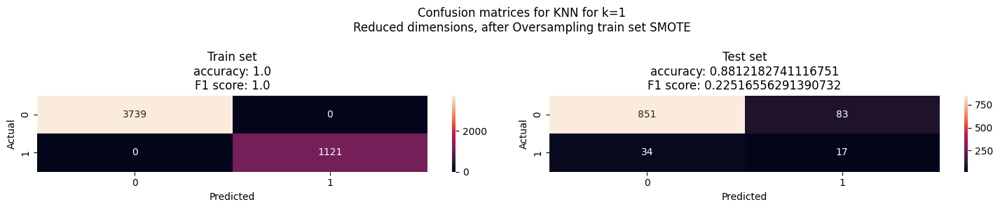

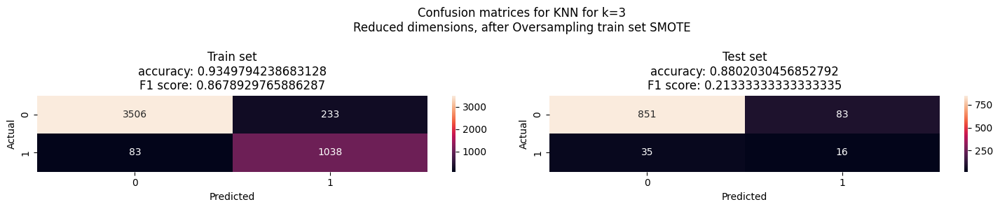

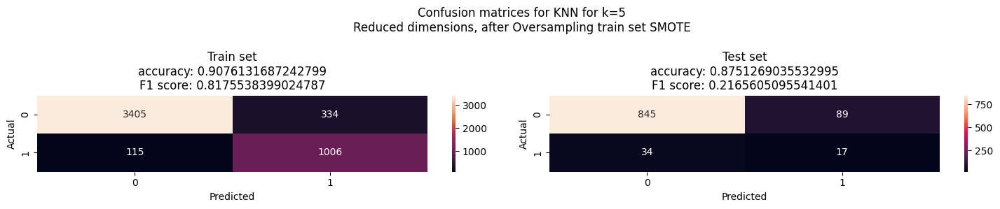

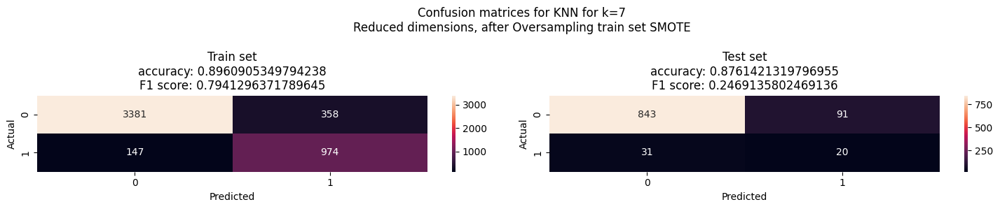

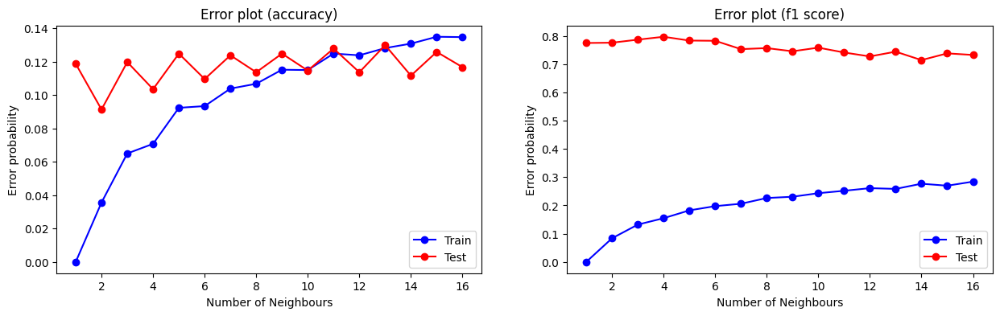

In [ ]:
rangeOfK = [1,3,5,7]
for k in rangeOfK:
    model = KNeighborsClassifier(n_neighbors=k)
    verify(model, dataTrainOversampledSMOTE, allAttributesReduced, "KNN for k={0}\nReduced dimensions, after Oversampling train set SMOTE".format(k))
displayErrorPlotForKNN(dataTrainOversampledSMOTE, 16, allAttributesReduced)

In [ ]:
rangeOfK = [1,3,5,7]
for k in rangeOfK:
    model = KNeighborsClassifier(n_neighbors=k)
    makeNDivisionOfFrameAndCalculateMean(dfReducedToOversampleSMOTE, allAttributesReduced, model, 0.2, 20, 
                                         "{0}NN Classifier after Oversampling train set SMOTE, Reduced dimensions".format(k), oversamplerSMOTEForMean)

Scores of 20 iterations with ratio: 0.2, on model: 1NN Classifier after Oversampling train set SMOTE, Reduced dimensions

Train Set Accuracy:
Mean: 1.0, Std: 0.0
Train Set F1:
Mean: 1.0, Std: 0.0

Test Set Accuracy:
Mean: 0.870761421319797, Std: 0.010363786732966724
Test Set F1:
Mean: 0.16408142442634485, Std: 0.0398830896257932

--------------------------------------------------------------------------------------------------------------------
Scores of 20 iterations with ratio: 0.2, on model: 3NN Classifier after Oversampling train set SMOTE, Reduced dimensions

Train Set Accuracy:
Mean: 0.9357489977455163, Std: 0.003882515366629066
Train Set F1:
Mean: 0.8694812394485787, Std: 0.007783201180738128

Test Set Accuracy:
Mean: 0.8655329949238579, Std: 0.011016397982309153
Test Set F1:
Mean: 0.22050839704506217, Std: 0.03839180448181226

--------------------------------------------------------------------------------------------------------------------
Scores of 20 iterations with ratio: 

### Conclusions from the analysis of the Nearest Centroid Classifier after dimensionality reduction and oversampling of the training set using SMOTE:
* The accuracy of the classifier slightly decreased compared to RandomOverSampler, but the F1 score increased.
* The best results for the presented split are achieved for k=7, and the best average is for k=3.
### 5.3.3.3 Naive Bayes Classifier

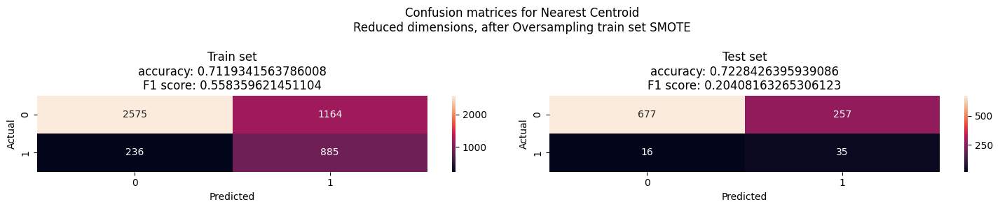

Scores of 50 iterations with ratio: 0.2, on model: Nearest Centroid after Oversampling train set SMOTE, Reduced dimensions

Train Set Accuracy:
Mean: 0.7006865760604, Std: 0.006833642805512335
Train Set F1:
Mean: 0.5532570618434888, Std: 0.009396788524271078

Test Set Accuracy:
Mean: 0.6784974619289342, Std: 0.01949179356122335
Test Set F1:
Mean: 0.19404313130938872, Std: 0.023414780310803674

--------------------------------------------------------------------------------------------------------------------


In [ ]:
model = NearestCentroid()

verify(model, dataTrainOversampledSMOTE, allAttributesReduced, "Nearest Centroid\nReduced dimensions, after Oversampling train set SMOTE")
makeNDivisionOfFrameAndCalculateMean(dfReducedToOversampleSMOTE, allAttributesReduced, model, 0.2, 50, 
                                     "Nearest Centroid after Oversampling train set SMOTE, Reduced dimensions", oversamplerSMOTEForMean)

### Conclusions from the analysis of the Naive Bayes classifier after dimensionality reduction and oversampling of the training set using SMOTE:
* The overall accuracy and F1 score increased slightly compared to RandomOverSampler.
* SMOTE did not provide significant improvement for the Naive Bayes classifier.
### 5.3.3.4 Decision Tree Classifier

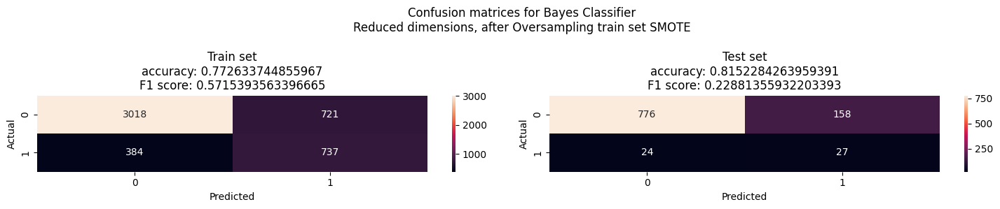

Scores of 50 iterations with ratio: 0.2, on model: Bayes Classifier after Oversampling train set SMOTE, Reduced dimensions

Train Set Accuracy:
Mean: 0.7690272920361839, Std: 0.005618641989817856
Train Set F1:
Mean: 0.559363497929645, Std: 0.014220337677588719

Test Set Accuracy:
Mean: 0.7971979695431471, Std: 0.011705649794434687
Test Set F1:
Mean: 0.23369133795711808, Std: 0.03309532434059238

--------------------------------------------------------------------------------------------------------------------


In [ ]:
model = GaussianNB()

verify(model, dataTrainOversampledSMOTE, allAttributesReduced, "Bayes Classifier\nReduced dimensions, after Oversampling train set SMOTE")
makeNDivisionOfFrameAndCalculateMean(dfReducedToOversampleSMOTE, allAttributesReduced, model, 0.2, 50, 
                                     "Bayes Classifier after Oversampling train set SMOTE, Reduced dimensions", oversamplerSMOTEForMean)

### Conclusions from the analysis of the Naive Bayes classifier after dimensionality reduction and oversampling of the training set using SMOTE:
* We observe a slight decrease in average accuracy and a decrease in the F1 score for the presented case.
### 5.3.3.4 Decision Tree Classifier

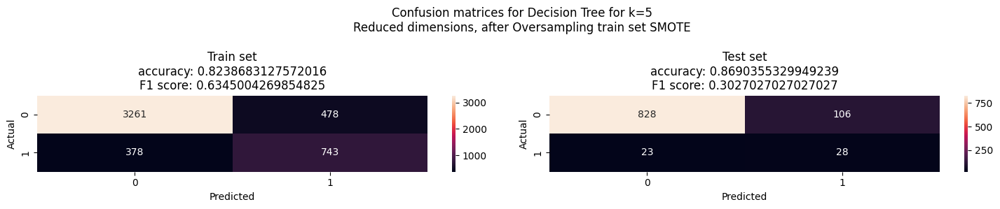

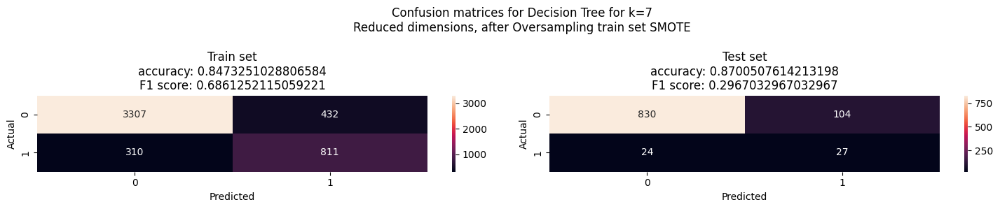

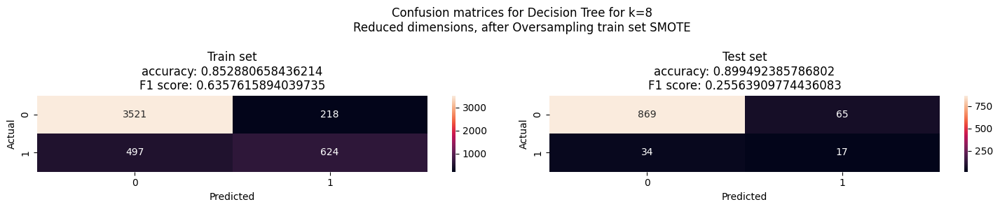

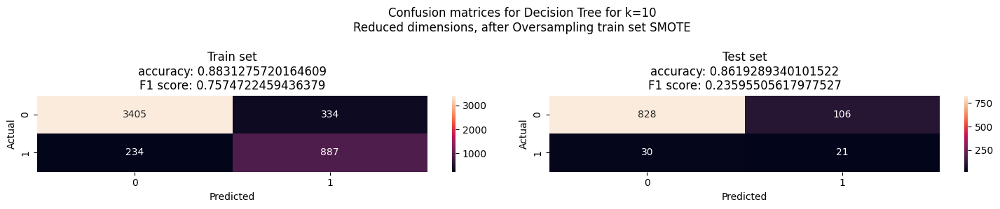

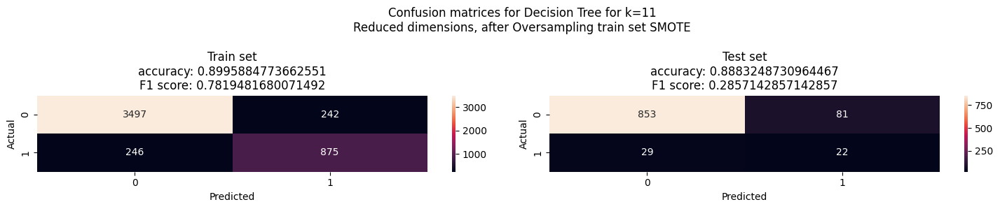

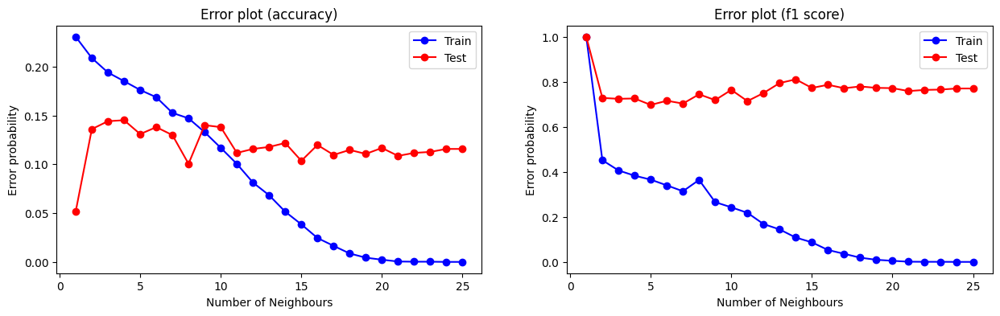

In [ ]:
rangeOfK = [5,7,8,10,11]
for k in rangeOfK:
    model = tree.DecisionTreeClassifier(max_depth=k, random_state=randomState)
    verify(model, dataTrainOversampledSMOTE, allAttributesReduced, "Decision Tree for k={0}\nReduced dimensions, after Oversampling train set SMOTE".format(k))
displayErrorPlotForDecisionTree(dataTrainOversampledSMOTE, 25, allAttributesReduced)

In [ ]:
rangeOfK = [4,5,6,7,8,9,10,11,12]
for k in rangeOfK:
    model = tree.DecisionTreeClassifier(max_depth=k)
    makeNDivisionOfFrameAndCalculateMean(dfReducedToOversampleSMOTE, allAttributesReduced, model, 0.2, 50, 
                                         "Decision Tree for k={0}\nReduced Dimensions, after Oversampling train set SMOTE".format(k), oversamplerSMOTEForMean)

Scores of 50 iterations with ratio: 0.2, on model: Decision Tree for k=4
Reduced Dimensions, after Oversampling train set SMOTE

Train Set Accuracy:
Mean: 0.8155454750872017, Std: 0.007923704236201116
Train Set F1:
Mean: 0.5930372362127393, Std: 0.054594770093954005

Test Set Accuracy:
Mean: 0.856527918781726, Std: 0.030044202878760386
Test Set F1:
Mean: 0.23621353121597036, Std: 0.03661335682715454

--------------------------------------------------------------------------------------------------------------------
Scores of 50 iterations with ratio: 0.2, on model: Decision Tree for k=5
Reduced Dimensions, after Oversampling train set SMOTE

Train Set Accuracy:
Mean: 0.8273945879497567, Std: 0.006743382249477265
Train Set F1:
Mean: 0.6127930123865056, Std: 0.048245573192079526

Test Set Accuracy:
Mean: 0.864243654822335, Std: 0.027000526314175707
Test Set F1:
Mean: 0.24801747154091192, Std: 0.04442646695986993

---------------------------------------------------------------------------

### Conclusions from the analysis of the Decision Tree classifier after dimensionality reduction and oversampling of the training set using SMOTE:
* The best result was achieved for k=5, with an average accuracy of 86% and F1 score of 25%. These results are not satisfactory.
* The SMOTE method can also lead to better results for a less deep tree.

### Conclusions from the SMOTE oversampling:
* A more complicated oversampling method does not always yield better results than simple observation duplication.
* The low effectiveness of the SMOTE method may be due to high dimensionality.

### Conclusions from supervised learning:
* The most reliable result was obtained using the Decision Tree Classifier after dimensionality reduction and oversampling with both RandomOverSampling and SMOTE methods. However, the F1 score of 25% is not satisfactory.
* It is challenging to conduct reliable classification on an imbalanced dataset. In this case, most observations are mixed, and there are no clear clusters in the data.
* Dimensionality reduction can indeed improve the accuracy of most classifiers, but in this case, it did not lead to a drastic difference.
* Oversampling an imbalanced dataset can also increase the accuracy of classifiers. However, it is not a universal solution, as there are cases where oversampling produces opposite results.
* Oversampling the test set yields impressive results on paper. However, it is essential to recognize that after oversampling, the test set no longer accurately reflects reality. Therefore, oversampling the test set is considered a distortion of reality. This is confirmed by analyses where only the training set was oversampled, resulting in a drastic decrease in accuracy.
* The more complex SMOTE method does not significantly outperform the RandomOverSampling method in this case.
* Classifiers after oversampling tend to misclassify more towards the oversampled class.